In [57]:
from sys import path as syspath
from os import path as ospath
syspath.append(ospath.join(ospath.expanduser("~"), '/data/hashemi/Freetime/Freetime-DQN/Deep-Freetime/SB3_f'))

In [58]:
import torch as torch
torch._C._cuda_getDeviceCount() > 0

True

In [59]:
import os
import gym 
import matplotlib.pyplot as plt
import numpy as np 
from SB3_f.sb3f import DQN
from SB3_f.sb3f.common.vec_env import DummyVecEnv
from SB3_f.sb3f.common.evaluation import evaluate_policy
from SB3_f.sb3f.common.callbacks import EvalCallback, StopTrainingOnRewardThreshold


In [60]:
rewards = [[1,0,5]]
from GridEnv import WindyGridworld
env = WindyGridworld(
        height=20,
        width=11,
        rewards=rewards,
        wind=True,
        allowed_actions=['L', 'R', 'C'],
        reward_terminates_episode=False
    )

In [61]:
episodes = 5
for episode in range(1, episodes+1):
    state = env.reset()
    done = False
    score = 0 
    
    while not done:
        env.render()
        action = env.action_space.sample()
        n_state, reward, done, info = env.step(action)
        score+=reward
    print('Episode:{} Score:{}'.format(episode, score))
env.close()

QObject::moveToThread: Current thread (0x55b11715fec0) is not the object's thread (0x55b1175ff2f0).
Cannot move to target thread (0x55b11715fec0)

QObject::moveToThread: Current thread (0x55b11715fec0) is not the object's thread (0x55b1175ff2f0).
Cannot move to target thread (0x55b11715fec0)

QObject::moveToThread: Current thread (0x55b11715fec0) is not the object's thread (0x55b1175ff2f0).
Cannot move to target thread (0x55b11715fec0)

QObject::moveToThread: Current thread (0x55b11715fec0) is not the object's thread (0x55b1175ff2f0).
Cannot move to target thread (0x55b11715fec0)

QObject::moveToThread: Current thread (0x55b11715fec0) is not the object's thread (0x55b1175ff2f0).
Cannot move to target thread (0x55b11715fec0)

QObject::moveToThread: Current thread (0x55b11715fec0) is not the object's thread (0x55b1175ff2f0).
Cannot move to target thread (0x55b11715fec0)

QObject::moveToThread: Current thread (0x55b11715fec0) is not the object's thread (0x55b1175ff2f0).
Cannot move to tar

Episode:1 Score:0
Episode:2 Score:0
Episode:3 Score:0
Episode:4 Score:0
Episode:5 Score:0


In [62]:
save_path = os.path.join('Training', 'Saved Models')
log_path = os.path.join('Training', 'Logs Bias Only', 'Env1')

In [63]:
stop_callback = StopTrainingOnRewardThreshold(reward_threshold=2, verbose=1)
eval_callback = EvalCallback(env, 
                             callback_on_new_best=stop_callback, 
                             eval_freq=10000, 
                             best_model_save_path=save_path, 
                             verbose=1)
opt_val = env.opt_val
opt_val

1

In [64]:
# Using same prams that performed optimally in Baseline
model = DQN('CnnPolicy', env, opt_val=opt_val, exploration_fraction=0.8,
    exploration_final_eps=0.1,learning_starts=100000,
    verbose = 1, 
    buffer_size = 50000,
    target_update_interval=1000,
    tensorboard_log=log_path)

Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Wrapping the env in a VecTransposeImage.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


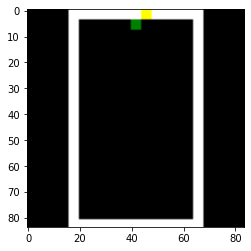

In [65]:
from SB3_f.sb3f.common.utils import obs_as_tensor
device = torch.device('cuda:0')

obs = env.canvas
plt.imshow(obs)


# Check the Network Q Value
observation = np.transpose(obs, (2, 0, 1))
observation = observation[np.newaxis, ...]
observation = obs_as_tensor(observation, device)
with torch.no_grad():
        q_values = model.q_net(observation)

In [66]:
q_values


tensor([[1.0021, 1.0004, 0.9912]], device='cuda:0')

In [67]:
model.learn(total_timesteps=1000000,callback=eval_callback, tb_log_name='Env1_Opt_0.8exp_1M')

Logging to Training/Logs Bias Only/Env1/Env1_Opt_0.8exp_1M_5
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 1        |
| time/               |          |
|    episodes         | 4        |
|    fps              | 3235     |
|    time_elapsed     | 0        |
|    total_timesteps  | 71       |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.125    |
|    exploration_rate | 1        |
| time/               |          |
|    episodes         | 8        |
|    fps              | 3236     |
|    time_elapsed     | 0        |
|    total_timesteps  | 118      |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.167    |
|    exploration_rate | 1    

/data/hashemi/Freetime/Freetime-DQN/Deep-Freetime/SB3_f/sb3f/common/callbacks.py:388: UserWarning: Training and eval env are not of the same type<sb3f.common.vec_env.vec_transpose.VecTransposeImage object at 0x7f9cc5371220> != <sb3f.common.vec_env.dummy_vec_env.DummyVecEnv object at 0x7f9cc4977d90>
  warnings.warn("Training and eval env are not of the same type" f"{self.training_env} != {self.eval_env}")


----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.188    |
|    exploration_rate | 0.999    |
| time/               |          |
|    episodes         | 32       |
|    fps              | 3266     |
|    time_elapsed     | 0        |
|    total_timesteps  | 491      |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.167    |
|    exploration_rate | 0.999    |
| time/               |          |
|    episodes         | 36       |
|    fps              | 3260     |
|    time_elapsed     | 0        |
|    total_timesteps  | 542      |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.175    |
|    exploration_rate | 0.999    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.998    |
| time/               |          |
|    episodes         | 120      |
|    fps              | 3276     |
|    time_elapsed     | 0        |
|    total_timesteps  | 1842     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.998    |
| time/               |          |
|    episodes         | 124      |
|    fps              | 3280     |
|    time_elapsed     | 0        |
|    total_timesteps  | 1920     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.998    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.997    |
| time/               |          |
|    episodes         | 208      |
|    fps              | 3259     |
|    time_elapsed     | 0        |
|    total_timesteps  | 3086     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.996    |
| time/               |          |
|    episodes         | 212      |
|    fps              | 3261     |
|    time_elapsed     | 0        |
|    total_timesteps  | 3165     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.996    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.01     |
|    exploration_rate | 0.995    |
| time/               |          |
|    episodes         | 296      |
|    fps              | 3252     |
|    time_elapsed     | 1        |
|    total_timesteps  | 4286     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.995    |
| time/               |          |
|    episodes         | 300      |
|    fps              | 3252     |
|    time_elapsed     | 1        |
|    total_timesteps  | 4347     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.995    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.994    |
| time/               |          |
|    episodes         | 384      |
|    fps              | 3247     |
|    time_elapsed     | 1        |
|    total_timesteps  | 5449     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.2     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.994    |
| time/               |          |
|    episodes         | 388      |
|    fps              | 3247     |
|    time_elapsed     | 1        |
|    total_timesteps  | 5504     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.994    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.992    |
| time/               |          |
|    episodes         | 472      |
|    fps              | 3237     |
|    time_elapsed     | 2        |
|    total_timesteps  | 6775     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.992    |
| time/               |          |
|    episodes         | 476      |
|    fps              | 3237     |
|    time_elapsed     | 2        |
|    total_timesteps  | 6850     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.992    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.991    |
| time/               |          |
|    episodes         | 560      |
|    fps              | 3239     |
|    time_elapsed     | 2        |
|    total_timesteps  | 8129     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.991    |
| time/               |          |
|    episodes         | 564      |
|    fps              | 3240     |
|    time_elapsed     | 2        |
|    total_timesteps  | 8198     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.991    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.989    |
| time/               |          |
|    episodes         | 648      |
|    fps              | 3243     |
|    time_elapsed     | 2        |
|    total_timesteps  | 9416     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.989    |
| time/               |          |
|    episodes         | 652      |
|    fps              | 3243     |
|    time_elapsed     | 2        |
|    total_timesteps  | 9469     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.989    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.988    |
| time/               |          |
|    episodes         | 732      |
|    fps              | 3190     |
|    time_elapsed     | 3        |
|    total_timesteps  | 10797    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.988    |
| time/               |          |
|    episodes         | 736      |
|    fps              | 3191     |
|    time_elapsed     | 3        |
|    total_timesteps  | 10875    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.988    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.986    |
| time/               |          |
|    episodes         | 820      |
|    fps              | 3199     |
|    time_elapsed     | 3        |
|    total_timesteps  | 12167    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.986    |
| time/               |          |
|    episodes         | 824      |
|    fps              | 3199     |
|    time_elapsed     | 3        |
|    total_timesteps  | 12209    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.986    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.985    |
| time/               |          |
|    episodes         | 908      |
|    fps              | 3204     |
|    time_elapsed     | 4        |
|    total_timesteps  | 13375    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.985    |
| time/               |          |
|    episodes         | 912      |
|    fps              | 3204     |
|    time_elapsed     | 4        |
|    total_timesteps  | 13428    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.985    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.984    |
| time/               |          |
|    episodes         | 996      |
|    fps              | 3205     |
|    time_elapsed     | 4        |
|    total_timesteps  | 14594    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.984    |
| time/               |          |
|    episodes         | 1000     |
|    fps              | 3205     |
|    time_elapsed     | 4        |
|    total_timesteps  | 14648    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.983    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.982    |
| time/               |          |
|    episodes         | 1084     |
|    fps              | 3206     |
|    time_elapsed     | 4        |
|    total_timesteps  | 15921    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.982    |
| time/               |          |
|    episodes         | 1088     |
|    fps              | 3206     |
|    time_elapsed     | 4        |
|    total_timesteps  | 15967    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.982    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.981    |
| time/               |          |
|    episodes         | 1172     |
|    fps              | 3207     |
|    time_elapsed     | 5        |
|    total_timesteps  | 17165    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.981    |
| time/               |          |
|    episodes         | 1176     |
|    fps              | 3207     |
|    time_elapsed     | 5        |
|    total_timesteps  | 17232    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.981    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.979    |
| time/               |          |
|    episodes         | 1260     |
|    fps              | 3211     |
|    time_elapsed     | 5        |
|    total_timesteps  | 18539    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.979    |
| time/               |          |
|    episodes         | 1264     |
|    fps              | 3211     |
|    time_elapsed     | 5        |
|    total_timesteps  | 18612    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.979    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.978    |
| time/               |          |
|    episodes         | 1348     |
|    fps              | 3200     |
|    time_elapsed     | 6        |
|    total_timesteps  | 19812    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.978    |
| time/               |          |
|    episodes         | 1352     |
|    fps              | 3199     |
|    time_elapsed     | 6        |
|    total_timesteps  | 19848    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.978    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.976    |
| time/               |          |
|    episodes         | 1432     |
|    fps              | 3187     |
|    time_elapsed     | 6        |
|    total_timesteps  | 20984    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.976    |
| time/               |          |
|    episodes         | 1436     |
|    fps              | 3187     |
|    time_elapsed     | 6        |
|    total_timesteps  | 21055    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.976    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.975    |
| time/               |          |
|    episodes         | 1520     |
|    fps              | 3194     |
|    time_elapsed     | 7        |
|    total_timesteps  | 22398    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.975    |
| time/               |          |
|    episodes         | 1524     |
|    fps              | 3194     |
|    time_elapsed     | 7        |
|    total_timesteps  | 22442    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.975    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.973    |
| time/               |          |
|    episodes         | 1608     |
|    fps              | 3200     |
|    time_elapsed     | 7        |
|    total_timesteps  | 23692    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.973    |
| time/               |          |
|    episodes         | 1612     |
|    fps              | 3200     |
|    time_elapsed     | 7        |
|    total_timesteps  | 23738    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.973    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.972    |
| time/               |          |
|    episodes         | 1696     |
|    fps              | 3205     |
|    time_elapsed     | 7        |
|    total_timesteps  | 24992    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.972    |
| time/               |          |
|    episodes         | 1700     |
|    fps              | 3204     |
|    time_elapsed     | 7        |
|    total_timesteps  | 25054    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.972    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.97     |
| time/               |          |
|    episodes         | 1784     |
|    fps              | 3208     |
|    time_elapsed     | 8        |
|    total_timesteps  | 26260    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.97     |
| time/               |          |
|    episodes         | 1788     |
|    fps              | 3208     |
|    time_elapsed     | 8        |
|    total_timesteps  | 26309    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.97     |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.969    |
| time/               |          |
|    episodes         | 1872     |
|    fps              | 3213     |
|    time_elapsed     | 8        |
|    total_timesteps  | 27577    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.969    |
| time/               |          |
|    episodes         | 1876     |
|    fps              | 3213     |
|    time_elapsed     | 8        |
|    total_timesteps  | 27652    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.969    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.968    |
| time/               |          |
|    episodes         | 1960     |
|    fps              | 3215     |
|    time_elapsed     | 8        |
|    total_timesteps  | 28851    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.967    |
| time/               |          |
|    episodes         | 1964     |
|    fps              | 3215     |
|    time_elapsed     | 8        |
|    total_timesteps  | 28931    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.967    |
| time/               |          |
|    episodes       

Eval num_timesteps=30000, episode_reward=0.00 +/- 0.00
Episode length: 8.00 +/- 2.45
----------------------------------
| eval/               |          |
|    mean_ep_length   | 8        |
|    mean_reward      | 0        |
| rollout/            |          |
|    exploration_rate | 0.966    |
| time/               |          |
|    total_timesteps  | 30000    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.966    |
| time/               |          |
|    episodes         | 2048     |
|    fps              | 3207     |
|    time_elapsed     | 9        |
|    total_timesteps  | 30034    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.966    |
| time/               |          |
|    

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.965    |
| time/               |          |
|    episodes         | 2132     |
|    fps              | 3212     |
|    time_elapsed     | 9        |
|    total_timesteps  | 31316    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.965    |
| time/               |          |
|    episodes         | 2136     |
|    fps              | 3212     |
|    time_elapsed     | 9        |
|    total_timesteps  | 31378    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.965    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.963    |
| time/               |          |
|    episodes         | 2220     |
|    fps              | 3216     |
|    time_elapsed     | 10       |
|    total_timesteps  | 32583    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.963    |
| time/               |          |
|    episodes         | 2224     |
|    fps              | 3216     |
|    time_elapsed     | 10       |
|    total_timesteps  | 32644    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.963    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.962    |
| time/               |          |
|    episodes         | 2308     |
|    fps              | 3220     |
|    time_elapsed     | 10       |
|    total_timesteps  | 33913    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.962    |
| time/               |          |
|    episodes         | 2312     |
|    fps              | 3220     |
|    time_elapsed     | 10       |
|    total_timesteps  | 33974    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.962    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.96     |
| time/               |          |
|    episodes         | 2396     |
|    fps              | 3223     |
|    time_elapsed     | 10       |
|    total_timesteps  | 35166    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.96     |
| time/               |          |
|    episodes         | 2400     |
|    fps              | 3223     |
|    time_elapsed     | 10       |
|    total_timesteps  | 35226    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.96     |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.959    |
| time/               |          |
|    episodes         | 2484     |
|    fps              | 3227     |
|    time_elapsed     | 11       |
|    total_timesteps  | 36533    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.959    |
| time/               |          |
|    episodes         | 2488     |
|    fps              | 3228     |
|    time_elapsed     | 11       |
|    total_timesteps  | 36611    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.959    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.957    |
| time/               |          |
|    episodes         | 2572     |
|    fps              | 3232     |
|    time_elapsed     | 11       |
|    total_timesteps  | 37936    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.957    |
| time/               |          |
|    episodes         | 2576     |
|    fps              | 3232     |
|    time_elapsed     | 11       |
|    total_timesteps  | 38011    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.957    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.956    |
| time/               |          |
|    episodes         | 2660     |
|    fps              | 3235     |
|    time_elapsed     | 12       |
|    total_timesteps  | 39247    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.956    |
| time/               |          |
|    episodes         | 2664     |
|    fps              | 3235     |
|    time_elapsed     | 12       |
|    total_timesteps  | 39293    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.956    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.954    |
| time/               |          |
|    episodes         | 2744     |
|    fps              | 3233     |
|    time_elapsed     | 12       |
|    total_timesteps  | 40529    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.954    |
| time/               |          |
|    episodes         | 2748     |
|    fps              | 3233     |
|    time_elapsed     | 12       |
|    total_timesteps  | 40597    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.954    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.953    |
| time/               |          |
|    episodes         | 2832     |
|    fps              | 3236     |
|    time_elapsed     | 12       |
|    total_timesteps  | 41850    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.953    |
| time/               |          |
|    episodes         | 2836     |
|    fps              | 3236     |
|    time_elapsed     | 12       |
|    total_timesteps  | 41893    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.953    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.952    |
| time/               |          |
|    episodes         | 2920     |
|    fps              | 3239     |
|    time_elapsed     | 13       |
|    total_timesteps  | 43092    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.951    |
| time/               |          |
|    episodes         | 2924     |
|    fps              | 3239     |
|    time_elapsed     | 13       |
|    total_timesteps  | 43172    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.951    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.95     |
| time/               |          |
|    episodes         | 3008     |
|    fps              | 3243     |
|    time_elapsed     | 13       |
|    total_timesteps  | 44426    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.95     |
| time/               |          |
|    episodes         | 3012     |
|    fps              | 3243     |
|    time_elapsed     | 13       |
|    total_timesteps  | 44477    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.95     |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.949    |
| time/               |          |
|    episodes         | 3096     |
|    fps              | 3247     |
|    time_elapsed     | 14       |
|    total_timesteps  | 45748    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.948    |
| time/               |          |
|    episodes         | 3100     |
|    fps              | 3247     |
|    time_elapsed     | 14       |
|    total_timesteps  | 45797    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.948    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.947    |
| time/               |          |
|    episodes         | 3184     |
|    fps              | 3250     |
|    time_elapsed     | 14       |
|    total_timesteps  | 47184    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.947    |
| time/               |          |
|    episodes         | 3188     |
|    fps              | 3251     |
|    time_elapsed     | 14       |
|    total_timesteps  | 47263    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.947    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.946    |
| time/               |          |
|    episodes         | 3272     |
|    fps              | 3253     |
|    time_elapsed     | 14       |
|    total_timesteps  | 48359    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.946    |
| time/               |          |
|    episodes         | 3276     |
|    fps              | 3253     |
|    time_elapsed     | 14       |
|    total_timesteps  | 48392    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.945    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.944    |
| time/               |          |
|    episodes         | 3360     |
|    fps              | 3256     |
|    time_elapsed     | 15       |
|    total_timesteps  | 49683    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.944    |
| time/               |          |
|    episodes         | 3364     |
|    fps              | 3256     |
|    time_elapsed     | 15       |
|    total_timesteps  | 49755    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.944    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.943    |
| time/               |          |
|    episodes         | 3444     |
|    fps              | 3254     |
|    time_elapsed     | 15       |
|    total_timesteps  | 50912    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.943    |
| time/               |          |
|    episodes         | 3448     |
|    fps              | 3254     |
|    time_elapsed     | 15       |
|    total_timesteps  | 50983    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.943    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.941    |
| time/               |          |
|    episodes         | 3532     |
|    fps              | 3259     |
|    time_elapsed     | 16       |
|    total_timesteps  | 52204    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.941    |
| time/               |          |
|    episodes         | 3536     |
|    fps              | 3259     |
|    time_elapsed     | 16       |
|    total_timesteps  | 52268    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.941    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.94     |
| time/               |          |
|    episodes         | 3620     |
|    fps              | 3264     |
|    time_elapsed     | 16       |
|    total_timesteps  | 53423    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.94     |
| time/               |          |
|    episodes         | 3624     |
|    fps              | 3264     |
|    time_elapsed     | 16       |
|    total_timesteps  | 53475    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.94     |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.938    |
| time/               |          |
|    episodes         | 3708     |
|    fps              | 3269     |
|    time_elapsed     | 16       |
|    total_timesteps  | 54711    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.938    |
| time/               |          |
|    episodes         | 3712     |
|    fps              | 3269     |
|    time_elapsed     | 16       |
|    total_timesteps  | 54773    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.938    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.937    |
| time/               |          |
|    episodes         | 3796     |
|    fps              | 3274     |
|    time_elapsed     | 17       |
|    total_timesteps  | 56054    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.937    |
| time/               |          |
|    episodes         | 3800     |
|    fps              | 3275     |
|    time_elapsed     | 17       |
|    total_timesteps  | 56134    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.937    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.936    |
| time/               |          |
|    episodes         | 3884     |
|    fps              | 3279     |
|    time_elapsed     | 17       |
|    total_timesteps  | 57263    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.936    |
| time/               |          |
|    episodes         | 3888     |
|    fps              | 3279     |
|    time_elapsed     | 17       |
|    total_timesteps  | 57315    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.935    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.934    |
| time/               |          |
|    episodes         | 3972     |
|    fps              | 3283     |
|    time_elapsed     | 17       |
|    total_timesteps  | 58468    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.934    |
| time/               |          |
|    episodes         | 3976     |
|    fps              | 3283     |
|    time_elapsed     | 17       |
|    total_timesteps  | 58534    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.934    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.933    |
| time/               |          |
|    episodes         | 4060     |
|    fps              | 3287     |
|    time_elapsed     | 18       |
|    total_timesteps  | 59697    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.933    |
| time/               |          |
|    episodes         | 4064     |
|    fps              | 3287     |
|    time_elapsed     | 18       |
|    total_timesteps  | 59776    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.933    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.931    |
| time/               |          |
|    episodes         | 4144     |
|    fps              | 3287     |
|    time_elapsed     | 18       |
|    total_timesteps  | 60974    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.931    |
| time/               |          |
|    episodes         | 4148     |
|    fps              | 3287     |
|    time_elapsed     | 18       |
|    total_timesteps  | 61026    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.931    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.93     |
| time/               |          |
|    episodes         | 4232     |
|    fps              | 3291     |
|    time_elapsed     | 18       |
|    total_timesteps  | 62199    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.93     |
| time/               |          |
|    episodes         | 4236     |
|    fps              | 3291     |
|    time_elapsed     | 18       |
|    total_timesteps  | 62273    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.93     |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.929    |
| time/               |          |
|    episodes         | 4320     |
|    fps              | 3295     |
|    time_elapsed     | 19       |
|    total_timesteps  | 63537    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.928    |
| time/               |          |
|    episodes         | 4324     |
|    fps              | 3296     |
|    time_elapsed     | 19       |
|    total_timesteps  | 63617    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.928    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.927    |
| time/               |          |
|    episodes         | 4408     |
|    fps              | 3299     |
|    time_elapsed     | 19       |
|    total_timesteps  | 64847    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.927    |
| time/               |          |
|    episodes         | 4412     |
|    fps              | 3299     |
|    time_elapsed     | 19       |
|    total_timesteps  | 64913    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.927    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.926    |
| time/               |          |
|    episodes         | 4496     |
|    fps              | 3302     |
|    time_elapsed     | 20       |
|    total_timesteps  | 66136    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.926    |
| time/               |          |
|    episodes         | 4500     |
|    fps              | 3302     |
|    time_elapsed     | 20       |
|    total_timesteps  | 66216    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.925    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.924    |
| time/               |          |
|    episodes         | 4584     |
|    fps              | 3306     |
|    time_elapsed     | 20       |
|    total_timesteps  | 67495    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.924    |
| time/               |          |
|    episodes         | 4588     |
|    fps              | 3306     |
|    time_elapsed     | 20       |
|    total_timesteps  | 67536    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.924    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.923    |
| time/               |          |
|    episodes         | 4672     |
|    fps              | 3310     |
|    time_elapsed     | 20       |
|    total_timesteps  | 68754    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.923    |
| time/               |          |
|    episodes         | 4676     |
|    fps              | 3310     |
|    time_elapsed     | 20       |
|    total_timesteps  | 68817    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.923    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.921    |
| time/               |          |
|    episodes         | 4756     |
|    fps              | 3309     |
|    time_elapsed     | 21       |
|    total_timesteps  | 70084    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.921    |
| time/               |          |
|    episodes         | 4760     |
|    fps              | 3310     |
|    time_elapsed     | 21       |
|    total_timesteps  | 70163    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.921    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.92     |
| time/               |          |
|    episodes         | 4844     |
|    fps              | 3312     |
|    time_elapsed     | 21       |
|    total_timesteps  | 71298    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.92     |
| time/               |          |
|    episodes         | 4848     |
|    fps              | 3312     |
|    time_elapsed     | 21       |
|    total_timesteps  | 71359    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.92     |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.918    |
| time/               |          |
|    episodes         | 4932     |
|    fps              | 3315     |
|    time_elapsed     | 21       |
|    total_timesteps  | 72526    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.918    |
| time/               |          |
|    episodes         | 4936     |
|    fps              | 3315     |
|    time_elapsed     | 21       |
|    total_timesteps  | 72582    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.918    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.917    |
| time/               |          |
|    episodes         | 5020     |
|    fps              | 3319     |
|    time_elapsed     | 22       |
|    total_timesteps  | 73951    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.917    |
| time/               |          |
|    episodes         | 5024     |
|    fps              | 3319     |
|    time_elapsed     | 22       |
|    total_timesteps  | 74016    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.917    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.915    |
| time/               |          |
|    episodes         | 5108     |
|    fps              | 3322     |
|    time_elapsed     | 22       |
|    total_timesteps  | 75212    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.915    |
| time/               |          |
|    episodes         | 5112     |
|    fps              | 3322     |
|    time_elapsed     | 22       |
|    total_timesteps  | 75262    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.915    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.914    |
| time/               |          |
|    episodes         | 5196     |
|    fps              | 3324     |
|    time_elapsed     | 23       |
|    total_timesteps  | 76535    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.914    |
| time/               |          |
|    episodes         | 5200     |
|    fps              | 3324     |
|    time_elapsed     | 23       |
|    total_timesteps  | 76584    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.914    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.913    |
| time/               |          |
|    episodes         | 5284     |
|    fps              | 3327     |
|    time_elapsed     | 23       |
|    total_timesteps  | 77763    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.912    |
| time/               |          |
|    episodes         | 5288     |
|    fps              | 3327     |
|    time_elapsed     | 23       |
|    total_timesteps  | 77797    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.912    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.911    |
| time/               |          |
|    episodes         | 5372     |
|    fps              | 3329     |
|    time_elapsed     | 23       |
|    total_timesteps  | 79132    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.911    |
| time/               |          |
|    episodes         | 5376     |
|    fps              | 3329     |
|    time_elapsed     | 23       |
|    total_timesteps  | 79199    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.911    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.91     |
| time/               |          |
|    episodes         | 5456     |
|    fps              | 3330     |
|    time_elapsed     | 24       |
|    total_timesteps  | 80421    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.909    |
| time/               |          |
|    episodes         | 5460     |
|    fps              | 3330     |
|    time_elapsed     | 24       |
|    total_timesteps  | 80455    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.909    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.908    |
| time/               |          |
|    episodes         | 5544     |
|    fps              | 3333     |
|    time_elapsed     | 24       |
|    total_timesteps  | 81817    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.908    |
| time/               |          |
|    episodes         | 5548     |
|    fps              | 3333     |
|    time_elapsed     | 24       |
|    total_timesteps  | 81876    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.908    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.907    |
| time/               |          |
|    episodes         | 5632     |
|    fps              | 3335     |
|    time_elapsed     | 24       |
|    total_timesteps  | 83105    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.906    |
| time/               |          |
|    episodes         | 5636     |
|    fps              | 3335     |
|    time_elapsed     | 24       |
|    total_timesteps  | 83185    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.906    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.905    |
| time/               |          |
|    episodes         | 5720     |
|    fps              | 3337     |
|    time_elapsed     | 25       |
|    total_timesteps  | 84530    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.905    |
| time/               |          |
|    episodes         | 5724     |
|    fps              | 3337     |
|    time_elapsed     | 25       |
|    total_timesteps  | 84594    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.905    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.903    |
| time/               |          |
|    episodes         | 5808     |
|    fps              | 3339     |
|    time_elapsed     | 25       |
|    total_timesteps  | 85863    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.903    |
| time/               |          |
|    episodes         | 5812     |
|    fps              | 3340     |
|    time_elapsed     | 25       |
|    total_timesteps  | 85935    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.903    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.902    |
| time/               |          |
|    episodes         | 5896     |
|    fps              | 3342     |
|    time_elapsed     | 26       |
|    total_timesteps  | 87160    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.902    |
| time/               |          |
|    episodes         | 5900     |
|    fps              | 3342     |
|    time_elapsed     | 26       |
|    total_timesteps  | 87192    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.902    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.901    |
| time/               |          |
|    episodes         | 5984     |
|    fps              | 3344     |
|    time_elapsed     | 26       |
|    total_timesteps  | 88389    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.901    |
| time/               |          |
|    episodes         | 5988     |
|    fps              | 3344     |
|    time_elapsed     | 26       |
|    total_timesteps  | 88426    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.9      |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.899    |
| time/               |          |
|    episodes         | 6072     |
|    fps              | 3347     |
|    time_elapsed     | 26       |
|    total_timesteps  | 89692    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.899    |
| time/               |          |
|    episodes         | 6076     |
|    fps              | 3347     |
|    time_elapsed     | 26       |
|    total_timesteps  | 89771    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.899    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.898    |
| time/               |          |
|    episodes         | 6156     |
|    fps              | 3346     |
|    time_elapsed     | 27       |
|    total_timesteps  | 91062    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.897    |
| time/               |          |
|    episodes         | 6160     |
|    fps              | 3346     |
|    time_elapsed     | 27       |
|    total_timesteps  | 91113    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.897    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.896    |
| time/               |          |
|    episodes         | 6244     |
|    fps              | 3348     |
|    time_elapsed     | 27       |
|    total_timesteps  | 92253    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.896    |
| time/               |          |
|    episodes         | 6248     |
|    fps              | 3348     |
|    time_elapsed     | 27       |
|    total_timesteps  | 92317    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.896    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.895    |
| time/               |          |
|    episodes         | 6332     |
|    fps              | 3350     |
|    time_elapsed     | 27       |
|    total_timesteps  | 93412    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.895    |
| time/               |          |
|    episodes         | 6336     |
|    fps              | 3350     |
|    time_elapsed     | 27       |
|    total_timesteps  | 93490    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.895    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.893    |
| time/               |          |
|    episodes         | 6420     |
|    fps              | 3352     |
|    time_elapsed     | 28       |
|    total_timesteps  | 94786    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.893    |
| time/               |          |
|    episodes         | 6424     |
|    fps              | 3352     |
|    time_elapsed     | 28       |
|    total_timesteps  | 94805    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.893    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.892    |
| time/               |          |
|    episodes         | 6508     |
|    fps              | 3353     |
|    time_elapsed     | 28       |
|    total_timesteps  | 96019    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.892    |
| time/               |          |
|    episodes         | 6512     |
|    fps              | 3353     |
|    time_elapsed     | 28       |
|    total_timesteps  | 96085    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.892    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.89     |
| time/               |          |
|    episodes         | 6596     |
|    fps              | 3355     |
|    time_elapsed     | 29       |
|    total_timesteps  | 97376    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.89     |
| time/               |          |
|    episodes         | 6600     |
|    fps              | 3355     |
|    time_elapsed     | 29       |
|    total_timesteps  | 97431    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.89     |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.889    |
| time/               |          |
|    episodes         | 6684     |
|    fps              | 3357     |
|    time_elapsed     | 29       |
|    total_timesteps  | 98670    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.889    |
| time/               |          |
|    episodes         | 6688     |
|    fps              | 3357     |
|    time_elapsed     | 29       |
|    total_timesteps  | 98743    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.889    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.888    |
| time/               |          |
|    episodes         | 6772     |
|    fps              | 3359     |
|    time_elapsed     | 29       |
|    total_timesteps  | 99951    |
----------------------------------
Eval num_timesteps=100000, episode_reward=0.00 +/- 0.00
Episode length: 5.60 +/- 2.80
----------------------------------
| eval/               |          |
|    mean_ep_length   | 5.6      |
|    mean_reward      | 0        |
| rollout/            |          |
|    exploration_rate | 0.888    |
| time/               |          |
|    total_timesteps  | 100000   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.887    |
| time/               |          |
|   

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.886    |
| time/               |          |
|    episodes         | 6836     |
|    fps              | 3254     |
|    time_elapsed     | 31       |
|    total_timesteps  | 101007   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0287   |
|    n_updates        | 251      |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.886    |
| time/               |          |
|    episodes         | 6840     |
|    fps              | 3249     |
|    time_elapsed     | 31       |
|    total_timesteps  | 101066   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0531   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.885    |
| time/               |          |
|    episodes         | 6900     |
|    fps              | 3165     |
|    time_elapsed     | 32       |
|    total_timesteps  | 101960   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0138   |
|    n_updates        | 489      |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.885    |
| time/               |          |
|    episodes         | 6904     |
|    fps              | 3160     |
|    time_elapsed     | 32       |
|    total_timesteps  | 102023   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0508   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.884    |
| time/               |          |
|    episodes         | 6964     |
|    fps              | 3089     |
|    time_elapsed     | 33       |
|    total_timesteps  | 102880   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.025    |
|    n_updates        | 719      |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.884    |
| time/               |          |
|    episodes         | 6968     |
|    fps              | 3085     |
|    time_elapsed     | 33       |
|    total_timesteps  | 102940   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0247   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.883    |
| time/               |          |
|    episodes         | 7028     |
|    fps              | 3013     |
|    time_elapsed     | 34       |
|    total_timesteps  | 103854   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0457   |
|    n_updates        | 963      |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.883    |
| time/               |          |
|    episodes         | 7032     |
|    fps              | 3009     |
|    time_elapsed     | 34       |
|    total_timesteps  | 103912   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00311  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.882    |
| time/               |          |
|    episodes         | 7092     |
|    fps              | 2940     |
|    time_elapsed     | 35       |
|    total_timesteps  | 104885   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0225   |
|    n_updates        | 1221     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.882    |
| time/               |          |
|    episodes         | 7096     |
|    fps              | 2937     |
|    time_elapsed     | 35       |
|    total_timesteps  | 104941   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0124   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.881    |
| time/               |          |
|    episodes         | 7156     |
|    fps              | 2869     |
|    time_elapsed     | 36       |
|    total_timesteps  | 105859   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0194   |
|    n_updates        | 1464     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.881    |
| time/               |          |
|    episodes         | 7160     |
|    fps              | 2863     |
|    time_elapsed     | 36       |
|    total_timesteps  | 105939   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0187   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.88     |
| time/               |          |
|    episodes         | 7220     |
|    fps              | 2803     |
|    time_elapsed     | 38       |
|    total_timesteps  | 106846   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00947  |
|    n_updates        | 1711     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.88     |
| time/               |          |
|    episodes         | 7224     |
|    fps              | 2800     |
|    time_elapsed     | 38       |
|    total_timesteps  | 106907   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0271   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.879    |
| time/               |          |
|    episodes         | 7284     |
|    fps              | 2745     |
|    time_elapsed     | 39       |
|    total_timesteps  | 107825   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0345   |
|    n_updates        | 1956     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.879    |
| time/               |          |
|    episodes         | 7288     |
|    fps              | 2742     |
|    time_elapsed     | 39       |
|    total_timesteps  | 107892   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.018    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.878    |
| time/               |          |
|    episodes         | 7348     |
|    fps              | 2687     |
|    time_elapsed     | 40       |
|    total_timesteps  | 108877   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00138  |
|    n_updates        | 2219     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.877    |
| time/               |          |
|    episodes         | 7352     |
|    fps              | 2684     |
|    time_elapsed     | 40       |
|    total_timesteps  | 108942   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0245   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.876    |
| time/               |          |
|    episodes         | 7412     |
|    fps              | 2640     |
|    time_elapsed     | 41       |
|    total_timesteps  | 109791   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.03     |
|    n_updates        | 2447     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.876    |
| time/               |          |
|    episodes         | 7416     |
|    fps              | 2637     |
|    time_elapsed     | 41       |
|    total_timesteps  | 109854   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0236   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.875    |
| time/               |          |
|    episodes         | 7472     |
|    fps              | 2590     |
|    time_elapsed     | 42       |
|    total_timesteps  | 110734   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00688  |
|    n_updates        | 2683     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.875    |
| time/               |          |
|    episodes         | 7476     |
|    fps              | 2586     |
|    time_elapsed     | 42       |
|    total_timesteps  | 110807   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0195   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.874    |
| time/               |          |
|    episodes         | 7536     |
|    fps              | 2547     |
|    time_elapsed     | 43       |
|    total_timesteps  | 111687   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00578  |
|    n_updates        | 2921     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.874    |
| time/               |          |
|    episodes         | 7540     |
|    fps              | 2544     |
|    time_elapsed     | 43       |
|    total_timesteps  | 111750   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0044   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.873    |
| time/               |          |
|    episodes         | 7600     |
|    fps              | 2503     |
|    time_elapsed     | 44       |
|    total_timesteps  | 112650   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0204   |
|    n_updates        | 3162     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.873    |
| time/               |          |
|    episodes         | 7604     |
|    fps              | 2499     |
|    time_elapsed     | 45       |
|    total_timesteps  | 112730   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00555  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.872    |
| time/               |          |
|    episodes         | 7664     |
|    fps              | 2457     |
|    time_elapsed     | 46       |
|    total_timesteps  | 113683   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0127   |
|    n_updates        | 3420     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.872    |
| time/               |          |
|    episodes         | 7668     |
|    fps              | 2455     |
|    time_elapsed     | 46       |
|    total_timesteps  | 113735   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00517  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.871    |
| time/               |          |
|    episodes         | 7728     |
|    fps              | 2421     |
|    time_elapsed     | 47       |
|    total_timesteps  | 114579   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0102   |
|    n_updates        | 3644     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.871    |
| time/               |          |
|    episodes         | 7732     |
|    fps              | 2419     |
|    time_elapsed     | 47       |
|    total_timesteps  | 114641   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0176   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.87     |
| time/               |          |
|    episodes         | 7792     |
|    fps              | 2384     |
|    time_elapsed     | 48       |
|    total_timesteps  | 115545   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00412  |
|    n_updates        | 3886     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.87     |
| time/               |          |
|    episodes         | 7796     |
|    fps              | 2381     |
|    time_elapsed     | 48       |
|    total_timesteps  | 115625   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00437  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.869    |
| time/               |          |
|    episodes         | 7856     |
|    fps              | 2351     |
|    time_elapsed     | 49       |
|    total_timesteps  | 116479   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000719 |
|    n_updates        | 4119     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.869    |
| time/               |          |
|    episodes         | 7860     |
|    fps              | 2349     |
|    time_elapsed     | 49       |
|    total_timesteps  | 116528   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00859  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.868    |
| time/               |          |
|    episodes         | 7920     |
|    fps              | 2319     |
|    time_elapsed     | 50       |
|    total_timesteps  | 117403   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.007    |
|    n_updates        | 4350     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.868    |
| time/               |          |
|    episodes         | 7924     |
|    fps              | 2317     |
|    time_elapsed     | 50       |
|    total_timesteps  | 117446   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0044   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.867    |
| time/               |          |
|    episodes         | 7984     |
|    fps              | 2286     |
|    time_elapsed     | 51       |
|    total_timesteps  | 118372   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0104   |
|    n_updates        | 4592     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.867    |
| time/               |          |
|    episodes         | 7988     |
|    fps              | 2284     |
|    time_elapsed     | 51       |
|    total_timesteps  | 118435   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00408  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.866    |
| time/               |          |
|    episodes         | 8048     |
|    fps              | 2257     |
|    time_elapsed     | 52       |
|    total_timesteps  | 119298   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00629  |
|    n_updates        | 4824     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.866    |
| time/               |          |
|    episodes         | 8052     |
|    fps              | 2254     |
|    time_elapsed     | 52       |
|    total_timesteps  | 119378   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00321  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.865    |
| time/               |          |
|    episodes         | 8108     |
|    fps              | 2225     |
|    time_elapsed     | 54       |
|    total_timesteps  | 120210   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000287 |
|    n_updates        | 5052     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.865    |
| time/               |          |
|    episodes         | 8112     |
|    fps              | 2223     |
|    time_elapsed     | 54       |
|    total_timesteps  | 120275   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000564 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.864    |
| time/               |          |
|    episodes         | 8172     |
|    fps              | 2199     |
|    time_elapsed     | 55       |
|    total_timesteps  | 121141   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00874  |
|    n_updates        | 5285     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.864    |
| time/               |          |
|    episodes         | 8176     |
|    fps              | 2197     |
|    time_elapsed     | 55       |
|    total_timesteps  | 121203   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00886  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.863    |
| time/               |          |
|    episodes         | 8236     |
|    fps              | 2171     |
|    time_elapsed     | 56       |
|    total_timesteps  | 122152   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0165   |
|    n_updates        | 5537     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.862    |
| time/               |          |
|    episodes         | 8240     |
|    fps              | 2169     |
|    time_elapsed     | 56       |
|    total_timesteps  | 122227   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00276  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.862    |
| time/               |          |
|    episodes         | 8300     |
|    fps              | 2147     |
|    time_elapsed     | 57       |
|    total_timesteps  | 123047   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0032   |
|    n_updates        | 5761     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.861    |
| time/               |          |
|    episodes         | 8304     |
|    fps              | 2145     |
|    time_elapsed     | 57       |
|    total_timesteps  | 123126   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0129   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.86     |
| time/               |          |
|    episodes         | 8364     |
|    fps              | 2120     |
|    time_elapsed     | 58       |
|    total_timesteps  | 124109   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00428  |
|    n_updates        | 6027     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.86     |
| time/               |          |
|    episodes         | 8368     |
|    fps              | 2119     |
|    time_elapsed     | 58       |
|    total_timesteps  | 124161   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00246  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.859    |
| time/               |          |
|    episodes         | 8428     |
|    fps              | 2097     |
|    time_elapsed     | 59       |
|    total_timesteps  | 125101   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000259 |
|    n_updates        | 6275     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.859    |
| time/               |          |
|    episodes         | 8432     |
|    fps              | 2096     |
|    time_elapsed     | 59       |
|    total_timesteps  | 125153   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00357  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.858    |
| time/               |          |
|    episodes         | 8492     |
|    fps              | 2076     |
|    time_elapsed     | 60       |
|    total_timesteps  | 126033   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00719  |
|    n_updates        | 6508     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.858    |
| time/               |          |
|    episodes         | 8496     |
|    fps              | 2075     |
|    time_elapsed     | 60       |
|    total_timesteps  | 126093   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00373  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.857    |
| time/               |          |
|    episodes         | 8556     |
|    fps              | 2053     |
|    time_elapsed     | 61       |
|    total_timesteps  | 127045   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0122   |
|    n_updates        | 6761     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.857    |
| time/               |          |
|    episodes         | 8560     |
|    fps              | 2053     |
|    time_elapsed     | 61       |
|    total_timesteps  | 127080   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0017   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.856    |
| time/               |          |
|    episodes         | 8620     |
|    fps              | 2035     |
|    time_elapsed     | 62       |
|    total_timesteps  | 127915   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00759  |
|    n_updates        | 6978     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.856    |
| time/               |          |
|    episodes         | 8624     |
|    fps              | 2034     |
|    time_elapsed     | 62       |
|    total_timesteps  | 127970   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00169  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.855    |
| time/               |          |
|    episodes         | 8684     |
|    fps              | 2013     |
|    time_elapsed     | 64       |
|    total_timesteps  | 128886   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0015   |
|    n_updates        | 7221     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.855    |
| time/               |          |
|    episodes         | 8688     |
|    fps              | 2011     |
|    time_elapsed     | 64       |
|    total_timesteps  | 128955   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00604  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.854    |
| time/               |          |
|    episodes         | 8748     |
|    fps              | 1993     |
|    time_elapsed     | 65       |
|    total_timesteps  | 129842   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00167  |
|    n_updates        | 7460     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.854    |
| time/               |          |
|    episodes         | 8752     |
|    fps              | 1991     |
|    time_elapsed     | 65       |
|    total_timesteps  | 129903   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00294  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.853    |
| time/               |          |
|    episodes         | 8808     |
|    fps              | 1968     |
|    time_elapsed     | 66       |
|    total_timesteps  | 130784   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00145  |
|    n_updates        | 7695     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.853    |
| time/               |          |
|    episodes         | 8812     |
|    fps              | 1966     |
|    time_elapsed     | 66       |
|    total_timesteps  | 130848   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.003    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.852    |
| time/               |          |
|    episodes         | 8872     |
|    fps              | 1949     |
|    time_elapsed     | 67       |
|    total_timesteps  | 131731   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00671  |
|    n_updates        | 7932     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.852    |
| time/               |          |
|    episodes         | 8876     |
|    fps              | 1948     |
|    time_elapsed     | 67       |
|    total_timesteps  | 131790   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0108   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.851    |
| time/               |          |
|    episodes         | 8936     |
|    fps              | 1934     |
|    time_elapsed     | 68       |
|    total_timesteps  | 132574   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00523  |
|    n_updates        | 8143     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.851    |
| time/               |          |
|    episodes         | 8940     |
|    fps              | 1933     |
|    time_elapsed     | 68       |
|    total_timesteps  | 132619   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0043   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.85     |
| time/               |          |
|    episodes         | 9000     |
|    fps              | 1915     |
|    time_elapsed     | 69       |
|    total_timesteps  | 133574   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00136  |
|    n_updates        | 8393     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.85     |
| time/               |          |
|    episodes         | 9004     |
|    fps              | 1914     |
|    time_elapsed     | 69       |
|    total_timesteps  | 133641   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00257  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.849    |
| time/               |          |
|    episodes         | 9064     |
|    fps              | 1897     |
|    time_elapsed     | 70       |
|    total_timesteps  | 134598   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00234  |
|    n_updates        | 8649     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.848    |
| time/               |          |
|    episodes         | 9068     |
|    fps              | 1895     |
|    time_elapsed     | 71       |
|    total_timesteps  | 134678   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000256 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.847    |
| time/               |          |
|    episodes         | 9128     |
|    fps              | 1879     |
|    time_elapsed     | 72       |
|    total_timesteps  | 135627   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000975 |
|    n_updates        | 8906     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.847    |
| time/               |          |
|    episodes         | 9132     |
|    fps              | 1878     |
|    time_elapsed     | 72       |
|    total_timesteps  | 135692   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00116  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.846    |
| time/               |          |
|    episodes         | 9192     |
|    fps              | 1863     |
|    time_elapsed     | 73       |
|    total_timesteps  | 136589   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00214  |
|    n_updates        | 9147     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.846    |
| time/               |          |
|    episodes         | 9196     |
|    fps              | 1863     |
|    time_elapsed     | 73       |
|    total_timesteps  | 136633   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00283  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.845    |
| time/               |          |
|    episodes         | 9256     |
|    fps              | 1849     |
|    time_elapsed     | 74       |
|    total_timesteps  | 137551   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.019    |
|    n_updates        | 9387     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.845    |
| time/               |          |
|    episodes         | 9260     |
|    fps              | 1847     |
|    time_elapsed     | 74       |
|    total_timesteps  | 137629   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00154  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.844    |
| time/               |          |
|    episodes         | 9320     |
|    fps              | 1834     |
|    time_elapsed     | 75       |
|    total_timesteps  | 138453   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0018   |
|    n_updates        | 9613     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.844    |
| time/               |          |
|    episodes         | 9324     |
|    fps              | 1832     |
|    time_elapsed     | 75       |
|    total_timesteps  | 138533   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00202  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.843    |
| time/               |          |
|    episodes         | 9384     |
|    fps              | 1817     |
|    time_elapsed     | 76       |
|    total_timesteps  | 139522   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000901 |
|    n_updates        | 9880     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.843    |
| time/               |          |
|    episodes         | 9388     |
|    fps              | 1816     |
|    time_elapsed     | 76       |
|    total_timesteps  | 139581   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0103   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.842    |
| time/               |          |
|    episodes         | 9444     |
|    fps              | 1803     |
|    time_elapsed     | 77       |
|    total_timesteps  | 140375   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000542 |
|    n_updates        | 10093    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.842    |
| time/               |          |
|    episodes         | 9448     |
|    fps              | 1802     |
|    time_elapsed     | 77       |
|    total_timesteps  | 140419   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00105  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.841    |
| time/               |          |
|    episodes         | 9508     |
|    fps              | 1788     |
|    time_elapsed     | 79       |
|    total_timesteps  | 141348   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00283  |
|    n_updates        | 10336    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.841    |
| time/               |          |
|    episodes         | 9512     |
|    fps              | 1787     |
|    time_elapsed     | 79       |
|    total_timesteps  | 141412   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0103   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.84     |
| time/               |          |
|    episodes         | 9572     |
|    fps              | 1774     |
|    time_elapsed     | 80       |
|    total_timesteps  | 142322   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00353  |
|    n_updates        | 10580    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.84     |
| time/               |          |
|    episodes         | 9576     |
|    fps              | 1773     |
|    time_elapsed     | 80       |
|    total_timesteps  | 142385   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000607 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.839    |
| time/               |          |
|    episodes         | 9636     |
|    fps              | 1762     |
|    time_elapsed     | 81       |
|    total_timesteps  | 143235   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000151 |
|    n_updates        | 10808    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.839    |
| time/               |          |
|    episodes         | 9640     |
|    fps              | 1761     |
|    time_elapsed     | 81       |
|    total_timesteps  | 143309   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000436 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.838    |
| time/               |          |
|    episodes         | 9700     |
|    fps              | 1749     |
|    time_elapsed     | 82       |
|    total_timesteps  | 144198   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000987 |
|    n_updates        | 11049    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.838    |
| time/               |          |
|    episodes         | 9704     |
|    fps              | 1748     |
|    time_elapsed     | 82       |
|    total_timesteps  | 144264   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00117  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.837    |
| time/               |          |
|    episodes         | 9764     |
|    fps              | 1736     |
|    time_elapsed     | 83       |
|    total_timesteps  | 145194   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00092  |
|    n_updates        | 11298    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.837    |
| time/               |          |
|    episodes         | 9768     |
|    fps              | 1735     |
|    time_elapsed     | 83       |
|    total_timesteps  | 145274   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000601 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.835    |
| time/               |          |
|    episodes         | 9828     |
|    fps              | 1722     |
|    time_elapsed     | 84       |
|    total_timesteps  | 146250   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0107   |
|    n_updates        | 11562    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.835    |
| time/               |          |
|    episodes         | 9832     |
|    fps              | 1721     |
|    time_elapsed     | 84       |
|    total_timesteps  | 146324   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0104   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.834    |
| time/               |          |
|    episodes         | 9892     |
|    fps              | 1709     |
|    time_elapsed     | 86       |
|    total_timesteps  | 147297   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00158  |
|    n_updates        | 11824    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.834    |
| time/               |          |
|    episodes         | 9896     |
|    fps              | 1708     |
|    time_elapsed     | 86       |
|    total_timesteps  | 147353   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00187  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.833    |
| time/               |          |
|    episodes         | 9956     |
|    fps              | 1698     |
|    time_elapsed     | 87       |
|    total_timesteps  | 148201   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00158  |
|    n_updates        | 12050    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.833    |
| time/               |          |
|    episodes         | 9960     |
|    fps              | 1698     |
|    time_elapsed     | 87       |
|    total_timesteps  | 148242   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000994 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.832    |
| time/               |          |
|    episodes         | 10020    |
|    fps              | 1687     |
|    time_elapsed     | 88       |
|    total_timesteps  | 149164   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000799 |
|    n_updates        | 12290    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.832    |
| time/               |          |
|    episodes         | 10024    |
|    fps              | 1686     |
|    time_elapsed     | 88       |
|    total_timesteps  | 149225   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00107  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.831    |
| time/               |          |
|    episodes         | 10080    |
|    fps              | 1676     |
|    time_elapsed     | 89       |
|    total_timesteps  | 150020   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000995 |
|    n_updates        | 12504    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.831    |
| time/               |          |
|    episodes         | 10084    |
|    fps              | 1675     |
|    time_elapsed     | 89       |
|    total_timesteps  | 150090   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00043  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.83     |
| time/               |          |
|    episodes         | 10144    |
|    fps              | 1666     |
|    time_elapsed     | 90       |
|    total_timesteps  | 150948   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000526 |
|    n_updates        | 12736    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.83     |
| time/               |          |
|    episodes         | 10148    |
|    fps              | 1665     |
|    time_elapsed     | 90       |
|    total_timesteps  | 151010   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0117   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.829    |
| time/               |          |
|    episodes         | 10208    |
|    fps              | 1656     |
|    time_elapsed     | 91       |
|    total_timesteps  | 151823   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00169  |
|    n_updates        | 12955    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.829    |
| time/               |          |
|    episodes         | 10212    |
|    fps              | 1655     |
|    time_elapsed     | 91       |
|    total_timesteps  | 151901   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000466 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.828    |
| time/               |          |
|    episodes         | 10272    |
|    fps              | 1646     |
|    time_elapsed     | 92       |
|    total_timesteps  | 152850   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00119  |
|    n_updates        | 13212    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.828    |
| time/               |          |
|    episodes         | 10276    |
|    fps              | 1645     |
|    time_elapsed     | 92       |
|    total_timesteps  | 152907   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00148  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.827    |
| time/               |          |
|    episodes         | 10336    |
|    fps              | 1635     |
|    time_elapsed     | 94       |
|    total_timesteps  | 153863   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00151  |
|    n_updates        | 13465    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.827    |
| time/               |          |
|    episodes         | 10340    |
|    fps              | 1635     |
|    time_elapsed     | 94       |
|    total_timesteps  | 153904   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000953 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.826    |
| time/               |          |
|    episodes         | 10400    |
|    fps              | 1626     |
|    time_elapsed     | 95       |
|    total_timesteps  | 154831   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000702 |
|    n_updates        | 13707    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.826    |
| time/               |          |
|    episodes         | 10404    |
|    fps              | 1625     |
|    time_elapsed     | 95       |
|    total_timesteps  | 154897   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00108  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.825    |
| time/               |          |
|    episodes         | 10464    |
|    fps              | 1616     |
|    time_elapsed     | 96       |
|    total_timesteps  | 155704   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000101 |
|    n_updates        | 13925    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.825    |
| time/               |          |
|    episodes         | 10468    |
|    fps              | 1615     |
|    time_elapsed     | 96       |
|    total_timesteps  | 155771   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000128 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.824    |
| time/               |          |
|    episodes         | 10528    |
|    fps              | 1605     |
|    time_elapsed     | 97       |
|    total_timesteps  | 156739   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000832 |
|    n_updates        | 14184    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.824    |
| time/               |          |
|    episodes         | 10532    |
|    fps              | 1605     |
|    time_elapsed     | 97       |
|    total_timesteps  | 156789   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00108  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.823    |
| time/               |          |
|    episodes         | 10592    |
|    fps              | 1597     |
|    time_elapsed     | 98       |
|    total_timesteps  | 157643   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00121  |
|    n_updates        | 14410    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.823    |
| time/               |          |
|    episodes         | 10596    |
|    fps              | 1597     |
|    time_elapsed     | 98       |
|    total_timesteps  | 157705   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0012   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.822    |
| time/               |          |
|    episodes         | 10656    |
|    fps              | 1589     |
|    time_elapsed     | 99       |
|    total_timesteps  | 158584   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00151  |
|    n_updates        | 14645    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.822    |
| time/               |          |
|    episodes         | 10660    |
|    fps              | 1588     |
|    time_elapsed     | 99       |
|    total_timesteps  | 158663   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00851  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.821    |
| time/               |          |
|    episodes         | 10720    |
|    fps              | 1581     |
|    time_elapsed     | 100      |
|    total_timesteps  | 159480   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000838 |
|    n_updates        | 14869    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.821    |
| time/               |          |
|    episodes         | 10724    |
|    fps              | 1580     |
|    time_elapsed     | 100      |
|    total_timesteps  | 159523   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00095  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.82     |
| time/               |          |
|    episodes         | 10780    |
|    fps              | 1572     |
|    time_elapsed     | 101      |
|    total_timesteps  | 160307   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00109  |
|    n_updates        | 15076    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.82     |
| time/               |          |
|    episodes         | 10784    |
|    fps              | 1571     |
|    time_elapsed     | 102      |
|    total_timesteps  | 160362   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000452 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.819    |
| time/               |          |
|    episodes         | 10844    |
|    fps              | 1563     |
|    time_elapsed     | 103      |
|    total_timesteps  | 161291   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00138  |
|    n_updates        | 15322    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.818    |
| time/               |          |
|    episodes         | 10848    |
|    fps              | 1562     |
|    time_elapsed     | 103      |
|    total_timesteps  | 161352   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000918 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.817    |
| time/               |          |
|    episodes         | 10908    |
|    fps              | 1554     |
|    time_elapsed     | 104      |
|    total_timesteps  | 162293   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000189 |
|    n_updates        | 15573    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.817    |
| time/               |          |
|    episodes         | 10912    |
|    fps              | 1554     |
|    time_elapsed     | 104      |
|    total_timesteps  | 162356   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000119 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.816    |
| time/               |          |
|    episodes         | 10972    |
|    fps              | 1546     |
|    time_elapsed     | 105      |
|    total_timesteps  | 163300   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00144  |
|    n_updates        | 15824    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.816    |
| time/               |          |
|    episodes         | 10976    |
|    fps              | 1545     |
|    time_elapsed     | 105      |
|    total_timesteps  | 163380   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000686 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.815    |
| time/               |          |
|    episodes         | 11036    |
|    fps              | 1538     |
|    time_elapsed     | 106      |
|    total_timesteps  | 164350   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00963  |
|    n_updates        | 16087    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.815    |
| time/               |          |
|    episodes         | 11040    |
|    fps              | 1537     |
|    time_elapsed     | 106      |
|    total_timesteps  | 164381   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000138 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.814    |
| time/               |          |
|    episodes         | 11100    |
|    fps              | 1531     |
|    time_elapsed     | 107      |
|    total_timesteps  | 165256   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00761  |
|    n_updates        | 16313    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.814    |
| time/               |          |
|    episodes         | 11104    |
|    fps              | 1530     |
|    time_elapsed     | 108      |
|    total_timesteps  | 165335   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000731 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.813    |
| time/               |          |
|    episodes         | 11164    |
|    fps              | 1523     |
|    time_elapsed     | 109      |
|    total_timesteps  | 166256   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00677  |
|    n_updates        | 16563    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.813    |
| time/               |          |
|    episodes         | 11168    |
|    fps              | 1523     |
|    time_elapsed     | 109      |
|    total_timesteps  | 166317   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00137  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.812    |
| time/               |          |
|    episodes         | 11228    |
|    fps              | 1515     |
|    time_elapsed     | 110      |
|    total_timesteps  | 167303   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00726  |
|    n_updates        | 16825    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.812    |
| time/               |          |
|    episodes         | 11232    |
|    fps              | 1514     |
|    time_elapsed     | 110      |
|    total_timesteps  | 167368   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000518 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.811    |
| time/               |          |
|    episodes         | 11292    |
|    fps              | 1507     |
|    time_elapsed     | 111      |
|    total_timesteps  | 168342   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00244  |
|    n_updates        | 17085    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.811    |
| time/               |          |
|    episodes         | 11296    |
|    fps              | 1506     |
|    time_elapsed     | 111      |
|    total_timesteps  | 168403   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00786  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.81     |
| time/               |          |
|    episodes         | 11356    |
|    fps              | 1500     |
|    time_elapsed     | 112      |
|    total_timesteps  | 169320   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00101  |
|    n_updates        | 17329    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.809    |
| time/               |          |
|    episodes         | 11360    |
|    fps              | 1500     |
|    time_elapsed     | 112      |
|    total_timesteps  | 169350   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00571  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.809    |
| time/               |          |
|    episodes         | 11416    |
|    fps              | 1493     |
|    time_elapsed     | 113      |
|    total_timesteps  | 170183   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00031  |
|    n_updates        | 17545    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.808    |
| time/               |          |
|    episodes         | 11420    |
|    fps              | 1493     |
|    time_elapsed     | 113      |
|    total_timesteps  | 170239   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000782 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.807    |
| time/               |          |
|    episodes         | 11480    |
|    fps              | 1487     |
|    time_elapsed     | 115      |
|    total_timesteps  | 171146   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00566  |
|    n_updates        | 17786    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.807    |
| time/               |          |
|    episodes         | 11484    |
|    fps              | 1487     |
|    time_elapsed     | 115      |
|    total_timesteps  | 171216   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00588  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.806    |
| time/               |          |
|    episodes         | 11544    |
|    fps              | 1480     |
|    time_elapsed     | 116      |
|    total_timesteps  | 172217   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00274  |
|    n_updates        | 18054    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.806    |
| time/               |          |
|    episodes         | 11548    |
|    fps              | 1480     |
|    time_elapsed     | 116      |
|    total_timesteps  | 172279   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00601  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.805    |
| time/               |          |
|    episodes         | 11608    |
|    fps              | 1474     |
|    time_elapsed     | 117      |
|    total_timesteps  | 173178   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00296  |
|    n_updates        | 18294    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.805    |
| time/               |          |
|    episodes         | 11612    |
|    fps              | 1473     |
|    time_elapsed     | 117      |
|    total_timesteps  | 173257   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00872  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.804    |
| time/               |          |
|    episodes         | 11672    |
|    fps              | 1468     |
|    time_elapsed     | 118      |
|    total_timesteps  | 174154   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00368  |
|    n_updates        | 18538    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.804    |
| time/               |          |
|    episodes         | 11676    |
|    fps              | 1467     |
|    time_elapsed     | 118      |
|    total_timesteps  | 174231   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000569 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.803    |
| time/               |          |
|    episodes         | 11736    |
|    fps              | 1461     |
|    time_elapsed     | 119      |
|    total_timesteps  | 175124   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00392  |
|    n_updates        | 18780    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.803    |
| time/               |          |
|    episodes         | 11740    |
|    fps              | 1461     |
|    time_elapsed     | 119      |
|    total_timesteps  | 175204   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00372  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.802    |
| time/               |          |
|    episodes         | 11800    |
|    fps              | 1455     |
|    time_elapsed     | 120      |
|    total_timesteps  | 176051   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00286  |
|    n_updates        | 19012    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.802    |
| time/               |          |
|    episodes         | 11804    |
|    fps              | 1455     |
|    time_elapsed     | 120      |
|    total_timesteps  | 176081   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00466  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.801    |
| time/               |          |
|    episodes         | 11864    |
|    fps              | 1450     |
|    time_elapsed     | 122      |
|    total_timesteps  | 176970   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00116  |
|    n_updates        | 19242    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.801    |
| time/               |          |
|    episodes         | 11868    |
|    fps              | 1449     |
|    time_elapsed     | 122      |
|    total_timesteps  | 177019   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000372 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.8      |
| time/               |          |
|    episodes         | 11928    |
|    fps              | 1444     |
|    time_elapsed     | 123      |
|    total_timesteps  | 177921   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000251 |
|    n_updates        | 19480    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.8      |
| time/               |          |
|    episodes         | 11932    |
|    fps              | 1443     |
|    time_elapsed     | 123      |
|    total_timesteps  | 178001   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00456  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.799    |
| time/               |          |
|    episodes         | 11992    |
|    fps              | 1438     |
|    time_elapsed     | 124      |
|    total_timesteps  | 178837   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00136  |
|    n_updates        | 19709    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.799    |
| time/               |          |
|    episodes         | 11996    |
|    fps              | 1437     |
|    time_elapsed     | 124      |
|    total_timesteps  | 178908   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00312  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.798    |
| time/               |          |
|    episodes         | 12056    |
|    fps              | 1432     |
|    time_elapsed     | 125      |
|    total_timesteps  | 179870   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00179  |
|    n_updates        | 19967    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.798    |
| time/               |          |
|    episodes         | 12060    |
|    fps              | 1431     |
|    time_elapsed     | 125      |
|    total_timesteps  | 179941   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00154  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.797    |
| time/               |          |
|    episodes         | 12116    |
|    fps              | 1425     |
|    time_elapsed     | 126      |
|    total_timesteps  | 180741   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00199  |
|    n_updates        | 20185    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.797    |
| time/               |          |
|    episodes         | 12120    |
|    fps              | 1424     |
|    time_elapsed     | 126      |
|    total_timesteps  | 180820   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00277  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.795    |
| time/               |          |
|    episodes         | 12180    |
|    fps              | 1418     |
|    time_elapsed     | 128      |
|    total_timesteps  | 181802   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000932 |
|    n_updates        | 20450    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.795    |
| time/               |          |
|    episodes         | 12184    |
|    fps              | 1418     |
|    time_elapsed     | 128      |
|    total_timesteps  | 181861   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00169  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.794    |
| time/               |          |
|    episodes         | 12244    |
|    fps              | 1413     |
|    time_elapsed     | 129      |
|    total_timesteps  | 182668   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00162  |
|    n_updates        | 20666    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.794    |
| time/               |          |
|    episodes         | 12248    |
|    fps              | 1413     |
|    time_elapsed     | 129      |
|    total_timesteps  | 182735   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00661  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.793    |
| time/               |          |
|    episodes         | 12308    |
|    fps              | 1408     |
|    time_elapsed     | 130      |
|    total_timesteps  | 183739   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000625 |
|    n_updates        | 20934    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.793    |
| time/               |          |
|    episodes         | 12312    |
|    fps              | 1408     |
|    time_elapsed     | 130      |
|    total_timesteps  | 183800   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000827 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.792    |
| time/               |          |
|    episodes         | 12372    |
|    fps              | 1402     |
|    time_elapsed     | 131      |
|    total_timesteps  | 184808   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00266  |
|    n_updates        | 21201    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.792    |
| time/               |          |
|    episodes         | 12376    |
|    fps              | 1402     |
|    time_elapsed     | 131      |
|    total_timesteps  | 184859   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000928 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.791    |
| time/               |          |
|    episodes         | 12436    |
|    fps              | 1397     |
|    time_elapsed     | 132      |
|    total_timesteps  | 185802   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0039   |
|    n_updates        | 21450    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.791    |
| time/               |          |
|    episodes         | 12440    |
|    fps              | 1397     |
|    time_elapsed     | 132      |
|    total_timesteps  | 185858   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00298  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.79     |
| time/               |          |
|    episodes         | 12500    |
|    fps              | 1392     |
|    time_elapsed     | 134      |
|    total_timesteps  | 186814   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00079  |
|    n_updates        | 21703    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.79     |
| time/               |          |
|    episodes         | 12504    |
|    fps              | 1392     |
|    time_elapsed     | 134      |
|    total_timesteps  | 186874   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00315  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.789    |
| time/               |          |
|    episodes         | 12564    |
|    fps              | 1387     |
|    time_elapsed     | 135      |
|    total_timesteps  | 187761   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00377  |
|    n_updates        | 21940    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.789    |
| time/               |          |
|    episodes         | 12568    |
|    fps              | 1387     |
|    time_elapsed     | 135      |
|    total_timesteps  | 187840   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00369  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.788    |
| time/               |          |
|    episodes         | 12628    |
|    fps              | 1382     |
|    time_elapsed     | 136      |
|    total_timesteps  | 188870   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00159  |
|    n_updates        | 22217    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.787    |
| time/               |          |
|    episodes         | 12632    |
|    fps              | 1382     |
|    time_elapsed     | 136      |
|    total_timesteps  | 188945   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00118  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.786    |
| time/               |          |
|    episodes         | 12692    |
|    fps              | 1377     |
|    time_elapsed     | 137      |
|    total_timesteps  | 189919   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00164  |
|    n_updates        | 22479    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.786    |
| time/               |          |
|    episodes         | 12696    |
|    fps              | 1377     |
|    time_elapsed     | 137      |
|    total_timesteps  | 189962   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00239  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.785    |
| time/               |          |
|    episodes         | 12752    |
|    fps              | 1372     |
|    time_elapsed     | 138      |
|    total_timesteps  | 190785   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000924 |
|    n_updates        | 22696    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.785    |
| time/               |          |
|    episodes         | 12756    |
|    fps              | 1372     |
|    time_elapsed     | 139      |
|    total_timesteps  | 190859   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00174  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.784    |
| time/               |          |
|    episodes         | 12816    |
|    fps              | 1368     |
|    time_elapsed     | 140      |
|    total_timesteps  | 191766   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00374  |
|    n_updates        | 22941    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.784    |
| time/               |          |
|    episodes         | 12820    |
|    fps              | 1368     |
|    time_elapsed     | 140      |
|    total_timesteps  | 191810   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00297  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.783    |
| time/               |          |
|    episodes         | 12880    |
|    fps              | 1363     |
|    time_elapsed     | 141      |
|    total_timesteps  | 192749   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0032   |
|    n_updates        | 23187    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.783    |
| time/               |          |
|    episodes         | 12884    |
|    fps              | 1363     |
|    time_elapsed     | 141      |
|    total_timesteps  | 192813   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00431  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.782    |
| time/               |          |
|    episodes         | 12944    |
|    fps              | 1358     |
|    time_elapsed     | 142      |
|    total_timesteps  | 193827   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00242  |
|    n_updates        | 23456    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.782    |
| time/               |          |
|    episodes         | 12948    |
|    fps              | 1358     |
|    time_elapsed     | 142      |
|    total_timesteps  | 193877   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00428  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.781    |
| time/               |          |
|    episodes         | 13008    |
|    fps              | 1353     |
|    time_elapsed     | 143      |
|    total_timesteps  | 194861   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00133  |
|    n_updates        | 23715    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.781    |
| time/               |          |
|    episodes         | 13012    |
|    fps              | 1353     |
|    time_elapsed     | 144      |
|    total_timesteps  | 194933   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00206  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.78     |
| time/               |          |
|    episodes         | 13072    |
|    fps              | 1349     |
|    time_elapsed     | 145      |
|    total_timesteps  | 195951   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00261  |
|    n_updates        | 23987    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.779    |
| time/               |          |
|    episodes         | 13076    |
|    fps              | 1348     |
|    time_elapsed     | 145      |
|    total_timesteps  | 196031   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0019   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.778    |
| time/               |          |
|    episodes         | 13136    |
|    fps              | 1344     |
|    time_elapsed     | 146      |
|    total_timesteps  | 197053   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00114  |
|    n_updates        | 24263    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.778    |
| time/               |          |
|    episodes         | 13140    |
|    fps              | 1344     |
|    time_elapsed     | 146      |
|    total_timesteps  | 197113   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00228  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.777    |
| time/               |          |
|    episodes         | 13200    |
|    fps              | 1340     |
|    time_elapsed     | 147      |
|    total_timesteps  | 197959   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00264  |
|    n_updates        | 24489    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.777    |
| time/               |          |
|    episodes         | 13204    |
|    fps              | 1340     |
|    time_elapsed     | 147      |
|    total_timesteps  | 198020   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00193  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.776    |
| time/               |          |
|    episodes         | 13264    |
|    fps              | 1336     |
|    time_elapsed     | 148      |
|    total_timesteps  | 198948   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00416  |
|    n_updates        | 24736    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.776    |
| time/               |          |
|    episodes         | 13268    |
|    fps              | 1335     |
|    time_elapsed     | 148      |
|    total_timesteps  | 199014   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00165  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.775    |
| time/               |          |
|    episodes         | 13328    |
|    fps              | 1331     |
|    time_elapsed     | 150      |
|    total_timesteps  | 199957   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00435  |
|    n_updates        | 24989    |
----------------------------------
Eval num_timesteps=200000, episode_reward=1.00 +/- 0.00
Episode length: 19.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 19       |
|    mean_reward      | 1        |
| rollout/            |          |
|    exploration_rate | 0.775    |
| time/               |          |
|    total_timesteps  | 200000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00195  |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.774    |
| time/               |          |
|    episodes         | 13388    |
|    fps              | 1328     |
|    time_elapsed     | 151      |
|    total_timesteps  | 200754   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00132  |
|    n_updates        | 25188    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.774    |
| time/               |          |
|    episodes         | 13392    |
|    fps              | 1327     |
|    time_elapsed     | 151      |
|    total_timesteps  | 200813   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00226  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.773    |
| time/               |          |
|    episodes         | 13452    |
|    fps              | 1324     |
|    time_elapsed     | 152      |
|    total_timesteps  | 201767   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0015   |
|    n_updates        | 25441    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.773    |
| time/               |          |
|    episodes         | 13456    |
|    fps              | 1323     |
|    time_elapsed     | 152      |
|    total_timesteps  | 201786   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00126  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.772    |
| time/               |          |
|    episodes         | 13516    |
|    fps              | 1319     |
|    time_elapsed     | 153      |
|    total_timesteps  | 202817   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000395 |
|    n_updates        | 25704    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.772    |
| time/               |          |
|    episodes         | 13520    |
|    fps              | 1319     |
|    time_elapsed     | 153      |
|    total_timesteps  | 202879   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00323  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.771    |
| time/               |          |
|    episodes         | 13580    |
|    fps              | 1315     |
|    time_elapsed     | 154      |
|    total_timesteps  | 203845   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0022   |
|    n_updates        | 25961    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.771    |
| time/               |          |
|    episodes         | 13584    |
|    fps              | 1315     |
|    time_elapsed     | 155      |
|    total_timesteps  | 203919   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00133  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.77     |
| time/               |          |
|    episodes         | 13644    |
|    fps              | 1311     |
|    time_elapsed     | 156      |
|    total_timesteps  | 204720   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00106  |
|    n_updates        | 26179    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.77     |
| time/               |          |
|    episodes         | 13648    |
|    fps              | 1311     |
|    time_elapsed     | 156      |
|    total_timesteps  | 204786   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00145  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.769    |
| time/               |          |
|    episodes         | 13708    |
|    fps              | 1307     |
|    time_elapsed     | 157      |
|    total_timesteps  | 205717   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00122  |
|    n_updates        | 26429    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.768    |
| time/               |          |
|    episodes         | 13712    |
|    fps              | 1307     |
|    time_elapsed     | 157      |
|    total_timesteps  | 205797   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00191  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.767    |
| time/               |          |
|    episodes         | 13772    |
|    fps              | 1303     |
|    time_elapsed     | 158      |
|    total_timesteps  | 206718   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0024   |
|    n_updates        | 26679    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.767    |
| time/               |          |
|    episodes         | 13776    |
|    fps              | 1303     |
|    time_elapsed     | 158      |
|    total_timesteps  | 206797   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0108   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.766    |
| time/               |          |
|    episodes         | 13836    |
|    fps              | 1299     |
|    time_elapsed     | 159      |
|    total_timesteps  | 207690   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000576 |
|    n_updates        | 26922    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.766    |
| time/               |          |
|    episodes         | 13840    |
|    fps              | 1299     |
|    time_elapsed     | 159      |
|    total_timesteps  | 207749   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00142  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.765    |
| time/               |          |
|    episodes         | 13900    |
|    fps              | 1296     |
|    time_elapsed     | 160      |
|    total_timesteps  | 208624   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000343 |
|    n_updates        | 27155    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.765    |
| time/               |          |
|    episodes         | 13904    |
|    fps              | 1296     |
|    time_elapsed     | 161      |
|    total_timesteps  | 208699   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00136  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.764    |
| time/               |          |
|    episodes         | 13964    |
|    fps              | 1292     |
|    time_elapsed     | 162      |
|    total_timesteps  | 209669   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00296  |
|    n_updates        | 27417    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.764    |
| time/               |          |
|    episodes         | 13968    |
|    fps              | 1292     |
|    time_elapsed     | 162      |
|    total_timesteps  | 209749   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000359 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.763    |
| time/               |          |
|    episodes         | 14024    |
|    fps              | 1288     |
|    time_elapsed     | 163      |
|    total_timesteps  | 210655   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000176 |
|    n_updates        | 27663    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.763    |
| time/               |          |
|    episodes         | 14028    |
|    fps              | 1288     |
|    time_elapsed     | 163      |
|    total_timesteps  | 210719   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00131  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.762    |
| time/               |          |
|    episodes         | 14088    |
|    fps              | 1285     |
|    time_elapsed     | 164      |
|    total_timesteps  | 211571   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00132  |
|    n_updates        | 27892    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.762    |
| time/               |          |
|    episodes         | 14092    |
|    fps              | 1285     |
|    time_elapsed     | 164      |
|    total_timesteps  | 211650   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000867 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.761    |
| time/               |          |
|    episodes         | 14152    |
|    fps              | 1282     |
|    time_elapsed     | 165      |
|    total_timesteps  | 212533   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000873 |
|    n_updates        | 28133    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.761    |
| time/               |          |
|    episodes         | 14156    |
|    fps              | 1282     |
|    time_elapsed     | 165      |
|    total_timesteps  | 212591   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.42e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.76     |
| time/               |          |
|    episodes         | 14216    |
|    fps              | 1278     |
|    time_elapsed     | 166      |
|    total_timesteps  | 213518   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000265 |
|    n_updates        | 28379    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.76     |
| time/               |          |
|    episodes         | 14220    |
|    fps              | 1278     |
|    time_elapsed     | 167      |
|    total_timesteps  | 213585   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00101  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.759    |
| time/               |          |
|    episodes         | 14280    |
|    fps              | 1275     |
|    time_elapsed     | 168      |
|    total_timesteps  | 214437   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000188 |
|    n_updates        | 28609    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.759    |
| time/               |          |
|    episodes         | 14284    |
|    fps              | 1275     |
|    time_elapsed     | 168      |
|    total_timesteps  | 214504   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000682 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.758    |
| time/               |          |
|    episodes         | 14344    |
|    fps              | 1272     |
|    time_elapsed     | 169      |
|    total_timesteps  | 215308   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000804 |
|    n_updates        | 28826    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.758    |
| time/               |          |
|    episodes         | 14348    |
|    fps              | 1272     |
|    time_elapsed     | 169      |
|    total_timesteps  | 215388   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00107  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.757    |
| time/               |          |
|    episodes         | 14408    |
|    fps              | 1268     |
|    time_elapsed     | 170      |
|    total_timesteps  | 216325   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000441 |
|    n_updates        | 29081    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.757    |
| time/               |          |
|    episodes         | 14412    |
|    fps              | 1268     |
|    time_elapsed     | 170      |
|    total_timesteps  | 216405   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000233 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.756    |
| time/               |          |
|    episodes         | 14472    |
|    fps              | 1265     |
|    time_elapsed     | 171      |
|    total_timesteps  | 217267   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000473 |
|    n_updates        | 29316    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.755    |
| time/               |          |
|    episodes         | 14476    |
|    fps              | 1265     |
|    time_elapsed     | 171      |
|    total_timesteps  | 217336   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000587 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.755    |
| time/               |          |
|    episodes         | 14536    |
|    fps              | 1262     |
|    time_elapsed     | 172      |
|    total_timesteps  | 218144   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000306 |
|    n_updates        | 29535    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.755    |
| time/               |          |
|    episodes         | 14540    |
|    fps              | 1262     |
|    time_elapsed     | 172      |
|    total_timesteps  | 218174   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000935 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.753    |
| time/               |          |
|    episodes         | 14600    |
|    fps              | 1259     |
|    time_elapsed     | 173      |
|    total_timesteps  | 219127   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000196 |
|    n_updates        | 29781    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.753    |
| time/               |          |
|    episodes         | 14604    |
|    fps              | 1259     |
|    time_elapsed     | 174      |
|    total_timesteps  | 219205   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000226 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.752    |
| time/               |          |
|    episodes         | 14660    |
|    fps              | 1256     |
|    time_elapsed     | 175      |
|    total_timesteps  | 220035   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000349 |
|    n_updates        | 30008    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.752    |
| time/               |          |
|    episodes         | 14664    |
|    fps              | 1256     |
|    time_elapsed     | 175      |
|    total_timesteps  | 220091   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000463 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.751    |
| time/               |          |
|    episodes         | 14724    |
|    fps              | 1253     |
|    time_elapsed     | 176      |
|    total_timesteps  | 220965   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000281 |
|    n_updates        | 30241    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.751    |
| time/               |          |
|    episodes         | 14728    |
|    fps              | 1253     |
|    time_elapsed     | 176      |
|    total_timesteps  | 221007   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000145 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.75     |
| time/               |          |
|    episodes         | 14788    |
|    fps              | 1250     |
|    time_elapsed     | 177      |
|    total_timesteps  | 221857   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000197 |
|    n_updates        | 30464    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.75     |
| time/               |          |
|    episodes         | 14792    |
|    fps              | 1250     |
|    time_elapsed     | 177      |
|    total_timesteps  | 221895   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000194 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.749    |
| time/               |          |
|    episodes         | 14852    |
|    fps              | 1248     |
|    time_elapsed     | 178      |
|    total_timesteps  | 222746   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00023  |
|    n_updates        | 30686    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.749    |
| time/               |          |
|    episodes         | 14856    |
|    fps              | 1248     |
|    time_elapsed     | 178      |
|    total_timesteps  | 222807   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000142 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.748    |
| time/               |          |
|    episodes         | 14916    |
|    fps              | 1245     |
|    time_elapsed     | 179      |
|    total_timesteps  | 223696   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000295 |
|    n_updates        | 30923    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.748    |
| time/               |          |
|    episodes         | 14920    |
|    fps              | 1245     |
|    time_elapsed     | 179      |
|    total_timesteps  | 223750   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.52e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.747    |
| time/               |          |
|    episodes         | 14980    |
|    fps              | 1242     |
|    time_elapsed     | 180      |
|    total_timesteps  | 224684   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000281 |
|    n_updates        | 31170    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.747    |
| time/               |          |
|    episodes         | 14984    |
|    fps              | 1242     |
|    time_elapsed     | 180      |
|    total_timesteps  | 224727   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000111 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.746    |
| time/               |          |
|    episodes         | 15044    |
|    fps              | 1239     |
|    time_elapsed     | 181      |
|    total_timesteps  | 225514   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000129 |
|    n_updates        | 31378    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.746    |
| time/               |          |
|    episodes         | 15048    |
|    fps              | 1239     |
|    time_elapsed     | 181      |
|    total_timesteps  | 225560   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000232 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.745    |
| time/               |          |
|    episodes         | 15108    |
|    fps              | 1236     |
|    time_elapsed     | 183      |
|    total_timesteps  | 226409   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.95e-05 |
|    n_updates        | 31602    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.745    |
| time/               |          |
|    episodes         | 15112    |
|    fps              | 1236     |
|    time_elapsed     | 183      |
|    total_timesteps  | 226449   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.22e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.744    |
| time/               |          |
|    episodes         | 15172    |
|    fps              | 1234     |
|    time_elapsed     | 184      |
|    total_timesteps  | 227318   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.84e-05 |
|    n_updates        | 31829    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.744    |
| time/               |          |
|    episodes         | 15176    |
|    fps              | 1234     |
|    time_elapsed     | 184      |
|    total_timesteps  | 227384   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.59e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.743    |
| time/               |          |
|    episodes         | 15236    |
|    fps              | 1231     |
|    time_elapsed     | 185      |
|    total_timesteps  | 228284   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.62e-05 |
|    n_updates        | 32070    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.743    |
| time/               |          |
|    episodes         | 15240    |
|    fps              | 1231     |
|    time_elapsed     | 185      |
|    total_timesteps  | 228352   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.36e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.742    |
| time/               |          |
|    episodes         | 15300    |
|    fps              | 1228     |
|    time_elapsed     | 186      |
|    total_timesteps  | 229246   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.56e-05 |
|    n_updates        | 32311    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.742    |
| time/               |          |
|    episodes         | 15304    |
|    fps              | 1228     |
|    time_elapsed     | 186      |
|    total_timesteps  | 229306   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.81e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.741    |
| time/               |          |
|    episodes         | 15360    |
|    fps              | 1225     |
|    time_elapsed     | 187      |
|    total_timesteps  | 230158   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000136 |
|    n_updates        | 32539    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.741    |
| time/               |          |
|    episodes         | 15364    |
|    fps              | 1224     |
|    time_elapsed     | 187      |
|    total_timesteps  | 230216   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000529 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.74     |
| time/               |          |
|    episodes         | 15424    |
|    fps              | 1222     |
|    time_elapsed     | 189      |
|    total_timesteps  | 231128   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.16e-05 |
|    n_updates        | 32781    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.74     |
| time/               |          |
|    episodes         | 15428    |
|    fps              | 1222     |
|    time_elapsed     | 189      |
|    total_timesteps  | 231187   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00035  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.739    |
| time/               |          |
|    episodes         | 15488    |
|    fps              | 1219     |
|    time_elapsed     | 190      |
|    total_timesteps  | 232052   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.86e-05 |
|    n_updates        | 33012    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.739    |
| time/               |          |
|    episodes         | 15492    |
|    fps              | 1219     |
|    time_elapsed     | 190      |
|    total_timesteps  | 232100   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.64e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.738    |
| time/               |          |
|    episodes         | 15552    |
|    fps              | 1217     |
|    time_elapsed     | 191      |
|    total_timesteps  | 233021   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000186 |
|    n_updates        | 33255    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.738    |
| time/               |          |
|    episodes         | 15556    |
|    fps              | 1217     |
|    time_elapsed     | 191      |
|    total_timesteps  | 233049   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000387 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.737    |
| time/               |          |
|    episodes         | 15616    |
|    fps              | 1214     |
|    time_elapsed     | 192      |
|    total_timesteps  | 233891   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000109 |
|    n_updates        | 33472    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.737    |
| time/               |          |
|    episodes         | 15620    |
|    fps              | 1214     |
|    time_elapsed     | 192      |
|    total_timesteps  | 233937   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.89e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.8     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.736    |
| time/               |          |
|    episodes         | 15680    |
|    fps              | 1212     |
|    time_elapsed     | 193      |
|    total_timesteps  | 234659   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.26e-05 |
|    n_updates        | 33664    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.8     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.736    |
| time/               |          |
|    episodes         | 15684    |
|    fps              | 1212     |
|    time_elapsed     | 193      |
|    total_timesteps  | 234702   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.57e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 11.7     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.735    |
| time/               |          |
|    episodes         | 15744    |
|    fps              | 1210     |
|    time_elapsed     | 194      |
|    total_timesteps  | 235420   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.72e-05 |
|    n_updates        | 33854    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 11.6     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.735    |
| time/               |          |
|    episodes         | 15748    |
|    fps              | 1210     |
|    time_elapsed     | 194      |
|    total_timesteps  | 235456   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.25e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13       |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.734    |
| time/               |          |
|    episodes         | 15808    |
|    fps              | 1208     |
|    time_elapsed     | 195      |
|    total_timesteps  | 236269   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.87e-05 |
|    n_updates        | 34067    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.8     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.734    |
| time/               |          |
|    episodes         | 15812    |
|    fps              | 1208     |
|    time_elapsed     | 195      |
|    total_timesteps  | 236317   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000254 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.733    |
| time/               |          |
|    episodes         | 15872    |
|    fps              | 1206     |
|    time_elapsed     | 196      |
|    total_timesteps  | 237139   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.34e-05 |
|    n_updates        | 34284    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.733    |
| time/               |          |
|    episodes         | 15876    |
|    fps              | 1206     |
|    time_elapsed     | 196      |
|    total_timesteps  | 237181   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.5e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.732    |
| time/               |          |
|    episodes         | 15936    |
|    fps              | 1204     |
|    time_elapsed     | 197      |
|    total_timesteps  | 238063   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.89e-05 |
|    n_updates        | 34515    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.732    |
| time/               |          |
|    episodes         | 15940    |
|    fps              | 1203     |
|    time_elapsed     | 197      |
|    total_timesteps  | 238126   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00019  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.731    |
| time/               |          |
|    episodes         | 16000    |
|    fps              | 1201     |
|    time_elapsed     | 198      |
|    total_timesteps  | 239049   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.67e-05 |
|    n_updates        | 34762    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.731    |
| time/               |          |
|    episodes         | 16004    |
|    fps              | 1201     |
|    time_elapsed     | 199      |
|    total_timesteps  | 239117   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.96e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.73     |
| time/               |          |
|    episodes         | 16064    |
|    fps              | 1199     |
|    time_elapsed     | 200      |
|    total_timesteps  | 239927   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.79e-05 |
|    n_updates        | 34981    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.73     |
| time/               |          |
|    episodes         | 16068    |
|    fps              | 1199     |
|    time_elapsed     | 200      |
|    total_timesteps  | 239966   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.33e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.729    |
| time/               |          |
|    episodes         | 16124    |
|    fps              | 1196     |
|    time_elapsed     | 201      |
|    total_timesteps  | 240794   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000122 |
|    n_updates        | 35198    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.729    |
| time/               |          |
|    episodes         | 16128    |
|    fps              | 1196     |
|    time_elapsed     | 201      |
|    total_timesteps  | 240854   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.13e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.728    |
| time/               |          |
|    episodes         | 16188    |
|    fps              | 1194     |
|    time_elapsed     | 202      |
|    total_timesteps  | 241785   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.28e-05 |
|    n_updates        | 35446    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.728    |
| time/               |          |
|    episodes         | 16192    |
|    fps              | 1194     |
|    time_elapsed     | 202      |
|    total_timesteps  | 241845   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.16e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.727    |
| time/               |          |
|    episodes         | 16252    |
|    fps              | 1192     |
|    time_elapsed     | 203      |
|    total_timesteps  | 242695   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000583 |
|    n_updates        | 35673    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.727    |
| time/               |          |
|    episodes         | 16256    |
|    fps              | 1192     |
|    time_elapsed     | 203      |
|    total_timesteps  | 242742   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000104 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.726    |
| time/               |          |
|    episodes         | 16316    |
|    fps              | 1190     |
|    time_elapsed     | 204      |
|    total_timesteps  | 243590   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000147 |
|    n_updates        | 35897    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.726    |
| time/               |          |
|    episodes         | 16320    |
|    fps              | 1190     |
|    time_elapsed     | 204      |
|    total_timesteps  | 243669   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00037  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.725    |
| time/               |          |
|    episodes         | 16380    |
|    fps              | 1188     |
|    time_elapsed     | 205      |
|    total_timesteps  | 244450   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.25e-05 |
|    n_updates        | 36112    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.725    |
| time/               |          |
|    episodes         | 16384    |
|    fps              | 1188     |
|    time_elapsed     | 205      |
|    total_timesteps  | 244498   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.32e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.724    |
| time/               |          |
|    episodes         | 16444    |
|    fps              | 1186     |
|    time_elapsed     | 206      |
|    total_timesteps  | 245356   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.83e-05 |
|    n_updates        | 36338    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.724    |
| time/               |          |
|    episodes         | 16448    |
|    fps              | 1186     |
|    time_elapsed     | 206      |
|    total_timesteps  | 245411   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.18e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.723    |
| time/               |          |
|    episodes         | 16508    |
|    fps              | 1184     |
|    time_elapsed     | 207      |
|    total_timesteps  | 246266   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.13e-05 |
|    n_updates        | 36566    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.723    |
| time/               |          |
|    episodes         | 16512    |
|    fps              | 1183     |
|    time_elapsed     | 208      |
|    total_timesteps  | 246319   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.62e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.722    |
| time/               |          |
|    episodes         | 16572    |
|    fps              | 1181     |
|    time_elapsed     | 209      |
|    total_timesteps  | 247110   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.42e-05 |
|    n_updates        | 36777    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.722    |
| time/               |          |
|    episodes         | 16576    |
|    fps              | 1181     |
|    time_elapsed     | 209      |
|    total_timesteps  | 247166   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.82e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.1     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.721    |
| time/               |          |
|    episodes         | 16636    |
|    fps              | 1179     |
|    time_elapsed     | 210      |
|    total_timesteps  | 247986   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.5e-06  |
|    n_updates        | 36996    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13       |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.721    |
| time/               |          |
|    episodes         | 16640    |
|    fps              | 1179     |
|    time_elapsed     | 210      |
|    total_timesteps  | 248027   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.68e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.7     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.72     |
| time/               |          |
|    episodes         | 16700    |
|    fps              | 1177     |
|    time_elapsed     | 211      |
|    total_timesteps  | 248804   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.69e-05 |
|    n_updates        | 37200    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.6     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.72     |
| time/               |          |
|    episodes         | 16704    |
|    fps              | 1177     |
|    time_elapsed     | 211      |
|    total_timesteps  | 248832   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.47e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.719    |
| time/               |          |
|    episodes         | 16764    |
|    fps              | 1175     |
|    time_elapsed     | 212      |
|    total_timesteps  | 249723   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.13e-05 |
|    n_updates        | 37430    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.719    |
| time/               |          |
|    episodes         | 16768    |
|    fps              | 1175     |
|    time_elapsed     | 212      |
|    total_timesteps  | 249785   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000471 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.718    |
| time/               |          |
|    episodes         | 16824    |
|    fps              | 1173     |
|    time_elapsed     | 213      |
|    total_timesteps  | 250569   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.88e-05 |
|    n_updates        | 37642    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.718    |
| time/               |          |
|    episodes         | 16828    |
|    fps              | 1173     |
|    time_elapsed     | 213      |
|    total_timesteps  | 250627   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.69e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.717    |
| time/               |          |
|    episodes         | 16888    |
|    fps              | 1171     |
|    time_elapsed     | 214      |
|    total_timesteps  | 251469   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.4e-05  |
|    n_updates        | 37867    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.717    |
| time/               |          |
|    episodes         | 16892    |
|    fps              | 1171     |
|    time_elapsed     | 214      |
|    total_timesteps  | 251535   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.6e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.716    |
| time/               |          |
|    episodes         | 16952    |
|    fps              | 1169     |
|    time_elapsed     | 215      |
|    total_timesteps  | 252294   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.99e-05 |
|    n_updates        | 38073    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.716    |
| time/               |          |
|    episodes         | 16956    |
|    fps              | 1169     |
|    time_elapsed     | 215      |
|    total_timesteps  | 252336   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.98e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.715    |
| time/               |          |
|    episodes         | 17016    |
|    fps              | 1167     |
|    time_elapsed     | 216      |
|    total_timesteps  | 253170   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.44e-05 |
|    n_updates        | 38292    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.715    |
| time/               |          |
|    episodes         | 17020    |
|    fps              | 1166     |
|    time_elapsed     | 217      |
|    total_timesteps  | 253233   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.97e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13       |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.714    |
| time/               |          |
|    episodes         | 17080    |
|    fps              | 1165     |
|    time_elapsed     | 217      |
|    total_timesteps  | 254030   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.64e-05 |
|    n_updates        | 38507    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.2     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.714    |
| time/               |          |
|    episodes         | 17084    |
|    fps              | 1165     |
|    time_elapsed     | 218      |
|    total_timesteps  | 254107   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.31e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.713    |
| time/               |          |
|    episodes         | 17144    |
|    fps              | 1162     |
|    time_elapsed     | 219      |
|    total_timesteps  | 254969   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000144 |
|    n_updates        | 38742    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.713    |
| time/               |          |
|    episodes         | 17148    |
|    fps              | 1162     |
|    time_elapsed     | 219      |
|    total_timesteps  | 255049   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.74e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.712    |
| time/               |          |
|    episodes         | 17208    |
|    fps              | 1160     |
|    time_elapsed     | 220      |
|    total_timesteps  | 255878   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.43e-05 |
|    n_updates        | 38969    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.712    |
| time/               |          |
|    episodes         | 17212    |
|    fps              | 1160     |
|    time_elapsed     | 220      |
|    total_timesteps  | 255923   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.06e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.711    |
| time/               |          |
|    episodes         | 17272    |
|    fps              | 1158     |
|    time_elapsed     | 221      |
|    total_timesteps  | 256800   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.37e-05 |
|    n_updates        | 39199    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.711    |
| time/               |          |
|    episodes         | 17276    |
|    fps              | 1158     |
|    time_elapsed     | 221      |
|    total_timesteps  | 256863   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.26e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.71     |
| time/               |          |
|    episodes         | 17336    |
|    fps              | 1156     |
|    time_elapsed     | 222      |
|    total_timesteps  | 257718   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.61e-06 |
|    n_updates        | 39429    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.71     |
| time/               |          |
|    episodes         | 17340    |
|    fps              | 1156     |
|    time_elapsed     | 222      |
|    total_timesteps  | 257777   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.4e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.709    |
| time/               |          |
|    episodes         | 17400    |
|    fps              | 1154     |
|    time_elapsed     | 224      |
|    total_timesteps  | 258714   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.79e-06 |
|    n_updates        | 39678    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.709    |
| time/               |          |
|    episodes         | 17404    |
|    fps              | 1154     |
|    time_elapsed     | 224      |
|    total_timesteps  | 258742   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.28e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.708    |
| time/               |          |
|    episodes         | 17464    |
|    fps              | 1152     |
|    time_elapsed     | 225      |
|    total_timesteps  | 259685   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.06e-05 |
|    n_updates        | 39921    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.708    |
| time/               |          |
|    episodes         | 17468    |
|    fps              | 1152     |
|    time_elapsed     | 225      |
|    total_timesteps  | 259763   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.26e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.707    |
| time/               |          |
|    episodes         | 17524    |
|    fps              | 1150     |
|    time_elapsed     | 226      |
|    total_timesteps  | 260676   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.39e-06 |
|    n_updates        | 40168    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.707    |
| time/               |          |
|    episodes         | 17528    |
|    fps              | 1150     |
|    time_elapsed     | 226      |
|    total_timesteps  | 260727   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.6e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.706    |
| time/               |          |
|    episodes         | 17588    |
|    fps              | 1148     |
|    time_elapsed     | 227      |
|    total_timesteps  | 261615   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.17e-05 |
|    n_updates        | 40403    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.706    |
| time/               |          |
|    episodes         | 17592    |
|    fps              | 1148     |
|    time_elapsed     | 227      |
|    total_timesteps  | 261677   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.58e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.705    |
| time/               |          |
|    episodes         | 17652    |
|    fps              | 1146     |
|    time_elapsed     | 229      |
|    total_timesteps  | 262582   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.69e-05 |
|    n_updates        | 40645    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.705    |
| time/               |          |
|    episodes         | 17656    |
|    fps              | 1146     |
|    time_elapsed     | 229      |
|    total_timesteps  | 262643   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.17e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.703    |
| time/               |          |
|    episodes         | 17716    |
|    fps              | 1144     |
|    time_elapsed     | 230      |
|    total_timesteps  | 263571   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.04e-05 |
|    n_updates        | 40892    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.703    |
| time/               |          |
|    episodes         | 17720    |
|    fps              | 1144     |
|    time_elapsed     | 230      |
|    total_timesteps  | 263632   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.73e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.702    |
| time/               |          |
|    episodes         | 17780    |
|    fps              | 1142     |
|    time_elapsed     | 231      |
|    total_timesteps  | 264554   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.17e-05 |
|    n_updates        | 41138    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.702    |
| time/               |          |
|    episodes         | 17784    |
|    fps              | 1142     |
|    time_elapsed     | 231      |
|    total_timesteps  | 264614   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.79e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.701    |
| time/               |          |
|    episodes         | 17844    |
|    fps              | 1140     |
|    time_elapsed     | 232      |
|    total_timesteps  | 265558   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.73e-05 |
|    n_updates        | 41389    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.701    |
| time/               |          |
|    episodes         | 17848    |
|    fps              | 1140     |
|    time_elapsed     | 232      |
|    total_timesteps  | 265618   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.67e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.7      |
| time/               |          |
|    episodes         | 17908    |
|    fps              | 1138     |
|    time_elapsed     | 233      |
|    total_timesteps  | 266505   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.17e-06 |
|    n_updates        | 41626    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.7      |
| time/               |          |
|    episodes         | 17912    |
|    fps              | 1138     |
|    time_elapsed     | 234      |
|    total_timesteps  | 266572   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.68e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.699    |
| time/               |          |
|    episodes         | 17972    |
|    fps              | 1137     |
|    time_elapsed     | 235      |
|    total_timesteps  | 267492   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.32e-05 |
|    n_updates        | 41872    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.699    |
| time/               |          |
|    episodes         | 17976    |
|    fps              | 1137     |
|    time_elapsed     | 235      |
|    total_timesteps  | 267569   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.98e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.698    |
| time/               |          |
|    episodes         | 18036    |
|    fps              | 1135     |
|    time_elapsed     | 236      |
|    total_timesteps  | 268508   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.06e-05 |
|    n_updates        | 42126    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.698    |
| time/               |          |
|    episodes         | 18040    |
|    fps              | 1135     |
|    time_elapsed     | 236      |
|    total_timesteps  | 268551   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.95e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.697    |
| time/               |          |
|    episodes         | 18100    |
|    fps              | 1133     |
|    time_elapsed     | 237      |
|    total_timesteps  | 269457   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1e-05    |
|    n_updates        | 42364    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.697    |
| time/               |          |
|    episodes         | 18104    |
|    fps              | 1133     |
|    time_elapsed     | 237      |
|    total_timesteps  | 269517   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.49e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.696    |
| time/               |          |
|    episodes         | 18160    |
|    fps              | 1131     |
|    time_elapsed     | 238      |
|    total_timesteps  | 270422   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.12e-05 |
|    n_updates        | 42605    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.696    |
| time/               |          |
|    episodes         | 18164    |
|    fps              | 1131     |
|    time_elapsed     | 239      |
|    total_timesteps  | 270486   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.14e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.695    |
| time/               |          |
|    episodes         | 18224    |
|    fps              | 1129     |
|    time_elapsed     | 240      |
|    total_timesteps  | 271323   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.09e-05 |
|    n_updates        | 42830    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.695    |
| time/               |          |
|    episodes         | 18228    |
|    fps              | 1129     |
|    time_elapsed     | 240      |
|    total_timesteps  | 271381   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.18e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.694    |
| time/               |          |
|    episodes         | 18288    |
|    fps              | 1128     |
|    time_elapsed     | 241      |
|    total_timesteps  | 272296   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.13e-05 |
|    n_updates        | 43073    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.694    |
| time/               |          |
|    episodes         | 18292    |
|    fps              | 1128     |
|    time_elapsed     | 241      |
|    total_timesteps  | 272362   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.48e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.693    |
| time/               |          |
|    episodes         | 18352    |
|    fps              | 1126     |
|    time_elapsed     | 242      |
|    total_timesteps  | 273261   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.45e-05 |
|    n_updates        | 43315    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.693    |
| time/               |          |
|    episodes         | 18356    |
|    fps              | 1126     |
|    time_elapsed     | 242      |
|    total_timesteps  | 273313   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.29e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.692    |
| time/               |          |
|    episodes         | 18416    |
|    fps              | 1124     |
|    time_elapsed     | 243      |
|    total_timesteps  | 274186   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.78e-05 |
|    n_updates        | 43546    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.691    |
| time/               |          |
|    episodes         | 18420    |
|    fps              | 1124     |
|    time_elapsed     | 243      |
|    total_timesteps  | 274244   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.21e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.69     |
| time/               |          |
|    episodes         | 18480    |
|    fps              | 1123     |
|    time_elapsed     | 244      |
|    total_timesteps  | 275172   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.21e-05 |
|    n_updates        | 43792    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.69     |
| time/               |          |
|    episodes         | 18484    |
|    fps              | 1123     |
|    time_elapsed     | 245      |
|    total_timesteps  | 275201   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.05e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.689    |
| time/               |          |
|    episodes         | 18544    |
|    fps              | 1121     |
|    time_elapsed     | 246      |
|    total_timesteps  | 276095   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000215 |
|    n_updates        | 44023    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.689    |
| time/               |          |
|    episodes         | 18548    |
|    fps              | 1121     |
|    time_elapsed     | 246      |
|    total_timesteps  | 276143   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.74e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.688    |
| time/               |          |
|    episodes         | 18608    |
|    fps              | 1119     |
|    time_elapsed     | 247      |
|    total_timesteps  | 276979   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.26e-06 |
|    n_updates        | 44244    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.688    |
| time/               |          |
|    episodes         | 18612    |
|    fps              | 1119     |
|    time_elapsed     | 247      |
|    total_timesteps  | 277031   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.1e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.687    |
| time/               |          |
|    episodes         | 18672    |
|    fps              | 1117     |
|    time_elapsed     | 248      |
|    total_timesteps  | 277923   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.1e-06  |
|    n_updates        | 44480    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.687    |
| time/               |          |
|    episodes         | 18676    |
|    fps              | 1117     |
|    time_elapsed     | 248      |
|    total_timesteps  | 278002   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.93e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.686    |
| time/               |          |
|    episodes         | 18736    |
|    fps              | 1116     |
|    time_elapsed     | 249      |
|    total_timesteps  | 278950   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.7e-06  |
|    n_updates        | 44737    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.686    |
| time/               |          |
|    episodes         | 18740    |
|    fps              | 1116     |
|    time_elapsed     | 249      |
|    total_timesteps  | 279014   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.83e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.685    |
| time/               |          |
|    episodes         | 18800    |
|    fps              | 1114     |
|    time_elapsed     | 251      |
|    total_timesteps  | 279892   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.81e-05 |
|    n_updates        | 44972    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.685    |
| time/               |          |
|    episodes         | 18804    |
|    fps              | 1114     |
|    time_elapsed     | 251      |
|    total_timesteps  | 279953   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.54e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.684    |
| time/               |          |
|    episodes         | 18860    |
|    fps              | 1113     |
|    time_elapsed     | 252      |
|    total_timesteps  | 280740   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.66e-06 |
|    n_updates        | 45184    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.684    |
| time/               |          |
|    episodes         | 18864    |
|    fps              | 1112     |
|    time_elapsed     | 252      |
|    total_timesteps  | 280808   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.94e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.683    |
| time/               |          |
|    episodes         | 18924    |
|    fps              | 1111     |
|    time_elapsed     | 253      |
|    total_timesteps  | 281716   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.86e-06 |
|    n_updates        | 45428    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.683    |
| time/               |          |
|    episodes         | 18928    |
|    fps              | 1111     |
|    time_elapsed     | 253      |
|    total_timesteps  | 281784   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.23e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.682    |
| time/               |          |
|    episodes         | 18988    |
|    fps              | 1109     |
|    time_elapsed     | 254      |
|    total_timesteps  | 282668   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.28e-06 |
|    n_updates        | 45666    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.682    |
| time/               |          |
|    episodes         | 18992    |
|    fps              | 1109     |
|    time_elapsed     | 254      |
|    total_timesteps  | 282700   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.62e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.681    |
| time/               |          |
|    episodes         | 19052    |
|    fps              | 1108     |
|    time_elapsed     | 255      |
|    total_timesteps  | 283506   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.48e-05 |
|    n_updates        | 45876    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.2     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.681    |
| time/               |          |
|    episodes         | 19056    |
|    fps              | 1108     |
|    time_elapsed     | 255      |
|    total_timesteps  | 283551   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.87e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.68     |
| time/               |          |
|    episodes         | 19116    |
|    fps              | 1106     |
|    time_elapsed     | 257      |
|    total_timesteps  | 284489   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.85e-06 |
|    n_updates        | 46122    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.68     |
| time/               |          |
|    episodes         | 19120    |
|    fps              | 1106     |
|    time_elapsed     | 257      |
|    total_timesteps  | 284551   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.91e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.679    |
| time/               |          |
|    episodes         | 19180    |
|    fps              | 1104     |
|    time_elapsed     | 258      |
|    total_timesteps  | 285527   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.28e-06 |
|    n_updates        | 46381    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.679    |
| time/               |          |
|    episodes         | 19184    |
|    fps              | 1104     |
|    time_elapsed     | 258      |
|    total_timesteps  | 285588   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.53e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.678    |
| time/               |          |
|    episodes         | 19244    |
|    fps              | 1103     |
|    time_elapsed     | 259      |
|    total_timesteps  | 286512   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.89e-05 |
|    n_updates        | 46627    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.678    |
| time/               |          |
|    episodes         | 19248    |
|    fps              | 1103     |
|    time_elapsed     | 259      |
|    total_timesteps  | 286563   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.7e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.676    |
| time/               |          |
|    episodes         | 19308    |
|    fps              | 1101     |
|    time_elapsed     | 261      |
|    total_timesteps  | 287581   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.9e-05  |
|    n_updates        | 46895    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.676    |
| time/               |          |
|    episodes         | 19312    |
|    fps              | 1101     |
|    time_elapsed     | 261      |
|    total_timesteps  | 287627   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.15e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.675    |
| time/               |          |
|    episodes         | 19372    |
|    fps              | 1099     |
|    time_elapsed     | 262      |
|    total_timesteps  | 288504   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.81e-05 |
|    n_updates        | 47125    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.675    |
| time/               |          |
|    episodes         | 19376    |
|    fps              | 1099     |
|    time_elapsed     | 262      |
|    total_timesteps  | 288554   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.1e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.674    |
| time/               |          |
|    episodes         | 19436    |
|    fps              | 1098     |
|    time_elapsed     | 263      |
|    total_timesteps  | 289385   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.25e-05 |
|    n_updates        | 47346    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.674    |
| time/               |          |
|    episodes         | 19440    |
|    fps              | 1098     |
|    time_elapsed     | 263      |
|    total_timesteps  | 289426   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.41e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.674    |
| time/               |          |
|    episodes         | 19496    |
|    fps              | 1096     |
|    time_elapsed     | 264      |
|    total_timesteps  | 290208   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.75e-05 |
|    n_updates        | 47551    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.673    |
| time/               |          |
|    episodes         | 19500    |
|    fps              | 1096     |
|    time_elapsed     | 264      |
|    total_timesteps  | 290244   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.1e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.672    |
| time/               |          |
|    episodes         | 19560    |
|    fps              | 1095     |
|    time_elapsed     | 265      |
|    total_timesteps  | 291139   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.39e-05 |
|    n_updates        | 47784    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.672    |
| time/               |          |
|    episodes         | 19564    |
|    fps              | 1095     |
|    time_elapsed     | 265      |
|    total_timesteps  | 291188   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.53e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.671    |
| time/               |          |
|    episodes         | 19624    |
|    fps              | 1094     |
|    time_elapsed     | 266      |
|    total_timesteps  | 292057   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.58e-05 |
|    n_updates        | 48014    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.671    |
| time/               |          |
|    episodes         | 19628    |
|    fps              | 1093     |
|    time_elapsed     | 267      |
|    total_timesteps  | 292115   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.06e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.67     |
| time/               |          |
|    episodes         | 19688    |
|    fps              | 1092     |
|    time_elapsed     | 268      |
|    total_timesteps  | 292951   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.23e-05 |
|    n_updates        | 48237    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.67     |
| time/               |          |
|    episodes         | 19692    |
|    fps              | 1092     |
|    time_elapsed     | 268      |
|    total_timesteps  | 292993   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.23e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.669    |
| time/               |          |
|    episodes         | 19752    |
|    fps              | 1091     |
|    time_elapsed     | 269      |
|    total_timesteps  | 293884   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.89e-05 |
|    n_updates        | 48470    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.669    |
| time/               |          |
|    episodes         | 19756    |
|    fps              | 1091     |
|    time_elapsed     | 269      |
|    total_timesteps  | 293938   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.19e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.668    |
| time/               |          |
|    episodes         | 19816    |
|    fps              | 1090     |
|    time_elapsed     | 270      |
|    total_timesteps  | 294813   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000117 |
|    n_updates        | 48703    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.668    |
| time/               |          |
|    episodes         | 19820    |
|    fps              | 1089     |
|    time_elapsed     | 270      |
|    total_timesteps  | 294891   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.44e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.667    |
| time/               |          |
|    episodes         | 19880    |
|    fps              | 1088     |
|    time_elapsed     | 271      |
|    total_timesteps  | 295795   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.48e-05 |
|    n_updates        | 48948    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.667    |
| time/               |          |
|    episodes         | 19884    |
|    fps              | 1088     |
|    time_elapsed     | 271      |
|    total_timesteps  | 295859   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.61e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.666    |
| time/               |          |
|    episodes         | 19944    |
|    fps              | 1087     |
|    time_elapsed     | 272      |
|    total_timesteps  | 296697   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.93e-06 |
|    n_updates        | 49174    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.666    |
| time/               |          |
|    episodes         | 19948    |
|    fps              | 1087     |
|    time_elapsed     | 272      |
|    total_timesteps  | 296771   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.42e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.665    |
| time/               |          |
|    episodes         | 20008    |
|    fps              | 1085     |
|    time_elapsed     | 274      |
|    total_timesteps  | 297670   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.21e-06 |
|    n_updates        | 49417    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.665    |
| time/               |          |
|    episodes         | 20012    |
|    fps              | 1085     |
|    time_elapsed     | 274      |
|    total_timesteps  | 297698   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.09e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.664    |
| time/               |          |
|    episodes         | 20072    |
|    fps              | 1084     |
|    time_elapsed     | 275      |
|    total_timesteps  | 298549   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.88e-06 |
|    n_updates        | 49637    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.664    |
| time/               |          |
|    episodes         | 20076    |
|    fps              | 1084     |
|    time_elapsed     | 275      |
|    total_timesteps  | 298618   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.24e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.663    |
| time/               |          |
|    episodes         | 20136    |
|    fps              | 1082     |
|    time_elapsed     | 276      |
|    total_timesteps  | 299615   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.32e-06 |
|    n_updates        | 49903    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.663    |
| time/               |          |
|    episodes         | 20140    |
|    fps              | 1082     |
|    time_elapsed     | 276      |
|    total_timesteps  | 299682   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.53e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.662    |
| time/               |          |
|    episodes         | 20196    |
|    fps              | 1081     |
|    time_elapsed     | 277      |
|    total_timesteps  | 300531   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.89e-06 |
|    n_updates        | 50132    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.662    |
| time/               |          |
|    episodes         | 20200    |
|    fps              | 1081     |
|    time_elapsed     | 278      |
|    total_timesteps  | 300599   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.64e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.661    |
| time/               |          |
|    episodes         | 20260    |
|    fps              | 1079     |
|    time_elapsed     | 279      |
|    total_timesteps  | 301482   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.32e-05 |
|    n_updates        | 50370    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.661    |
| time/               |          |
|    episodes         | 20264    |
|    fps              | 1079     |
|    time_elapsed     | 279      |
|    total_timesteps  | 301562   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.34e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.66     |
| time/               |          |
|    episodes         | 20324    |
|    fps              | 1078     |
|    time_elapsed     | 280      |
|    total_timesteps  | 302357   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.53e-05 |
|    n_updates        | 50589    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.66     |
| time/               |          |
|    episodes         | 20328    |
|    fps              | 1078     |
|    time_elapsed     | 280      |
|    total_timesteps  | 302403   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.12e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.659    |
| time/               |          |
|    episodes         | 20388    |
|    fps              | 1077     |
|    time_elapsed     | 281      |
|    total_timesteps  | 303383   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.81e-05 |
|    n_updates        | 50845    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.659    |
| time/               |          |
|    episodes         | 20392    |
|    fps              | 1077     |
|    time_elapsed     | 281      |
|    total_timesteps  | 303443   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.56e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.658    |
| time/               |          |
|    episodes         | 20452    |
|    fps              | 1076     |
|    time_elapsed     | 282      |
|    total_timesteps  | 304366   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.21e-05 |
|    n_updates        | 51091    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.658    |
| time/               |          |
|    episodes         | 20456    |
|    fps              | 1075     |
|    time_elapsed     | 282      |
|    total_timesteps  | 304432   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.54e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.657    |
| time/               |          |
|    episodes         | 20516    |
|    fps              | 1074     |
|    time_elapsed     | 284      |
|    total_timesteps  | 305289   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.68e-06 |
|    n_updates        | 51322    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.656    |
| time/               |          |
|    episodes         | 20520    |
|    fps              | 1074     |
|    time_elapsed     | 284      |
|    total_timesteps  | 305358   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.26e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.655    |
| time/               |          |
|    episodes         | 20580    |
|    fps              | 1073     |
|    time_elapsed     | 285      |
|    total_timesteps  | 306278   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.04e-06 |
|    n_updates        | 51569    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.655    |
| time/               |          |
|    episodes         | 20584    |
|    fps              | 1073     |
|    time_elapsed     | 285      |
|    total_timesteps  | 306314   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.64e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.654    |
| time/               |          |
|    episodes         | 20644    |
|    fps              | 1072     |
|    time_elapsed     | 286      |
|    total_timesteps  | 307260   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.34e-05 |
|    n_updates        | 51814    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.654    |
| time/               |          |
|    episodes         | 20648    |
|    fps              | 1071     |
|    time_elapsed     | 286      |
|    total_timesteps  | 307315   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.67e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.653    |
| time/               |          |
|    episodes         | 20708    |
|    fps              | 1070     |
|    time_elapsed     | 287      |
|    total_timesteps  | 308169   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.17e-06 |
|    n_updates        | 52042    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.653    |
| time/               |          |
|    episodes         | 20712    |
|    fps              | 1070     |
|    time_elapsed     | 287      |
|    total_timesteps  | 308197   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.23e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.652    |
| time/               |          |
|    episodes         | 20772    |
|    fps              | 1069     |
|    time_elapsed     | 288      |
|    total_timesteps  | 309063   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.1e-05  |
|    n_updates        | 52265    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.652    |
| time/               |          |
|    episodes         | 20776    |
|    fps              | 1069     |
|    time_elapsed     | 289      |
|    total_timesteps  | 309143   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.04e-05 |
|    n_updates      

Eval num_timesteps=310000, episode_reward=1.00 +/- 0.00
Episode length: 19.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 19       |
|    mean_reward      | 1        |
| rollout/            |          |
|    exploration_rate | 0.651    |
| time/               |          |
|    total_timesteps  | 310000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.68e-06 |
|    n_updates        | 52499    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.651    |
| time/               |          |
|    episodes         | 20836    |
|    fps              | 1068     |
|    time_elapsed     | 290      |
|    total_timesteps  | 310079   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.64e-06 |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.65     |
| time/               |          |
|    episodes         | 20896    |
|    fps              | 1067     |
|    time_elapsed     | 291      |
|    total_timesteps  | 310931   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.66e-05 |
|    n_updates        | 52732    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.65     |
| time/               |          |
|    episodes         | 20900    |
|    fps              | 1067     |
|    time_elapsed     | 291      |
|    total_timesteps  | 311009   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000124 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.649    |
| time/               |          |
|    episodes         | 20960    |
|    fps              | 1065     |
|    time_elapsed     | 292      |
|    total_timesteps  | 311920   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.09e-05 |
|    n_updates        | 52979    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.649    |
| time/               |          |
|    episodes         | 20964    |
|    fps              | 1065     |
|    time_elapsed     | 292      |
|    total_timesteps  | 311988   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.94e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.648    |
| time/               |          |
|    episodes         | 21024    |
|    fps              | 1064     |
|    time_elapsed     | 293      |
|    total_timesteps  | 312853   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.76e-05 |
|    n_updates        | 53213    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.648    |
| time/               |          |
|    episodes         | 21028    |
|    fps              | 1064     |
|    time_elapsed     | 293      |
|    total_timesteps  | 312920   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.77e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.647    |
| time/               |          |
|    episodes         | 21088    |
|    fps              | 1063     |
|    time_elapsed     | 294      |
|    total_timesteps  | 313786   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.23e-05 |
|    n_updates        | 53446    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.647    |
| time/               |          |
|    episodes         | 21092    |
|    fps              | 1063     |
|    time_elapsed     | 295      |
|    total_timesteps  | 313829   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.68e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.646    |
| time/               |          |
|    episodes         | 21152    |
|    fps              | 1062     |
|    time_elapsed     | 296      |
|    total_timesteps  | 314792   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.8e-05  |
|    n_updates        | 53697    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.646    |
| time/               |          |
|    episodes         | 21156    |
|    fps              | 1062     |
|    time_elapsed     | 296      |
|    total_timesteps  | 314841   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.04e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.645    |
| time/               |          |
|    episodes         | 21216    |
|    fps              | 1061     |
|    time_elapsed     | 297      |
|    total_timesteps  | 315699   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.05e-05 |
|    n_updates        | 53924    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.645    |
| time/               |          |
|    episodes         | 21220    |
|    fps              | 1061     |
|    time_elapsed     | 297      |
|    total_timesteps  | 315755   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.38e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.644    |
| time/               |          |
|    episodes         | 21280    |
|    fps              | 1060     |
|    time_elapsed     | 298      |
|    total_timesteps  | 316540   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000175 |
|    n_updates        | 54134    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.644    |
| time/               |          |
|    episodes         | 21284    |
|    fps              | 1060     |
|    time_elapsed     | 298      |
|    total_timesteps  | 316606   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.24e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.643    |
| time/               |          |
|    episodes         | 21344    |
|    fps              | 1059     |
|    time_elapsed     | 299      |
|    total_timesteps  | 317552   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.69e-06 |
|    n_updates        | 54387    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.643    |
| time/               |          |
|    episodes         | 21348    |
|    fps              | 1059     |
|    time_elapsed     | 299      |
|    total_timesteps  | 317610   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.26e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.642    |
| time/               |          |
|    episodes         | 21408    |
|    fps              | 1058     |
|    time_elapsed     | 300      |
|    total_timesteps  | 318494   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.08e-05 |
|    n_updates        | 54623    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.642    |
| time/               |          |
|    episodes         | 21412    |
|    fps              | 1058     |
|    time_elapsed     | 301      |
|    total_timesteps  | 318550   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.36e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.641    |
| time/               |          |
|    episodes         | 21472    |
|    fps              | 1056     |
|    time_elapsed     | 302      |
|    total_timesteps  | 319480   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.83e-05 |
|    n_updates        | 54869    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.641    |
| time/               |          |
|    episodes         | 21476    |
|    fps              | 1056     |
|    time_elapsed     | 302      |
|    total_timesteps  | 319542   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.16e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.64     |
| time/               |          |
|    episodes         | 21532    |
|    fps              | 1055     |
|    time_elapsed     | 303      |
|    total_timesteps  | 320334   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.53e-06 |
|    n_updates        | 55083    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.64     |
| time/               |          |
|    episodes         | 21536    |
|    fps              | 1055     |
|    time_elapsed     | 303      |
|    total_timesteps  | 320397   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.3e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13       |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.639    |
| time/               |          |
|    episodes         | 21596    |
|    fps              | 1054     |
|    time_elapsed     | 304      |
|    total_timesteps  | 321155   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.63e-06 |
|    n_updates        | 55288    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.2     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.639    |
| time/               |          |
|    episodes         | 21600    |
|    fps              | 1054     |
|    time_elapsed     | 304      |
|    total_timesteps  | 321233   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.1e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.5     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.638    |
| time/               |          |
|    episodes         | 21660    |
|    fps              | 1053     |
|    time_elapsed     | 305      |
|    total_timesteps  | 321975   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.61e-06 |
|    n_updates        | 55493    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.8     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.638    |
| time/               |          |
|    episodes         | 21664    |
|    fps              | 1053     |
|    time_elapsed     | 305      |
|    total_timesteps  | 322034   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.77e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.637    |
| time/               |          |
|    episodes         | 21724    |
|    fps              | 1051     |
|    time_elapsed     | 306      |
|    total_timesteps  | 322906   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.84e-06 |
|    n_updates        | 55726    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.637    |
| time/               |          |
|    episodes         | 21728    |
|    fps              | 1051     |
|    time_elapsed     | 307      |
|    total_timesteps  | 322958   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.93e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.636    |
| time/               |          |
|    episodes         | 21788    |
|    fps              | 1050     |
|    time_elapsed     | 308      |
|    total_timesteps  | 323745   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.89e-06 |
|    n_updates        | 55936    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.636    |
| time/               |          |
|    episodes         | 21792    |
|    fps              | 1050     |
|    time_elapsed     | 308      |
|    total_timesteps  | 323800   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.31e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.635    |
| time/               |          |
|    episodes         | 21852    |
|    fps              | 1049     |
|    time_elapsed     | 309      |
|    total_timesteps  | 324705   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.22e-05 |
|    n_updates        | 56176    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.635    |
| time/               |          |
|    episodes         | 21856    |
|    fps              | 1049     |
|    time_elapsed     | 309      |
|    total_timesteps  | 324769   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.03e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.634    |
| time/               |          |
|    episodes         | 21916    |
|    fps              | 1048     |
|    time_elapsed     | 310      |
|    total_timesteps  | 325705   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.61e-05 |
|    n_updates        | 56426    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.633    |
| time/               |          |
|    episodes         | 21920    |
|    fps              | 1048     |
|    time_elapsed     | 310      |
|    total_timesteps  | 325783   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.68e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.632    |
| time/               |          |
|    episodes         | 21980    |
|    fps              | 1047     |
|    time_elapsed     | 311      |
|    total_timesteps  | 326713   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.24e-05 |
|    n_updates        | 56678    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.632    |
| time/               |          |
|    episodes         | 21984    |
|    fps              | 1047     |
|    time_elapsed     | 311      |
|    total_timesteps  | 326762   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.32e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.631    |
| time/               |          |
|    episodes         | 22044    |
|    fps              | 1046     |
|    time_elapsed     | 313      |
|    total_timesteps  | 327612   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.99e-06 |
|    n_updates        | 56902    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.631    |
| time/               |          |
|    episodes         | 22048    |
|    fps              | 1046     |
|    time_elapsed     | 313      |
|    total_timesteps  | 327661   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.63e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.63     |
| time/               |          |
|    episodes         | 22108    |
|    fps              | 1045     |
|    time_elapsed     | 314      |
|    total_timesteps  | 328488   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.87e-06 |
|    n_updates        | 57121    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.63     |
| time/               |          |
|    episodes         | 22112    |
|    fps              | 1045     |
|    time_elapsed     | 314      |
|    total_timesteps  | 328536   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.71e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.629    |
| time/               |          |
|    episodes         | 22172    |
|    fps              | 1044     |
|    time_elapsed     | 315      |
|    total_timesteps  | 329391   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.43e-05 |
|    n_updates        | 57347    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.629    |
| time/               |          |
|    episodes         | 22176    |
|    fps              | 1044     |
|    time_elapsed     | 315      |
|    total_timesteps  | 329435   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.96e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.629    |
| time/               |          |
|    episodes         | 22232    |
|    fps              | 1043     |
|    time_elapsed     | 316      |
|    total_timesteps  | 330171   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.01e-06 |
|    n_updates        | 57542    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.1     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.629    |
| time/               |          |
|    episodes         | 22236    |
|    fps              | 1043     |
|    time_elapsed     | 316      |
|    total_timesteps  | 330207   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.13e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.8     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.628    |
| time/               |          |
|    episodes         | 22296    |
|    fps              | 1042     |
|    time_elapsed     | 317      |
|    total_timesteps  | 331014   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.55e-06 |
|    n_updates        | 57753    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.2     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.628    |
| time/               |          |
|    episodes         | 22300    |
|    fps              | 1042     |
|    time_elapsed     | 317      |
|    total_timesteps  | 331075   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.97e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.627    |
| time/               |          |
|    episodes         | 22360    |
|    fps              | 1041     |
|    time_elapsed     | 318      |
|    total_timesteps  | 331940   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.96e-06 |
|    n_updates        | 57984    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.626    |
| time/               |          |
|    episodes         | 22364    |
|    fps              | 1041     |
|    time_elapsed     | 318      |
|    total_timesteps  | 332017   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.92e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.625    |
| time/               |          |
|    episodes         | 22424    |
|    fps              | 1040     |
|    time_elapsed     | 320      |
|    total_timesteps  | 332900   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.38e-05 |
|    n_updates        | 58224    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.625    |
| time/               |          |
|    episodes         | 22428    |
|    fps              | 1040     |
|    time_elapsed     | 320      |
|    total_timesteps  | 332951   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.42e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.624    |
| time/               |          |
|    episodes         | 22488    |
|    fps              | 1038     |
|    time_elapsed     | 321      |
|    total_timesteps  | 333856   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.03e-06 |
|    n_updates        | 58463    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.624    |
| time/               |          |
|    episodes         | 22492    |
|    fps              | 1038     |
|    time_elapsed     | 321      |
|    total_timesteps  | 333929   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.13e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.623    |
| time/               |          |
|    episodes         | 22552    |
|    fps              | 1037     |
|    time_elapsed     | 322      |
|    total_timesteps  | 334863   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.21e-06 |
|    n_updates        | 58715    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.623    |
| time/               |          |
|    episodes         | 22556    |
|    fps              | 1037     |
|    time_elapsed     | 322      |
|    total_timesteps  | 334898   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.61e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.622    |
| time/               |          |
|    episodes         | 22616    |
|    fps              | 1036     |
|    time_elapsed     | 323      |
|    total_timesteps  | 335697   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.47e-06 |
|    n_updates        | 58924    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.622    |
| time/               |          |
|    episodes         | 22620    |
|    fps              | 1036     |
|    time_elapsed     | 323      |
|    total_timesteps  | 335738   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.54e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.621    |
| time/               |          |
|    episodes         | 22680    |
|    fps              | 1035     |
|    time_elapsed     | 324      |
|    total_timesteps  | 336555   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.58e-06 |
|    n_updates        | 59138    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.621    |
| time/               |          |
|    episodes         | 22684    |
|    fps              | 1035     |
|    time_elapsed     | 324      |
|    total_timesteps  | 336610   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.64e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.62     |
| time/               |          |
|    episodes         | 22744    |
|    fps              | 1034     |
|    time_elapsed     | 326      |
|    total_timesteps  | 337474   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.98e-05 |
|    n_updates        | 59368    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.62     |
| time/               |          |
|    episodes         | 22748    |
|    fps              | 1034     |
|    time_elapsed     | 326      |
|    total_timesteps  | 337526   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.44e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.619    |
| time/               |          |
|    episodes         | 22808    |
|    fps              | 1033     |
|    time_elapsed     | 327      |
|    total_timesteps  | 338485   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.72e-05 |
|    n_updates        | 59621    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.619    |
| time/               |          |
|    episodes         | 22812    |
|    fps              | 1033     |
|    time_elapsed     | 327      |
|    total_timesteps  | 338535   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.51e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.618    |
| time/               |          |
|    episodes         | 22872    |
|    fps              | 1032     |
|    time_elapsed     | 328      |
|    total_timesteps  | 339477   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.55e-06 |
|    n_updates        | 59869    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.618    |
| time/               |          |
|    episodes         | 22876    |
|    fps              | 1032     |
|    time_elapsed     | 328      |
|    total_timesteps  | 339546   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.99e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.617    |
| time/               |          |
|    episodes         | 22932    |
|    fps              | 1031     |
|    time_elapsed     | 330      |
|    total_timesteps  | 340509   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.25e-05 |
|    n_updates        | 60127    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.617    |
| time/               |          |
|    episodes         | 22936    |
|    fps              | 1031     |
|    time_elapsed     | 330      |
|    total_timesteps  | 340564   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.1e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.616    |
| time/               |          |
|    episodes         | 22996    |
|    fps              | 1030     |
|    time_elapsed     | 331      |
|    total_timesteps  | 341475   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.37e-06 |
|    n_updates        | 60368    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.616    |
| time/               |          |
|    episodes         | 23000    |
|    fps              | 1030     |
|    time_elapsed     | 331      |
|    total_timesteps  | 341535   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.16e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.615    |
| time/               |          |
|    episodes         | 23060    |
|    fps              | 1029     |
|    time_elapsed     | 332      |
|    total_timesteps  | 342481   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000105 |
|    n_updates        | 60620    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.615    |
| time/               |          |
|    episodes         | 23064    |
|    fps              | 1029     |
|    time_elapsed     | 332      |
|    total_timesteps  | 342521   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.68e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.614    |
| time/               |          |
|    episodes         | 23124    |
|    fps              | 1028     |
|    time_elapsed     | 334      |
|    total_timesteps  | 343420   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.56e-05 |
|    n_updates        | 60854    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.614    |
| time/               |          |
|    episodes         | 23128    |
|    fps              | 1027     |
|    time_elapsed     | 334      |
|    total_timesteps  | 343499   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.12e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.612    |
| time/               |          |
|    episodes         | 23188    |
|    fps              | 1026     |
|    time_elapsed     | 335      |
|    total_timesteps  | 344471   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.51e-06 |
|    n_updates        | 61117    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.612    |
| time/               |          |
|    episodes         | 23192    |
|    fps              | 1026     |
|    time_elapsed     | 335      |
|    total_timesteps  | 344530   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.45e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.611    |
| time/               |          |
|    episodes         | 23252    |
|    fps              | 1025     |
|    time_elapsed     | 336      |
|    total_timesteps  | 345500   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.33e-06 |
|    n_updates        | 61374    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.611    |
| time/               |          |
|    episodes         | 23256    |
|    fps              | 1025     |
|    time_elapsed     | 336      |
|    total_timesteps  | 345551   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.71e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.61     |
| time/               |          |
|    episodes         | 23316    |
|    fps              | 1024     |
|    time_elapsed     | 338      |
|    total_timesteps  | 346499   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00023  |
|    n_updates        | 61624    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.61     |
| time/               |          |
|    episodes         | 23320    |
|    fps              | 1024     |
|    time_elapsed     | 338      |
|    total_timesteps  | 346554   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00012  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.609    |
| time/               |          |
|    episodes         | 23380    |
|    fps              | 1023     |
|    time_elapsed     | 339      |
|    total_timesteps  | 347449   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.94e-06 |
|    n_updates        | 61862    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.609    |
| time/               |          |
|    episodes         | 23384    |
|    fps              | 1023     |
|    time_elapsed     | 339      |
|    total_timesteps  | 347516   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.26e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.608    |
| time/               |          |
|    episodes         | 23444    |
|    fps              | 1022     |
|    time_elapsed     | 340      |
|    total_timesteps  | 348422   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.49e-05 |
|    n_updates        | 62105    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.608    |
| time/               |          |
|    episodes         | 23448    |
|    fps              | 1022     |
|    time_elapsed     | 340      |
|    total_timesteps  | 348495   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3e-06    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.607    |
| time/               |          |
|    episodes         | 23508    |
|    fps              | 1021     |
|    time_elapsed     | 341      |
|    total_timesteps  | 349284   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.93e-06 |
|    n_updates        | 62320    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.607    |
| time/               |          |
|    episodes         | 23512    |
|    fps              | 1021     |
|    time_elapsed     | 342      |
|    total_timesteps  | 349343   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.45e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.606    |
| time/               |          |
|    episodes         | 23568    |
|    fps              | 1020     |
|    time_elapsed     | 343      |
|    total_timesteps  | 350164   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.03e-05 |
|    n_updates        | 62540    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.606    |
| time/               |          |
|    episodes         | 23572    |
|    fps              | 1020     |
|    time_elapsed     | 343      |
|    total_timesteps  | 350217   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.14e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13       |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.605    |
| time/               |          |
|    episodes         | 23632    |
|    fps              | 1019     |
|    time_elapsed     | 344      |
|    total_timesteps  | 350975   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.2e-06  |
|    n_updates        | 62743    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.9     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.605    |
| time/               |          |
|    episodes         | 23636    |
|    fps              | 1019     |
|    time_elapsed     | 344      |
|    total_timesteps  | 351019   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.45e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.2     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.604    |
| time/               |          |
|    episodes         | 23696    |
|    fps              | 1018     |
|    time_elapsed     | 345      |
|    total_timesteps  | 351743   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.92e-06 |
|    n_updates        | 62935    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.1     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.604    |
| time/               |          |
|    episodes         | 23700    |
|    fps              | 1018     |
|    time_elapsed     | 345      |
|    total_timesteps  | 351784   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.14e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.7     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.603    |
| time/               |          |
|    episodes         | 23760    |
|    fps              | 1017     |
|    time_elapsed     | 346      |
|    total_timesteps  | 352596   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.95e-05 |
|    n_updates        | 63148    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.8     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.603    |
| time/               |          |
|    episodes         | 23764    |
|    fps              | 1017     |
|    time_elapsed     | 346      |
|    total_timesteps  | 352658   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000136 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.602    |
| time/               |          |
|    episodes         | 23824    |
|    fps              | 1016     |
|    time_elapsed     | 347      |
|    total_timesteps  | 353493   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.78e-06 |
|    n_updates        | 63373    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.602    |
| time/               |          |
|    episodes         | 23828    |
|    fps              | 1016     |
|    time_elapsed     | 347      |
|    total_timesteps  | 353548   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.81e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.601    |
| time/               |          |
|    episodes         | 23888    |
|    fps              | 1015     |
|    time_elapsed     | 348      |
|    total_timesteps  | 354407   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.28e-06 |
|    n_updates        | 63601    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.601    |
| time/               |          |
|    episodes         | 23892    |
|    fps              | 1015     |
|    time_elapsed     | 348      |
|    total_timesteps  | 354479   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.44e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.6      |
| time/               |          |
|    episodes         | 23952    |
|    fps              | 1014     |
|    time_elapsed     | 350      |
|    total_timesteps  | 355348   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.86e-06 |
|    n_updates        | 63836    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.6      |
| time/               |          |
|    episodes         | 23956    |
|    fps              | 1014     |
|    time_elapsed     | 350      |
|    total_timesteps  | 355408   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.64e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.599    |
| time/               |          |
|    episodes         | 24016    |
|    fps              | 1014     |
|    time_elapsed     | 351      |
|    total_timesteps  | 356249   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.15e-05 |
|    n_updates        | 64062    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.599    |
| time/               |          |
|    episodes         | 24020    |
|    fps              | 1014     |
|    time_elapsed     | 351      |
|    total_timesteps  | 356314   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.58e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.598    |
| time/               |          |
|    episodes         | 24080    |
|    fps              | 1013     |
|    time_elapsed     | 352      |
|    total_timesteps  | 357267   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.44e-06 |
|    n_updates        | 64316    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.598    |
| time/               |          |
|    episodes         | 24084    |
|    fps              | 1013     |
|    time_elapsed     | 352      |
|    total_timesteps  | 357333   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.77e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.597    |
| time/               |          |
|    episodes         | 24144    |
|    fps              | 1012     |
|    time_elapsed     | 353      |
|    total_timesteps  | 358215   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.04e-05 |
|    n_updates        | 64553    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.597    |
| time/               |          |
|    episodes         | 24148    |
|    fps              | 1012     |
|    time_elapsed     | 354      |
|    total_timesteps  | 358294   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.17e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.596    |
| time/               |          |
|    episodes         | 24208    |
|    fps              | 1011     |
|    time_elapsed     | 355      |
|    total_timesteps  | 359292   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.9e-05  |
|    n_updates        | 64822    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.596    |
| time/               |          |
|    episodes         | 24212    |
|    fps              | 1011     |
|    time_elapsed     | 355      |
|    total_timesteps  | 359335   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.09e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.595    |
| time/               |          |
|    episodes         | 24268    |
|    fps              | 1010     |
|    time_elapsed     | 356      |
|    total_timesteps  | 360262   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.5e-06  |
|    n_updates        | 65065    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.595    |
| time/               |          |
|    episodes         | 24272    |
|    fps              | 1010     |
|    time_elapsed     | 356      |
|    total_timesteps  | 360323   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.11e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.594    |
| time/               |          |
|    episodes         | 24332    |
|    fps              | 1009     |
|    time_elapsed     | 357      |
|    total_timesteps  | 361267   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.28e-06 |
|    n_updates        | 65316    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.593    |
| time/               |          |
|    episodes         | 24336    |
|    fps              | 1009     |
|    time_elapsed     | 358      |
|    total_timesteps  | 361345   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.92e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.593    |
| time/               |          |
|    episodes         | 24396    |
|    fps              | 1008     |
|    time_elapsed     | 359      |
|    total_timesteps  | 362216   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.14e-05 |
|    n_updates        | 65553    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.592    |
| time/               |          |
|    episodes         | 24400    |
|    fps              | 1008     |
|    time_elapsed     | 359      |
|    total_timesteps  | 362288   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.72e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.591    |
| time/               |          |
|    episodes         | 24460    |
|    fps              | 1007     |
|    time_elapsed     | 360      |
|    total_timesteps  | 363337   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.46e-06 |
|    n_updates        | 65834    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.591    |
| time/               |          |
|    episodes         | 24464    |
|    fps              | 1007     |
|    time_elapsed     | 360      |
|    total_timesteps  | 363415   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.9e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.59     |
| time/               |          |
|    episodes         | 24524    |
|    fps              | 1006     |
|    time_elapsed     | 362      |
|    total_timesteps  | 364423   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00058  |
|    n_updates        | 66105    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.59     |
| time/               |          |
|    episodes         | 24528    |
|    fps              | 1006     |
|    time_elapsed     | 362      |
|    total_timesteps  | 364472   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000249 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.589    |
| time/               |          |
|    episodes         | 24588    |
|    fps              | 1005     |
|    time_elapsed     | 363      |
|    total_timesteps  | 365400   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.83e-05 |
|    n_updates        | 66349    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.589    |
| time/               |          |
|    episodes         | 24592    |
|    fps              | 1005     |
|    time_elapsed     | 363      |
|    total_timesteps  | 365428   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000193 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.588    |
| time/               |          |
|    episodes         | 24652    |
|    fps              | 1004     |
|    time_elapsed     | 364      |
|    total_timesteps  | 366371   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.45e-06 |
|    n_updates        | 66592    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.588    |
| time/               |          |
|    episodes         | 24656    |
|    fps              | 1004     |
|    time_elapsed     | 364      |
|    total_timesteps  | 366424   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.02e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.587    |
| time/               |          |
|    episodes         | 24716    |
|    fps              | 1003     |
|    time_elapsed     | 365      |
|    total_timesteps  | 367266   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.09e-05 |
|    n_updates        | 66816    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.587    |
| time/               |          |
|    episodes         | 24720    |
|    fps              | 1003     |
|    time_elapsed     | 365      |
|    total_timesteps  | 367338   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.35e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.586    |
| time/               |          |
|    episodes         | 24780    |
|    fps              | 1002     |
|    time_elapsed     | 367      |
|    total_timesteps  | 368137   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.58e-06 |
|    n_updates        | 67034    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.586    |
| time/               |          |
|    episodes         | 24784    |
|    fps              | 1002     |
|    time_elapsed     | 367      |
|    total_timesteps  | 368197   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.52e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.585    |
| time/               |          |
|    episodes         | 24844    |
|    fps              | 1001     |
|    time_elapsed     | 368      |
|    total_timesteps  | 369165   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.77e-06 |
|    n_updates        | 67291    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.585    |
| time/               |          |
|    episodes         | 24848    |
|    fps              | 1001     |
|    time_elapsed     | 368      |
|    total_timesteps  | 369209   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.28e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.584    |
| time/               |          |
|    episodes         | 24904    |
|    fps              | 1000     |
|    time_elapsed     | 369      |
|    total_timesteps  | 370088   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.98e-06 |
|    n_updates        | 67521    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.584    |
| time/               |          |
|    episodes         | 24908    |
|    fps              | 1000     |
|    time_elapsed     | 369      |
|    total_timesteps  | 370168   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1e-05    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.583    |
| time/               |          |
|    episodes         | 24968    |
|    fps              | 999      |
|    time_elapsed     | 371      |
|    total_timesteps  | 370970   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.14e-06 |
|    n_updates        | 67742    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.583    |
| time/               |          |
|    episodes         | 24972    |
|    fps              | 999      |
|    time_elapsed     | 371      |
|    total_timesteps  | 371014   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000374 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.582    |
| time/               |          |
|    episodes         | 25032    |
|    fps              | 999      |
|    time_elapsed     | 372      |
|    total_timesteps  | 371852   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.56e-05 |
|    n_updates        | 67962    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.582    |
| time/               |          |
|    episodes         | 25036    |
|    fps              | 999      |
|    time_elapsed     | 372      |
|    total_timesteps  | 371889   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.43e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.581    |
| time/               |          |
|    episodes         | 25096    |
|    fps              | 998      |
|    time_elapsed     | 373      |
|    total_timesteps  | 372782   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.04e-05 |
|    n_updates        | 68195    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.581    |
| time/               |          |
|    episodes         | 25100    |
|    fps              | 998      |
|    time_elapsed     | 373      |
|    total_timesteps  | 372844   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.61e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.58     |
| time/               |          |
|    episodes         | 25160    |
|    fps              | 997      |
|    time_elapsed     | 374      |
|    total_timesteps  | 373711   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.66e-06 |
|    n_updates        | 68427    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.579    |
| time/               |          |
|    episodes         | 25164    |
|    fps              | 997      |
|    time_elapsed     | 374      |
|    total_timesteps  | 373784   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.25e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.578    |
| time/               |          |
|    episodes         | 25224    |
|    fps              | 996      |
|    time_elapsed     | 375      |
|    total_timesteps  | 374680   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.88e-06 |
|    n_updates        | 68669    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.578    |
| time/               |          |
|    episodes         | 25228    |
|    fps              | 996      |
|    time_elapsed     | 375      |
|    total_timesteps  | 374751   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.76e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.577    |
| time/               |          |
|    episodes         | 25288    |
|    fps              | 996      |
|    time_elapsed     | 377      |
|    total_timesteps  | 375673   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.55e-06 |
|    n_updates        | 68918    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.577    |
| time/               |          |
|    episodes         | 25292    |
|    fps              | 996      |
|    time_elapsed     | 377      |
|    total_timesteps  | 375740   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.35e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.1     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.577    |
| time/               |          |
|    episodes         | 25352    |
|    fps              | 995      |
|    time_elapsed     | 378      |
|    total_timesteps  | 376405   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.42e-06 |
|    n_updates        | 69101    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.1     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.576    |
| time/               |          |
|    episodes         | 25356    |
|    fps              | 995      |
|    time_elapsed     | 378      |
|    total_timesteps  | 376454   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.38e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.1     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.576    |
| time/               |          |
|    episodes         | 25416    |
|    fps              | 994      |
|    time_elapsed     | 379      |
|    total_timesteps  | 377281   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.31e-06 |
|    n_updates        | 69320    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.1     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.575    |
| time/               |          |
|    episodes         | 25420    |
|    fps              | 994      |
|    time_elapsed     | 379      |
|    total_timesteps  | 377347   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.12e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.574    |
| time/               |          |
|    episodes         | 25480    |
|    fps              | 993      |
|    time_elapsed     | 380      |
|    total_timesteps  | 378242   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000355 |
|    n_updates        | 69560    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.574    |
| time/               |          |
|    episodes         | 25484    |
|    fps              | 993      |
|    time_elapsed     | 380      |
|    total_timesteps  | 378296   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.41e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.573    |
| time/               |          |
|    episodes         | 25544    |
|    fps              | 993      |
|    time_elapsed     | 381      |
|    total_timesteps  | 379223   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.32e-05 |
|    n_updates        | 69805    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.573    |
| time/               |          |
|    episodes         | 25548    |
|    fps              | 993      |
|    time_elapsed     | 381      |
|    total_timesteps  | 379302   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.32e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.572    |
| time/               |          |
|    episodes         | 25604    |
|    fps              | 992      |
|    time_elapsed     | 383      |
|    total_timesteps  | 380188   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.98e-05 |
|    n_updates        | 70046    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.572    |
| time/               |          |
|    episodes         | 25608    |
|    fps              | 992      |
|    time_elapsed     | 383      |
|    total_timesteps  | 380234   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.29e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.571    |
| time/               |          |
|    episodes         | 25668    |
|    fps              | 991      |
|    time_elapsed     | 384      |
|    total_timesteps  | 381138   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.17e-05 |
|    n_updates        | 70284    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.571    |
| time/               |          |
|    episodes         | 25672    |
|    fps              | 991      |
|    time_elapsed     | 384      |
|    total_timesteps  | 381217   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.07e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.57     |
| time/               |          |
|    episodes         | 25732    |
|    fps              | 990      |
|    time_elapsed     | 385      |
|    total_timesteps  | 382081   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.56e-05 |
|    n_updates        | 70520    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.57     |
| time/               |          |
|    episodes         | 25736    |
|    fps              | 990      |
|    time_elapsed     | 385      |
|    total_timesteps  | 382136   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.42e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.569    |
| time/               |          |
|    episodes         | 25796    |
|    fps              | 989      |
|    time_elapsed     | 386      |
|    total_timesteps  | 382934   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.76e-06 |
|    n_updates        | 70733    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.2     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.569    |
| time/               |          |
|    episodes         | 25800    |
|    fps              | 989      |
|    time_elapsed     | 386      |
|    total_timesteps  | 382971   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.27e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.568    |
| time/               |          |
|    episodes         | 25860    |
|    fps              | 989      |
|    time_elapsed     | 387      |
|    total_timesteps  | 383791   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.09e-05 |
|    n_updates        | 70947    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.568    |
| time/               |          |
|    episodes         | 25864    |
|    fps              | 989      |
|    time_elapsed     | 388      |
|    total_timesteps  | 383839   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.56e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.2     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.567    |
| time/               |          |
|    episodes         | 25924    |
|    fps              | 988      |
|    time_elapsed     | 389      |
|    total_timesteps  | 384581   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.39e-06 |
|    n_updates        | 71145    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.3     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.567    |
| time/               |          |
|    episodes         | 25928    |
|    fps              | 988      |
|    time_elapsed     | 389      |
|    total_timesteps  | 384648   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.49e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.566    |
| time/               |          |
|    episodes         | 25988    |
|    fps              | 987      |
|    time_elapsed     | 390      |
|    total_timesteps  | 385546   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.46e-06 |
|    n_updates        | 71386    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.566    |
| time/               |          |
|    episodes         | 25992    |
|    fps              | 987      |
|    time_elapsed     | 390      |
|    total_timesteps  | 385598   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.41e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.565    |
| time/               |          |
|    episodes         | 26052    |
|    fps              | 987      |
|    time_elapsed     | 391      |
|    total_timesteps  | 386476   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.07e-06 |
|    n_updates        | 71618    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.565    |
| time/               |          |
|    episodes         | 26056    |
|    fps              | 986      |
|    time_elapsed     | 391      |
|    total_timesteps  | 386553   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.59e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.564    |
| time/               |          |
|    episodes         | 26116    |
|    fps              | 986      |
|    time_elapsed     | 392      |
|    total_timesteps  | 387473   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.23e-06 |
|    n_updates        | 71868    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.564    |
| time/               |          |
|    episodes         | 26120    |
|    fps              | 986      |
|    time_elapsed     | 392      |
|    total_timesteps  | 387526   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.24e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.563    |
| time/               |          |
|    episodes         | 26180    |
|    fps              | 985      |
|    time_elapsed     | 394      |
|    total_timesteps  | 388431   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000166 |
|    n_updates        | 72107    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.563    |
| time/               |          |
|    episodes         | 26184    |
|    fps              | 985      |
|    time_elapsed     | 394      |
|    total_timesteps  | 388499   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.34e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.562    |
| time/               |          |
|    episodes         | 26244    |
|    fps              | 984      |
|    time_elapsed     | 395      |
|    total_timesteps  | 389391   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.87e-05 |
|    n_updates        | 72347    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.562    |
| time/               |          |
|    episodes         | 26248    |
|    fps              | 984      |
|    time_elapsed     | 395      |
|    total_timesteps  | 389462   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.87e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.561    |
| time/               |          |
|    episodes         | 26304    |
|    fps              | 983      |
|    time_elapsed     | 397      |
|    total_timesteps  | 390418   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.35e-06 |
|    n_updates        | 72604    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.561    |
| time/               |          |
|    episodes         | 26308    |
|    fps              | 983      |
|    time_elapsed     | 397      |
|    total_timesteps  | 390479   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.22e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.56     |
| time/               |          |
|    episodes         | 26368    |
|    fps              | 982      |
|    time_elapsed     | 398      |
|    total_timesteps  | 391494   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.39e-06 |
|    n_updates        | 72873    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.559    |
| time/               |          |
|    episodes         | 26372    |
|    fps              | 982      |
|    time_elapsed     | 398      |
|    total_timesteps  | 391560   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.36e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.558    |
| time/               |          |
|    episodes         | 26432    |
|    fps              | 981      |
|    time_elapsed     | 399      |
|    total_timesteps  | 392577   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.85e-06 |
|    n_updates        | 73144    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.558    |
| time/               |          |
|    episodes         | 26436    |
|    fps              | 981      |
|    time_elapsed     | 400      |
|    total_timesteps  | 392627   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.38e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.557    |
| time/               |          |
|    episodes         | 26496    |
|    fps              | 980      |
|    time_elapsed     | 401      |
|    total_timesteps  | 393633   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.2e-06  |
|    n_updates        | 73408    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.557    |
| time/               |          |
|    episodes         | 26500    |
|    fps              | 980      |
|    time_elapsed     | 401      |
|    total_timesteps  | 393711   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.81e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.556    |
| time/               |          |
|    episodes         | 26560    |
|    fps              | 979      |
|    time_elapsed     | 402      |
|    total_timesteps  | 394585   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.33e-05 |
|    n_updates        | 73646    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.556    |
| time/               |          |
|    episodes         | 26564    |
|    fps              | 979      |
|    time_elapsed     | 402      |
|    total_timesteps  | 394632   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.46e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.555    |
| time/               |          |
|    episodes         | 26624    |
|    fps              | 979      |
|    time_elapsed     | 404      |
|    total_timesteps  | 395575   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.62e-06 |
|    n_updates        | 73893    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.555    |
| time/               |          |
|    episodes         | 26628    |
|    fps              | 979      |
|    time_elapsed     | 404      |
|    total_timesteps  | 395653   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.61e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.554    |
| time/               |          |
|    episodes         | 26688    |
|    fps              | 978      |
|    time_elapsed     | 405      |
|    total_timesteps  | 396523   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.33e-06 |
|    n_updates        | 74130    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.554    |
| time/               |          |
|    episodes         | 26692    |
|    fps              | 978      |
|    time_elapsed     | 405      |
|    total_timesteps  | 396579   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.98e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.553    |
| time/               |          |
|    episodes         | 26752    |
|    fps              | 977      |
|    time_elapsed     | 406      |
|    total_timesteps  | 397463   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.4e-05  |
|    n_updates        | 74365    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.553    |
| time/               |          |
|    episodes         | 26756    |
|    fps              | 977      |
|    time_elapsed     | 406      |
|    total_timesteps  | 397534   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.48e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.552    |
| time/               |          |
|    episodes         | 26816    |
|    fps              | 976      |
|    time_elapsed     | 407      |
|    total_timesteps  | 398391   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3e-05    |
|    n_updates        | 74597    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.552    |
| time/               |          |
|    episodes         | 26820    |
|    fps              | 976      |
|    time_elapsed     | 407      |
|    total_timesteps  | 398442   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.93e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.551    |
| time/               |          |
|    episodes         | 26880    |
|    fps              | 976      |
|    time_elapsed     | 409      |
|    total_timesteps  | 399255   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.31e-06 |
|    n_updates        | 74813    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.551    |
| time/               |          |
|    episodes         | 26884    |
|    fps              | 976      |
|    time_elapsed     | 409      |
|    total_timesteps  | 399319   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.17e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.55     |
| time/               |          |
|    episodes         | 26940    |
|    fps              | 975      |
|    time_elapsed     | 410      |
|    total_timesteps  | 400099   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.4e-05  |
|    n_updates        | 75024    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.55     |
| time/               |          |
|    episodes         | 26944    |
|    fps              | 975      |
|    time_elapsed     | 410      |
|    total_timesteps  | 400160   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.81e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.549    |
| time/               |          |
|    episodes         | 27004    |
|    fps              | 974      |
|    time_elapsed     | 411      |
|    total_timesteps  | 401031   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.39e-05 |
|    n_updates        | 75257    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.549    |
| time/               |          |
|    episodes         | 27008    |
|    fps              | 974      |
|    time_elapsed     | 411      |
|    total_timesteps  | 401078   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.13e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.548    |
| time/               |          |
|    episodes         | 27068    |
|    fps              | 973      |
|    time_elapsed     | 412      |
|    total_timesteps  | 402005   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.75e-05 |
|    n_updates        | 75501    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.548    |
| time/               |          |
|    episodes         | 27072    |
|    fps              | 973      |
|    time_elapsed     | 412      |
|    total_timesteps  | 402068   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.18e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.547    |
| time/               |          |
|    episodes         | 27132    |
|    fps              | 973      |
|    time_elapsed     | 414      |
|    total_timesteps  | 402941   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.48e-06 |
|    n_updates        | 75735    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.547    |
| time/               |          |
|    episodes         | 27136    |
|    fps              | 973      |
|    time_elapsed     | 414      |
|    total_timesteps  | 403010   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.55e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.545    |
| time/               |          |
|    episodes         | 27196    |
|    fps              | 972      |
|    time_elapsed     | 415      |
|    total_timesteps  | 404017   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.4e-06  |
|    n_updates        | 76004    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.545    |
| time/               |          |
|    episodes         | 27200    |
|    fps              | 972      |
|    time_elapsed     | 415      |
|    total_timesteps  | 404077   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.25e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.544    |
| time/               |          |
|    episodes         | 27260    |
|    fps              | 971      |
|    time_elapsed     | 416      |
|    total_timesteps  | 404893   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.3e-07  |
|    n_updates        | 76223    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.544    |
| time/               |          |
|    episodes         | 27264    |
|    fps              | 971      |
|    time_elapsed     | 416      |
|    total_timesteps  | 404972   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.84e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.543    |
| time/               |          |
|    episodes         | 27324    |
|    fps              | 971      |
|    time_elapsed     | 417      |
|    total_timesteps  | 405865   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.37e-06 |
|    n_updates        | 76466    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.543    |
| time/               |          |
|    episodes         | 27328    |
|    fps              | 970      |
|    time_elapsed     | 418      |
|    total_timesteps  | 405922   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.3e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.542    |
| time/               |          |
|    episodes         | 27388    |
|    fps              | 970      |
|    time_elapsed     | 419      |
|    total_timesteps  | 406764   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.07e-06 |
|    n_updates        | 76690    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.542    |
| time/               |          |
|    episodes         | 27392    |
|    fps              | 970      |
|    time_elapsed     | 419      |
|    total_timesteps  | 406819   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.47e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.541    |
| time/               |          |
|    episodes         | 27452    |
|    fps              | 969      |
|    time_elapsed     | 420      |
|    total_timesteps  | 407730   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.1e-05  |
|    n_updates        | 76932    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.541    |
| time/               |          |
|    episodes         | 27456    |
|    fps              | 969      |
|    time_elapsed     | 420      |
|    total_timesteps  | 407778   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.02e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.54     |
| time/               |          |
|    episodes         | 27516    |
|    fps              | 969      |
|    time_elapsed     | 421      |
|    total_timesteps  | 408681   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.93e-06 |
|    n_updates        | 77170    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.54     |
| time/               |          |
|    episodes         | 27520    |
|    fps              | 969      |
|    time_elapsed     | 421      |
|    total_timesteps  | 408742   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.79e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.539    |
| time/               |          |
|    episodes         | 27580    |
|    fps              | 968      |
|    time_elapsed     | 422      |
|    total_timesteps  | 409642   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.76e-05 |
|    n_updates        | 77410    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.539    |
| time/               |          |
|    episodes         | 27584    |
|    fps              | 968      |
|    time_elapsed     | 423      |
|    total_timesteps  | 409705   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.27e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.538    |
| time/               |          |
|    episodes         | 27640    |
|    fps              | 967      |
|    time_elapsed     | 424      |
|    total_timesteps  | 410505   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.3e-06  |
|    n_updates        | 77626    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.538    |
| time/               |          |
|    episodes         | 27644    |
|    fps              | 967      |
|    time_elapsed     | 424      |
|    total_timesteps  | 410573   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.66e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.537    |
| time/               |          |
|    episodes         | 27704    |
|    fps              | 966      |
|    time_elapsed     | 425      |
|    total_timesteps  | 411539   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.63e-06 |
|    n_updates        | 77884    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.537    |
| time/               |          |
|    episodes         | 27708    |
|    fps              | 966      |
|    time_elapsed     | 425      |
|    total_timesteps  | 411617   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.16e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.536    |
| time/               |          |
|    episodes         | 27768    |
|    fps              | 966      |
|    time_elapsed     | 427      |
|    total_timesteps  | 412595   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.8e-07  |
|    n_updates        | 78148    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.536    |
| time/               |          |
|    episodes         | 27772    |
|    fps              | 965      |
|    time_elapsed     | 427      |
|    total_timesteps  | 412656   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.02e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.535    |
| time/               |          |
|    episodes         | 27832    |
|    fps              | 965      |
|    time_elapsed     | 428      |
|    total_timesteps  | 413561   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.4e-05  |
|    n_updates        | 78390    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.535    |
| time/               |          |
|    episodes         | 27836    |
|    fps              | 965      |
|    time_elapsed     | 428      |
|    total_timesteps  | 413629   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.75e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.534    |
| time/               |          |
|    episodes         | 27896    |
|    fps              | 964      |
|    time_elapsed     | 429      |
|    total_timesteps  | 414633   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.45e-06 |
|    n_updates        | 78658    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.534    |
| time/               |          |
|    episodes         | 27900    |
|    fps              | 964      |
|    time_elapsed     | 429      |
|    total_timesteps  | 414655   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.26e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.533    |
| time/               |          |
|    episodes         | 27960    |
|    fps              | 964      |
|    time_elapsed     | 430      |
|    total_timesteps  | 415466   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.23e-06 |
|    n_updates        | 78866    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.533    |
| time/               |          |
|    episodes         | 27964    |
|    fps              | 964      |
|    time_elapsed     | 431      |
|    total_timesteps  | 415529   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.34e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.532    |
| time/               |          |
|    episodes         | 28024    |
|    fps              | 963      |
|    time_elapsed     | 432      |
|    total_timesteps  | 416401   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.94e-06 |
|    n_updates        | 79100    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.531    |
| time/               |          |
|    episodes         | 28028    |
|    fps              | 963      |
|    time_elapsed     | 432      |
|    total_timesteps  | 416447   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.1e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.531    |
| time/               |          |
|    episodes         | 28088    |
|    fps              | 962      |
|    time_elapsed     | 433      |
|    total_timesteps  | 417240   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.1e-05  |
|    n_updates        | 79309    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.531    |
| time/               |          |
|    episodes         | 28092    |
|    fps              | 962      |
|    time_elapsed     | 433      |
|    total_timesteps  | 417310   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000224 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12       |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.53     |
| time/               |          |
|    episodes         | 28152    |
|    fps              | 962      |
|    time_elapsed     | 434      |
|    total_timesteps  | 417980   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.3e-05  |
|    n_updates        | 79494    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 11.8     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.53     |
| time/               |          |
|    episodes         | 28156    |
|    fps              | 962      |
|    time_elapsed     | 434      |
|    total_timesteps  | 418018   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000141 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 10.8     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.529    |
| time/               |          |
|    episodes         | 28216    |
|    fps              | 961      |
|    time_elapsed     | 435      |
|    total_timesteps  | 418637   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.84e-05 |
|    n_updates        | 79659    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 11.1     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.529    |
| time/               |          |
|    episodes         | 28220    |
|    fps              | 961      |
|    time_elapsed     | 435      |
|    total_timesteps  | 418687   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.56e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.1     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.528    |
| time/               |          |
|    episodes         | 28280    |
|    fps              | 961      |
|    time_elapsed     | 436      |
|    total_timesteps  | 419491   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.72e-06 |
|    n_updates        | 79872    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12       |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.528    |
| time/               |          |
|    episodes         | 28284    |
|    fps              | 961      |
|    time_elapsed     | 436      |
|    total_timesteps  | 419527   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.31e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.527    |
| time/               |          |
|    episodes         | 28340    |
|    fps              | 960      |
|    time_elapsed     | 437      |
|    total_timesteps  | 420323   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.29e-05 |
|    n_updates        | 80080    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.527    |
| time/               |          |
|    episodes         | 28344    |
|    fps              | 960      |
|    time_elapsed     | 437      |
|    total_timesteps  | 420390   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.15e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.526    |
| time/               |          |
|    episodes         | 28404    |
|    fps              | 959      |
|    time_elapsed     | 439      |
|    total_timesteps  | 421345   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2e-05    |
|    n_updates        | 80336    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.526    |
| time/               |          |
|    episodes         | 28408    |
|    fps              | 959      |
|    time_elapsed     | 439      |
|    total_timesteps  | 421424   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.24e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.525    |
| time/               |          |
|    episodes         | 28468    |
|    fps              | 959      |
|    time_elapsed     | 440      |
|    total_timesteps  | 422368   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.94e-06 |
|    n_updates        | 80591    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.525    |
| time/               |          |
|    episodes         | 28472    |
|    fps              | 959      |
|    time_elapsed     | 440      |
|    total_timesteps  | 422446   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.29e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.524    |
| time/               |          |
|    episodes         | 28532    |
|    fps              | 958      |
|    time_elapsed     | 441      |
|    total_timesteps  | 423347   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.13e-06 |
|    n_updates        | 80836    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.524    |
| time/               |          |
|    episodes         | 28536    |
|    fps              | 958      |
|    time_elapsed     | 441      |
|    total_timesteps  | 423393   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.32e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.523    |
| time/               |          |
|    episodes         | 28596    |
|    fps              | 957      |
|    time_elapsed     | 442      |
|    total_timesteps  | 424292   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.91e-05 |
|    n_updates        | 81072    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.523    |
| time/               |          |
|    episodes         | 28600    |
|    fps              | 957      |
|    time_elapsed     | 443      |
|    total_timesteps  | 424343   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.97e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.522    |
| time/               |          |
|    episodes         | 28660    |
|    fps              | 957      |
|    time_elapsed     | 444      |
|    total_timesteps  | 425177   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.09e-05 |
|    n_updates        | 81294    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.522    |
| time/               |          |
|    episodes         | 28664    |
|    fps              | 957      |
|    time_elapsed     | 444      |
|    total_timesteps  | 425249   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.3e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.521    |
| time/               |          |
|    episodes         | 28724    |
|    fps              | 956      |
|    time_elapsed     | 445      |
|    total_timesteps  | 426101   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.1e-06  |
|    n_updates        | 81525    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.521    |
| time/               |          |
|    episodes         | 28728    |
|    fps              | 956      |
|    time_elapsed     | 445      |
|    total_timesteps  | 426178   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.06e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.519    |
| time/               |          |
|    episodes         | 28788    |
|    fps              | 956      |
|    time_elapsed     | 446      |
|    total_timesteps  | 427126   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.06e-06 |
|    n_updates        | 81781    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.519    |
| time/               |          |
|    episodes         | 28792    |
|    fps              | 955      |
|    time_elapsed     | 446      |
|    total_timesteps  | 427205   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.42e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.518    |
| time/               |          |
|    episodes         | 28852    |
|    fps              | 955      |
|    time_elapsed     | 448      |
|    total_timesteps  | 428175   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.85e-06 |
|    n_updates        | 82043    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.518    |
| time/               |          |
|    episodes         | 28856    |
|    fps              | 955      |
|    time_elapsed     | 448      |
|    total_timesteps  | 428253   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.15e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.517    |
| time/               |          |
|    episodes         | 28916    |
|    fps              | 954      |
|    time_elapsed     | 449      |
|    total_timesteps  | 429241   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.52e-06 |
|    n_updates        | 82310    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.517    |
| time/               |          |
|    episodes         | 28920    |
|    fps              | 954      |
|    time_elapsed     | 449      |
|    total_timesteps  | 429321   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.14e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.516    |
| time/               |          |
|    episodes         | 28976    |
|    fps              | 953      |
|    time_elapsed     | 451      |
|    total_timesteps  | 430260   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.48e-06 |
|    n_updates        | 82564    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.516    |
| time/               |          |
|    episodes         | 28980    |
|    fps              | 953      |
|    time_elapsed     | 451      |
|    total_timesteps  | 430332   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.3e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.515    |
| time/               |          |
|    episodes         | 29040    |
|    fps              | 953      |
|    time_elapsed     | 452      |
|    total_timesteps  | 431385   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.02e-05 |
|    n_updates        | 82846    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.515    |
| time/               |          |
|    episodes         | 29044    |
|    fps              | 953      |
|    time_elapsed     | 452      |
|    total_timesteps  | 431451   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.61e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.514    |
| time/               |          |
|    episodes         | 29104    |
|    fps              | 952      |
|    time_elapsed     | 453      |
|    total_timesteps  | 432444   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.67e-05 |
|    n_updates        | 83110    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.513    |
| time/               |          |
|    episodes         | 29108    |
|    fps              | 952      |
|    time_elapsed     | 454      |
|    total_timesteps  | 432499   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.78e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.512    |
| time/               |          |
|    episodes         | 29168    |
|    fps              | 951      |
|    time_elapsed     | 455      |
|    total_timesteps  | 433425   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.68e-05 |
|    n_updates        | 83356    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.512    |
| time/               |          |
|    episodes         | 29172    |
|    fps              | 951      |
|    time_elapsed     | 455      |
|    total_timesteps  | 433505   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.61e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.511    |
| time/               |          |
|    episodes         | 29232    |
|    fps              | 950      |
|    time_elapsed     | 456      |
|    total_timesteps  | 434433   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.04e-05 |
|    n_updates        | 83608    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.511    |
| time/               |          |
|    episodes         | 29236    |
|    fps              | 950      |
|    time_elapsed     | 456      |
|    total_timesteps  | 434472   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.95e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.51     |
| time/               |          |
|    episodes         | 29296    |
|    fps              | 950      |
|    time_elapsed     | 458      |
|    total_timesteps  | 435350   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.59e-05 |
|    n_updates        | 83837    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.51     |
| time/               |          |
|    episodes         | 29300    |
|    fps              | 950      |
|    time_elapsed     | 458      |
|    total_timesteps  | 435415   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.54e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.509    |
| time/               |          |
|    episodes         | 29360    |
|    fps              | 949      |
|    time_elapsed     | 459      |
|    total_timesteps  | 436211   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.44e-05 |
|    n_updates        | 84052    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.509    |
| time/               |          |
|    episodes         | 29364    |
|    fps              | 949      |
|    time_elapsed     | 459      |
|    total_timesteps  | 436244   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.85e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.508    |
| time/               |          |
|    episodes         | 29424    |
|    fps              | 949      |
|    time_elapsed     | 460      |
|    total_timesteps  | 437141   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.97e-05 |
|    n_updates        | 84285    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.508    |
| time/               |          |
|    episodes         | 29428    |
|    fps              | 949      |
|    time_elapsed     | 460      |
|    total_timesteps  | 437211   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.4e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.507    |
| time/               |          |
|    episodes         | 29488    |
|    fps              | 948      |
|    time_elapsed     | 461      |
|    total_timesteps  | 438161   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.39e-05 |
|    n_updates        | 84540    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.507    |
| time/               |          |
|    episodes         | 29492    |
|    fps              | 948      |
|    time_elapsed     | 462      |
|    total_timesteps  | 438220   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.1e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.506    |
| time/               |          |
|    episodes         | 29552    |
|    fps              | 947      |
|    time_elapsed     | 463      |
|    total_timesteps  | 439182   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.3e-06  |
|    n_updates        | 84795    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.506    |
| time/               |          |
|    episodes         | 29556    |
|    fps              | 947      |
|    time_elapsed     | 463      |
|    total_timesteps  | 439261   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.85e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.505    |
| time/               |          |
|    episodes         | 29612    |
|    fps              | 946      |
|    time_elapsed     | 464      |
|    total_timesteps  | 440130   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.93e-05 |
|    n_updates        | 85032    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.505    |
| time/               |          |
|    episodes         | 29616    |
|    fps              | 946      |
|    time_elapsed     | 464      |
|    total_timesteps  | 440205   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.49e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.504    |
| time/               |          |
|    episodes         | 29676    |
|    fps              | 946      |
|    time_elapsed     | 466      |
|    total_timesteps  | 441184   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.74e-05 |
|    n_updates        | 85295    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.504    |
| time/               |          |
|    episodes         | 29680    |
|    fps              | 946      |
|    time_elapsed     | 466      |
|    total_timesteps  | 441252   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.6e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.502    |
| time/               |          |
|    episodes         | 29740    |
|    fps              | 945      |
|    time_elapsed     | 467      |
|    total_timesteps  | 442223   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.49e-06 |
|    n_updates        | 85555    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.502    |
| time/               |          |
|    episodes         | 29744    |
|    fps              | 945      |
|    time_elapsed     | 467      |
|    total_timesteps  | 442284   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.88e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.501    |
| time/               |          |
|    episodes         | 29804    |
|    fps              | 944      |
|    time_elapsed     | 469      |
|    total_timesteps  | 443320   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.48e-06 |
|    n_updates        | 85829    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.501    |
| time/               |          |
|    episodes         | 29808    |
|    fps              | 944      |
|    time_elapsed     | 469      |
|    total_timesteps  | 443356   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.77e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.5      |
| time/               |          |
|    episodes         | 29868    |
|    fps              | 943      |
|    time_elapsed     | 470      |
|    total_timesteps  | 444312   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.33e-05 |
|    n_updates        | 86077    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.5      |
| time/               |          |
|    episodes         | 29872    |
|    fps              | 943      |
|    time_elapsed     | 470      |
|    total_timesteps  | 444391   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.67e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.499    |
| time/               |          |
|    episodes         | 29932    |
|    fps              | 942      |
|    time_elapsed     | 472      |
|    total_timesteps  | 445332   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.31e-05 |
|    n_updates        | 86332    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.499    |
| time/               |          |
|    episodes         | 29936    |
|    fps              | 942      |
|    time_elapsed     | 472      |
|    total_timesteps  | 445412   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.42e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.498    |
| time/               |          |
|    episodes         | 29996    |
|    fps              | 942      |
|    time_elapsed     | 473      |
|    total_timesteps  | 446445   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.97e-05 |
|    n_updates        | 86611    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.498    |
| time/               |          |
|    episodes         | 30000    |
|    fps              | 942      |
|    time_elapsed     | 473      |
|    total_timesteps  | 446520   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.5e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.497    |
| time/               |          |
|    episodes         | 30060    |
|    fps              | 941      |
|    time_elapsed     | 475      |
|    total_timesteps  | 447361   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.02e-05 |
|    n_updates        | 86840    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.497    |
| time/               |          |
|    episodes         | 30064    |
|    fps              | 941      |
|    time_elapsed     | 475      |
|    total_timesteps  | 447422   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.79e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.496    |
| time/               |          |
|    episodes         | 30124    |
|    fps              | 941      |
|    time_elapsed     | 476      |
|    total_timesteps  | 448382   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.67e-05 |
|    n_updates        | 87095    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.495    |
| time/               |          |
|    episodes         | 30128    |
|    fps              | 941      |
|    time_elapsed     | 476      |
|    total_timesteps  | 448462   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.78e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.494    |
| time/               |          |
|    episodes         | 30188    |
|    fps              | 940      |
|    time_elapsed     | 477      |
|    total_timesteps  | 449348   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.02e-05 |
|    n_updates        | 87336    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.494    |
| time/               |          |
|    episodes         | 30192    |
|    fps              | 940      |
|    time_elapsed     | 477      |
|    total_timesteps  | 449409   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.91e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.493    |
| time/               |          |
|    episodes         | 30248    |
|    fps              | 939      |
|    time_elapsed     | 479      |
|    total_timesteps  | 450253   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.62e-05 |
|    n_updates        | 87563    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.493    |
| time/               |          |
|    episodes         | 30252    |
|    fps              | 939      |
|    time_elapsed     | 479      |
|    total_timesteps  | 450331   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.37e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.492    |
| time/               |          |
|    episodes         | 30312    |
|    fps              | 939      |
|    time_elapsed     | 480      |
|    total_timesteps  | 451237   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.32e-06 |
|    n_updates        | 87809    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.492    |
| time/               |          |
|    episodes         | 30316    |
|    fps              | 939      |
|    time_elapsed     | 480      |
|    total_timesteps  | 451315   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.11e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.491    |
| time/               |          |
|    episodes         | 30376    |
|    fps              | 938      |
|    time_elapsed     | 481      |
|    total_timesteps  | 452293   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.62e-06 |
|    n_updates        | 88073    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.491    |
| time/               |          |
|    episodes         | 30380    |
|    fps              | 938      |
|    time_elapsed     | 481      |
|    total_timesteps  | 452329   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.87e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.49     |
| time/               |          |
|    episodes         | 30440    |
|    fps              | 938      |
|    time_elapsed     | 483      |
|    total_timesteps  | 453292   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.8e-05  |
|    n_updates        | 88322    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.49     |
| time/               |          |
|    episodes         | 30444    |
|    fps              | 938      |
|    time_elapsed     | 483      |
|    total_timesteps  | 453361   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.2e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.489    |
| time/               |          |
|    episodes         | 30504    |
|    fps              | 937      |
|    time_elapsed     | 484      |
|    total_timesteps  | 454284   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.01e-05 |
|    n_updates        | 88570    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.489    |
| time/               |          |
|    episodes         | 30508    |
|    fps              | 937      |
|    time_elapsed     | 484      |
|    total_timesteps  | 454360   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.38e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.488    |
| time/               |          |
|    episodes         | 30568    |
|    fps              | 936      |
|    time_elapsed     | 485      |
|    total_timesteps  | 455137   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.86e-05 |
|    n_updates        | 88784    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.488    |
| time/               |          |
|    episodes         | 30572    |
|    fps              | 936      |
|    time_elapsed     | 485      |
|    total_timesteps  | 455199   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.72e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.487    |
| time/               |          |
|    episodes         | 30632    |
|    fps              | 936      |
|    time_elapsed     | 487      |
|    total_timesteps  | 456127   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.38e-06 |
|    n_updates        | 89031    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.487    |
| time/               |          |
|    episodes         | 30636    |
|    fps              | 936      |
|    time_elapsed     | 487      |
|    total_timesteps  | 456184   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.14e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.486    |
| time/               |          |
|    episodes         | 30696    |
|    fps              | 935      |
|    time_elapsed     | 488      |
|    total_timesteps  | 457066   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.79e-06 |
|    n_updates        | 89266    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.486    |
| time/               |          |
|    episodes         | 30700    |
|    fps              | 935      |
|    time_elapsed     | 488      |
|    total_timesteps  | 457128   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.61e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.485    |
| time/               |          |
|    episodes         | 30760    |
|    fps              | 935      |
|    time_elapsed     | 489      |
|    total_timesteps  | 458097   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.06e-06 |
|    n_updates        | 89524    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.485    |
| time/               |          |
|    episodes         | 30764    |
|    fps              | 934      |
|    time_elapsed     | 490      |
|    total_timesteps  | 458173   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.63e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.484    |
| time/               |          |
|    episodes         | 30824    |
|    fps              | 934      |
|    time_elapsed     | 491      |
|    total_timesteps  | 459091   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.42e-05 |
|    n_updates        | 89772    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.483    |
| time/               |          |
|    episodes         | 30828    |
|    fps              | 934      |
|    time_elapsed     | 491      |
|    total_timesteps  | 459170   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.27e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.482    |
| time/               |          |
|    episodes         | 30884    |
|    fps              | 933      |
|    time_elapsed     | 492      |
|    total_timesteps  | 460060   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.79e-05 |
|    n_updates        | 90014    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.482    |
| time/               |          |
|    episodes         | 30888    |
|    fps              | 933      |
|    time_elapsed     | 492      |
|    total_timesteps  | 460129   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.88e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.481    |
| time/               |          |
|    episodes         | 30948    |
|    fps              | 933      |
|    time_elapsed     | 494      |
|    total_timesteps  | 461087   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.79e-06 |
|    n_updates        | 90271    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.481    |
| time/               |          |
|    episodes         | 30952    |
|    fps              | 932      |
|    time_elapsed     | 494      |
|    total_timesteps  | 461141   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.43e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.48     |
| time/               |          |
|    episodes         | 31012    |
|    fps              | 932      |
|    time_elapsed     | 495      |
|    total_timesteps  | 461906   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.71e-05 |
|    n_updates        | 90476    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.48     |
| time/               |          |
|    episodes         | 31016    |
|    fps              | 932      |
|    time_elapsed     | 495      |
|    total_timesteps  | 461971   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.16e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.479    |
| time/               |          |
|    episodes         | 31076    |
|    fps              | 931      |
|    time_elapsed     | 496      |
|    total_timesteps  | 462891   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.54e-06 |
|    n_updates        | 90722    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.479    |
| time/               |          |
|    episodes         | 31080    |
|    fps              | 931      |
|    time_elapsed     | 496      |
|    total_timesteps  | 462938   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.1e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.478    |
| time/               |          |
|    episodes         | 31140    |
|    fps              | 931      |
|    time_elapsed     | 498      |
|    total_timesteps  | 463883   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.05e-06 |
|    n_updates        | 90970    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.478    |
| time/               |          |
|    episodes         | 31144    |
|    fps              | 931      |
|    time_elapsed     | 498      |
|    total_timesteps  | 463946   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.5e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.477    |
| time/               |          |
|    episodes         | 31204    |
|    fps              | 930      |
|    time_elapsed     | 499      |
|    total_timesteps  | 464868   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.49e-06 |
|    n_updates        | 91216    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.477    |
| time/               |          |
|    episodes         | 31208    |
|    fps              | 930      |
|    time_elapsed     | 499      |
|    total_timesteps  | 464928   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.86e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.476    |
| time/               |          |
|    episodes         | 31268    |
|    fps              | 930      |
|    time_elapsed     | 500      |
|    total_timesteps  | 465855   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.14e-06 |
|    n_updates        | 91463    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.476    |
| time/               |          |
|    episodes         | 31272    |
|    fps              | 930      |
|    time_elapsed     | 500      |
|    total_timesteps  | 465903   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.38e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.475    |
| time/               |          |
|    episodes         | 31332    |
|    fps              | 929      |
|    time_elapsed     | 502      |
|    total_timesteps  | 466799   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.44e-07 |
|    n_updates        | 91699    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.475    |
| time/               |          |
|    episodes         | 31336    |
|    fps              | 929      |
|    time_elapsed     | 502      |
|    total_timesteps  | 466865   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.2e-07  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.474    |
| time/               |          |
|    episodes         | 31396    |
|    fps              | 929      |
|    time_elapsed     | 503      |
|    total_timesteps  | 467732   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.38e-06 |
|    n_updates        | 91932    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.474    |
| time/               |          |
|    episodes         | 31400    |
|    fps              | 929      |
|    time_elapsed     | 503      |
|    total_timesteps  | 467809   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.48e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.473    |
| time/               |          |
|    episodes         | 31460    |
|    fps              | 928      |
|    time_elapsed     | 504      |
|    total_timesteps  | 468868   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.73e-06 |
|    n_updates        | 92216    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.472    |
| time/               |          |
|    episodes         | 31464    |
|    fps              | 928      |
|    time_elapsed     | 504      |
|    total_timesteps  | 468919   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.68e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.471    |
| time/               |          |
|    episodes         | 31524    |
|    fps              | 928      |
|    time_elapsed     | 506      |
|    total_timesteps  | 469874   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.87e-06 |
|    n_updates        | 92468    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.471    |
| time/               |          |
|    episodes         | 31528    |
|    fps              | 927      |
|    time_elapsed     | 506      |
|    total_timesteps  | 469952   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.91e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.47     |
| time/               |          |
|    episodes         | 31584    |
|    fps              | 927      |
|    time_elapsed     | 507      |
|    total_timesteps  | 470807   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.55e-06 |
|    n_updates        | 92701    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.47     |
| time/               |          |
|    episodes         | 31588    |
|    fps              | 927      |
|    time_elapsed     | 507      |
|    total_timesteps  | 470850   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.87e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.469    |
| time/               |          |
|    episodes         | 31648    |
|    fps              | 926      |
|    time_elapsed     | 509      |
|    total_timesteps  | 471802   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.93e-06 |
|    n_updates        | 92950    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.469    |
| time/               |          |
|    episodes         | 31652    |
|    fps              | 926      |
|    time_elapsed     | 509      |
|    total_timesteps  | 471845   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.29e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.468    |
| time/               |          |
|    episodes         | 31712    |
|    fps              | 926      |
|    time_elapsed     | 510      |
|    total_timesteps  | 472685   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.43e-05 |
|    n_updates        | 93171    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.468    |
| time/               |          |
|    episodes         | 31716    |
|    fps              | 926      |
|    time_elapsed     | 510      |
|    total_timesteps  | 472746   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.46e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.467    |
| time/               |          |
|    episodes         | 31776    |
|    fps              | 925      |
|    time_elapsed     | 511      |
|    total_timesteps  | 473542   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.55e-06 |
|    n_updates        | 93385    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.467    |
| time/               |          |
|    episodes         | 31780    |
|    fps              | 925      |
|    time_elapsed     | 511      |
|    total_timesteps  | 473601   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.84e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.1     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.466    |
| time/               |          |
|    episodes         | 31840    |
|    fps              | 925      |
|    time_elapsed     | 512      |
|    total_timesteps  | 474432   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.46e-06 |
|    n_updates        | 93607    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.2     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.466    |
| time/               |          |
|    episodes         | 31844    |
|    fps              | 925      |
|    time_elapsed     | 512      |
|    total_timesteps  | 474482   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3e-06    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.465    |
| time/               |          |
|    episodes         | 31904    |
|    fps              | 924      |
|    time_elapsed     | 513      |
|    total_timesteps  | 475347   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.41e-06 |
|    n_updates        | 93836    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.465    |
| time/               |          |
|    episodes         | 31908    |
|    fps              | 924      |
|    time_elapsed     | 513      |
|    total_timesteps  | 475379   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.97e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.1     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.464    |
| time/               |          |
|    episodes         | 31968    |
|    fps              | 924      |
|    time_elapsed     | 515      |
|    total_timesteps  | 476134   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.76e-06 |
|    n_updates        | 94033    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.8     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.464    |
| time/               |          |
|    episodes         | 31972    |
|    fps              | 924      |
|    time_elapsed     | 515      |
|    total_timesteps  | 476182   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.38e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.463    |
| time/               |          |
|    episodes         | 32032    |
|    fps              | 923      |
|    time_elapsed     | 516      |
|    total_timesteps  | 477096   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.53e-06 |
|    n_updates        | 94273    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.463    |
| time/               |          |
|    episodes         | 32036    |
|    fps              | 923      |
|    time_elapsed     | 516      |
|    total_timesteps  | 477149   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.07e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.462    |
| time/               |          |
|    episodes         | 32096    |
|    fps              | 923      |
|    time_elapsed     | 517      |
|    total_timesteps  | 478075   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.41e-06 |
|    n_updates        | 94518    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.462    |
| time/               |          |
|    episodes         | 32100    |
|    fps              | 923      |
|    time_elapsed     | 517      |
|    total_timesteps  | 478122   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.41e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.461    |
| time/               |          |
|    episodes         | 32160    |
|    fps              | 922      |
|    time_elapsed     | 519      |
|    total_timesteps  | 479006   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.33e-06 |
|    n_updates        | 94751    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.461    |
| time/               |          |
|    episodes         | 32164    |
|    fps              | 922      |
|    time_elapsed     | 519      |
|    total_timesteps  | 479056   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.04e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.46     |
| time/               |          |
|    episodes         | 32224    |
|    fps              | 922      |
|    time_elapsed     | 520      |
|    total_timesteps  | 479889   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.32e-06 |
|    n_updates        | 94972    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.46     |
| time/               |          |
|    episodes         | 32228    |
|    fps              | 922      |
|    time_elapsed     | 520      |
|    total_timesteps  | 479950   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.18e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.459    |
| time/               |          |
|    episodes         | 32284    |
|    fps              | 921      |
|    time_elapsed     | 521      |
|    total_timesteps  | 480765   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.5e-05  |
|    n_updates        | 95191    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.459    |
| time/               |          |
|    episodes         | 32288    |
|    fps              | 921      |
|    time_elapsed     | 521      |
|    total_timesteps  | 480816   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.32e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.458    |
| time/               |          |
|    episodes         | 32348    |
|    fps              | 921      |
|    time_elapsed     | 523      |
|    total_timesteps  | 481823   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.44e-06 |
|    n_updates        | 95455    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.458    |
| time/               |          |
|    episodes         | 32352    |
|    fps              | 921      |
|    time_elapsed     | 523      |
|    total_timesteps  | 481872   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.98e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.457    |
| time/               |          |
|    episodes         | 32412    |
|    fps              | 920      |
|    time_elapsed     | 524      |
|    total_timesteps  | 482805   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.65e-06 |
|    n_updates        | 95701    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.457    |
| time/               |          |
|    episodes         | 32416    |
|    fps              | 920      |
|    time_elapsed     | 524      |
|    total_timesteps  | 482879   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.7e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.456    |
| time/               |          |
|    episodes         | 32476    |
|    fps              | 919      |
|    time_elapsed     | 525      |
|    total_timesteps  | 483777   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.93e-06 |
|    n_updates        | 95944    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.456    |
| time/               |          |
|    episodes         | 32480    |
|    fps              | 919      |
|    time_elapsed     | 525      |
|    total_timesteps  | 483822   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.81e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.455    |
| time/               |          |
|    episodes         | 32540    |
|    fps              | 919      |
|    time_elapsed     | 527      |
|    total_timesteps  | 484608   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.23e-06 |
|    n_updates        | 96151    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.455    |
| time/               |          |
|    episodes         | 32544    |
|    fps              | 919      |
|    time_elapsed     | 527      |
|    total_timesteps  | 484657   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.91e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13       |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.454    |
| time/               |          |
|    episodes         | 32604    |
|    fps              | 919      |
|    time_elapsed     | 528      |
|    total_timesteps  | 485449   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.49e-06 |
|    n_updates        | 96362    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.8     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.454    |
| time/               |          |
|    episodes         | 32608    |
|    fps              | 919      |
|    time_elapsed     | 528      |
|    total_timesteps  | 485491   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.15e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.453    |
| time/               |          |
|    episodes         | 32668    |
|    fps              | 918      |
|    time_elapsed     | 529      |
|    total_timesteps  | 486393   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.24e-06 |
|    n_updates        | 96598    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.453    |
| time/               |          |
|    episodes         | 32672    |
|    fps              | 918      |
|    time_elapsed     | 529      |
|    total_timesteps  | 486471   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.13e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.452    |
| time/               |          |
|    episodes         | 32732    |
|    fps              | 918      |
|    time_elapsed     | 530      |
|    total_timesteps  | 487310   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.82e-05 |
|    n_updates        | 96827    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.452    |
| time/               |          |
|    episodes         | 32736    |
|    fps              | 918      |
|    time_elapsed     | 530      |
|    total_timesteps  | 487371   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.72e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.451    |
| time/               |          |
|    episodes         | 32796    |
|    fps              | 917      |
|    time_elapsed     | 532      |
|    total_timesteps  | 488223   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.39e-05 |
|    n_updates        | 97055    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.451    |
| time/               |          |
|    episodes         | 32800    |
|    fps              | 917      |
|    time_elapsed     | 532      |
|    total_timesteps  | 488278   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.62e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.45     |
| time/               |          |
|    episodes         | 32860    |
|    fps              | 917      |
|    time_elapsed     | 533      |
|    total_timesteps  | 489059   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.41e-05 |
|    n_updates        | 97264    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.45     |
| time/               |          |
|    episodes         | 32864    |
|    fps              | 917      |
|    time_elapsed     | 533      |
|    total_timesteps  | 489136   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.93e-05 |
|    n_updates      

Eval num_timesteps=490000, episode_reward=1.00 +/- 0.00
Episode length: 19.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 19       |
|    mean_reward      | 1        |
| rollout/            |          |
|    exploration_rate | 0.449    |
| time/               |          |
|    total_timesteps  | 490000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.97e-06 |
|    n_updates        | 97499    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.449    |
| time/               |          |
|    episodes         | 32924    |
|    fps              | 916      |
|    time_elapsed     | 534      |
|    total_timesteps  | 490044   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.9e-05  |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.448    |
| time/               |          |
|    episodes         | 32984    |
|    fps              | 916      |
|    time_elapsed     | 535      |
|    total_timesteps  | 490875   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.37e-06 |
|    n_updates        | 97718    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.448    |
| time/               |          |
|    episodes         | 32988    |
|    fps              | 916      |
|    time_elapsed     | 535      |
|    total_timesteps  | 490939   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.29e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.447    |
| time/               |          |
|    episodes         | 33048    |
|    fps              | 915      |
|    time_elapsed     | 537      |
|    total_timesteps  | 491868   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.65e-06 |
|    n_updates        | 97966    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.447    |
| time/               |          |
|    episodes         | 33052    |
|    fps              | 915      |
|    time_elapsed     | 537      |
|    total_timesteps  | 491914   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.9e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.446    |
| time/               |          |
|    episodes         | 33112    |
|    fps              | 915      |
|    time_elapsed     | 538      |
|    total_timesteps  | 492887   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.88e-06 |
|    n_updates        | 98221    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.445    |
| time/               |          |
|    episodes         | 33116    |
|    fps              | 915      |
|    time_elapsed     | 538      |
|    total_timesteps  | 492953   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.88e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.444    |
| time/               |          |
|    episodes         | 33176    |
|    fps              | 914      |
|    time_elapsed     | 539      |
|    total_timesteps  | 493942   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.65e-06 |
|    n_updates        | 98485    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.444    |
| time/               |          |
|    episodes         | 33180    |
|    fps              | 914      |
|    time_elapsed     | 540      |
|    total_timesteps  | 493995   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.45e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.443    |
| time/               |          |
|    episodes         | 33240    |
|    fps              | 914      |
|    time_elapsed     | 541      |
|    total_timesteps  | 494987   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.39e-05 |
|    n_updates        | 98746    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.443    |
| time/               |          |
|    episodes         | 33244    |
|    fps              | 914      |
|    time_elapsed     | 541      |
|    total_timesteps  | 495048   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.78e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.442    |
| time/               |          |
|    episodes         | 33304    |
|    fps              | 913      |
|    time_elapsed     | 542      |
|    total_timesteps  | 495848   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.87e-06 |
|    n_updates        | 98961    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.442    |
| time/               |          |
|    episodes         | 33308    |
|    fps              | 913      |
|    time_elapsed     | 542      |
|    total_timesteps  | 495895   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.77e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.9     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.441    |
| time/               |          |
|    episodes         | 33368    |
|    fps              | 913      |
|    time_elapsed     | 543      |
|    total_timesteps  | 496682   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.09e-06 |
|    n_updates        | 99170    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13       |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.441    |
| time/               |          |
|    episodes         | 33372    |
|    fps              | 913      |
|    time_elapsed     | 543      |
|    total_timesteps  | 496741   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.86e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.44     |
| time/               |          |
|    episodes         | 33432    |
|    fps              | 912      |
|    time_elapsed     | 545      |
|    total_timesteps  | 497582   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.3e-06  |
|    n_updates        | 99395    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.44     |
| time/               |          |
|    episodes         | 33436    |
|    fps              | 912      |
|    time_elapsed     | 545      |
|    total_timesteps  | 497635   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.14e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.439    |
| time/               |          |
|    episodes         | 33496    |
|    fps              | 912      |
|    time_elapsed     | 546      |
|    total_timesteps  | 498498   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.75e-06 |
|    n_updates        | 99624    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.439    |
| time/               |          |
|    episodes         | 33500    |
|    fps              | 912      |
|    time_elapsed     | 546      |
|    total_timesteps  | 498564   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.24e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.438    |
| time/               |          |
|    episodes         | 33560    |
|    fps              | 911      |
|    time_elapsed     | 547      |
|    total_timesteps  | 499398   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.75e-06 |
|    n_updates        | 99849    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.438    |
| time/               |          |
|    episodes         | 33564    |
|    fps              | 911      |
|    time_elapsed     | 547      |
|    total_timesteps  | 499477   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.21e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.437    |
| time/               |          |
|    episodes         | 33620    |
|    fps              | 911      |
|    time_elapsed     | 549      |
|    total_timesteps  | 500373   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.08e-06 |
|    n_updates        | 100093   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.437    |
| time/               |          |
|    episodes         | 33624    |
|    fps              | 911      |
|    time_elapsed     | 549      |
|    total_timesteps  | 500429   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.45e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.436    |
| time/               |          |
|    episodes         | 33684    |
|    fps              | 910      |
|    time_elapsed     | 550      |
|    total_timesteps  | 501323   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.32e-06 |
|    n_updates        | 100330   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.436    |
| time/               |          |
|    episodes         | 33688    |
|    fps              | 910      |
|    time_elapsed     | 550      |
|    total_timesteps  | 501377   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.04e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.435    |
| time/               |          |
|    episodes         | 33748    |
|    fps              | 910      |
|    time_elapsed     | 551      |
|    total_timesteps  | 502275   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.7e-06  |
|    n_updates        | 100568   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.435    |
| time/               |          |
|    episodes         | 33752    |
|    fps              | 910      |
|    time_elapsed     | 551      |
|    total_timesteps  | 502353   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.82e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.434    |
| time/               |          |
|    episodes         | 33812    |
|    fps              | 909      |
|    time_elapsed     | 553      |
|    total_timesteps  | 503368   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.86e-06 |
|    n_updates        | 100841   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.434    |
| time/               |          |
|    episodes         | 33816    |
|    fps              | 909      |
|    time_elapsed     | 553      |
|    total_timesteps  | 503425   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.21e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.433    |
| time/               |          |
|    episodes         | 33876    |
|    fps              | 908      |
|    time_elapsed     | 554      |
|    total_timesteps  | 504424   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.9e-06  |
|    n_updates        | 101105   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.432    |
| time/               |          |
|    episodes         | 33880    |
|    fps              | 908      |
|    time_elapsed     | 555      |
|    total_timesteps  | 504497   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.98e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.431    |
| time/               |          |
|    episodes         | 33940    |
|    fps              | 908      |
|    time_elapsed     | 556      |
|    total_timesteps  | 505429   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.93e-05 |
|    n_updates        | 101357   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.431    |
| time/               |          |
|    episodes         | 33944    |
|    fps              | 908      |
|    time_elapsed     | 556      |
|    total_timesteps  | 505485   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.82e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.43     |
| time/               |          |
|    episodes         | 34004    |
|    fps              | 907      |
|    time_elapsed     | 557      |
|    total_timesteps  | 506383   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.5e-06  |
|    n_updates        | 101595   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.43     |
| time/               |          |
|    episodes         | 34008    |
|    fps              | 907      |
|    time_elapsed     | 557      |
|    total_timesteps  | 506437   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.92e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.429    |
| time/               |          |
|    episodes         | 34068    |
|    fps              | 907      |
|    time_elapsed     | 559      |
|    total_timesteps  | 507365   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.45e-06 |
|    n_updates        | 101841   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.429    |
| time/               |          |
|    episodes         | 34072    |
|    fps              | 907      |
|    time_elapsed     | 559      |
|    total_timesteps  | 507418   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.74e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.428    |
| time/               |          |
|    episodes         | 34132    |
|    fps              | 906      |
|    time_elapsed     | 560      |
|    total_timesteps  | 508345   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.1e-06  |
|    n_updates        | 102086   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.428    |
| time/               |          |
|    episodes         | 34136    |
|    fps              | 906      |
|    time_elapsed     | 560      |
|    total_timesteps  | 508416   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.08e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.427    |
| time/               |          |
|    episodes         | 34196    |
|    fps              | 906      |
|    time_elapsed     | 561      |
|    total_timesteps  | 509288   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.2e-05  |
|    n_updates        | 102321   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.427    |
| time/               |          |
|    episodes         | 34200    |
|    fps              | 906      |
|    time_elapsed     | 561      |
|    total_timesteps  | 509309   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.44e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.426    |
| time/               |          |
|    episodes         | 34256    |
|    fps              | 905      |
|    time_elapsed     | 563      |
|    total_timesteps  | 510104   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.25e-06 |
|    n_updates        | 102525   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.426    |
| time/               |          |
|    episodes         | 34260    |
|    fps              | 905      |
|    time_elapsed     | 563      |
|    total_timesteps  | 510176   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.27e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.425    |
| time/               |          |
|    episodes         | 34320    |
|    fps              | 905      |
|    time_elapsed     | 564      |
|    total_timesteps  | 511114   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.99e-06 |
|    n_updates        | 102778   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.425    |
| time/               |          |
|    episodes         | 34324    |
|    fps              | 905      |
|    time_elapsed     | 564      |
|    total_timesteps  | 511193   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.26e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.424    |
| time/               |          |
|    episodes         | 34384    |
|    fps              | 904      |
|    time_elapsed     | 565      |
|    total_timesteps  | 512062   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.39e-06 |
|    n_updates        | 103015   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.424    |
| time/               |          |
|    episodes         | 34388    |
|    fps              | 904      |
|    time_elapsed     | 565      |
|    total_timesteps  | 512124   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.06e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.423    |
| time/               |          |
|    episodes         | 34448    |
|    fps              | 904      |
|    time_elapsed     | 567      |
|    total_timesteps  | 512905   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.56e-07 |
|    n_updates        | 103226   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.423    |
| time/               |          |
|    episodes         | 34452    |
|    fps              | 904      |
|    time_elapsed     | 567      |
|    total_timesteps  | 512967   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.55e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.422    |
| time/               |          |
|    episodes         | 34512    |
|    fps              | 903      |
|    time_elapsed     | 568      |
|    total_timesteps  | 513869   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.43e-06 |
|    n_updates        | 103467   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.422    |
| time/               |          |
|    episodes         | 34516    |
|    fps              | 903      |
|    time_elapsed     | 568      |
|    total_timesteps  | 513927   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.31e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.421    |
| time/               |          |
|    episodes         | 34576    |
|    fps              | 903      |
|    time_elapsed     | 569      |
|    total_timesteps  | 514789   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.43e-06 |
|    n_updates        | 103697   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.421    |
| time/               |          |
|    episodes         | 34580    |
|    fps              | 903      |
|    time_elapsed     | 569      |
|    total_timesteps  | 514840   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.9e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.42     |
| time/               |          |
|    episodes         | 34640    |
|    fps              | 903      |
|    time_elapsed     | 571      |
|    total_timesteps  | 515712   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.59e-06 |
|    n_updates        | 103927   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.42     |
| time/               |          |
|    episodes         | 34644    |
|    fps              | 903      |
|    time_elapsed     | 571      |
|    total_timesteps  | 515772   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.68e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.419    |
| time/               |          |
|    episodes         | 34704    |
|    fps              | 902      |
|    time_elapsed     | 572      |
|    total_timesteps  | 516662   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.79e-06 |
|    n_updates        | 104165   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.419    |
| time/               |          |
|    episodes         | 34708    |
|    fps              | 902      |
|    time_elapsed     | 572      |
|    total_timesteps  | 516705   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.21e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.418    |
| time/               |          |
|    episodes         | 34768    |
|    fps              | 902      |
|    time_elapsed     | 573      |
|    total_timesteps  | 517655   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.19e-06 |
|    n_updates        | 104413   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.418    |
| time/               |          |
|    episodes         | 34772    |
|    fps              | 902      |
|    time_elapsed     | 573      |
|    total_timesteps  | 517723   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.83e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.417    |
| time/               |          |
|    episodes         | 34832    |
|    fps              | 901      |
|    time_elapsed     | 575      |
|    total_timesteps  | 518624   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.34e-05 |
|    n_updates        | 104655   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.417    |
| time/               |          |
|    episodes         | 34836    |
|    fps              | 901      |
|    time_elapsed     | 575      |
|    total_timesteps  | 518656   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.04e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.415    |
| time/               |          |
|    episodes         | 34896    |
|    fps              | 901      |
|    time_elapsed     | 576      |
|    total_timesteps  | 519596   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.41e-06 |
|    n_updates        | 104898   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.415    |
| time/               |          |
|    episodes         | 34900    |
|    fps              | 900      |
|    time_elapsed     | 576      |
|    total_timesteps  | 519644   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.26e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.415    |
| time/               |          |
|    episodes         | 34956    |
|    fps              | 900      |
|    time_elapsed     | 577      |
|    total_timesteps  | 520362   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.36e-06 |
|    n_updates        | 105090   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.415    |
| time/               |          |
|    episodes         | 34960    |
|    fps              | 900      |
|    time_elapsed     | 577      |
|    total_timesteps  | 520427   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.5e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.414    |
| time/               |          |
|    episodes         | 35020    |
|    fps              | 900      |
|    time_elapsed     | 579      |
|    total_timesteps  | 521314   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.88e-06 |
|    n_updates        | 105328   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.413    |
| time/               |          |
|    episodes         | 35024    |
|    fps              | 900      |
|    time_elapsed     | 579      |
|    total_timesteps  | 521391   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.14e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.412    |
| time/               |          |
|    episodes         | 35084    |
|    fps              | 899      |
|    time_elapsed     | 580      |
|    total_timesteps  | 522324   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.39e-06 |
|    n_updates        | 105580   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.412    |
| time/               |          |
|    episodes         | 35088    |
|    fps              | 899      |
|    time_elapsed     | 580      |
|    total_timesteps  | 522401   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.32e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.411    |
| time/               |          |
|    episodes         | 35148    |
|    fps              | 899      |
|    time_elapsed     | 581      |
|    total_timesteps  | 523274   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.33e-05 |
|    n_updates        | 105818   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.411    |
| time/               |          |
|    episodes         | 35152    |
|    fps              | 899      |
|    time_elapsed     | 582      |
|    total_timesteps  | 523326   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.42e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.41     |
| time/               |          |
|    episodes         | 35212    |
|    fps              | 898      |
|    time_elapsed     | 583      |
|    total_timesteps  | 524169   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.48e-05 |
|    n_updates        | 106042   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.41     |
| time/               |          |
|    episodes         | 35216    |
|    fps              | 898      |
|    time_elapsed     | 583      |
|    total_timesteps  | 524223   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.23e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.409    |
| time/               |          |
|    episodes         | 35276    |
|    fps              | 898      |
|    time_elapsed     | 584      |
|    total_timesteps  | 525091   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.24e-05 |
|    n_updates        | 106272   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.409    |
| time/               |          |
|    episodes         | 35280    |
|    fps              | 898      |
|    time_elapsed     | 584      |
|    total_timesteps  | 525157   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.61e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.408    |
| time/               |          |
|    episodes         | 35340    |
|    fps              | 897      |
|    time_elapsed     | 585      |
|    total_timesteps  | 526086   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.04e-06 |
|    n_updates        | 106521   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.408    |
| time/               |          |
|    episodes         | 35344    |
|    fps              | 897      |
|    time_elapsed     | 586      |
|    total_timesteps  | 526153   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.67e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.407    |
| time/               |          |
|    episodes         | 35404    |
|    fps              | 897      |
|    time_elapsed     | 587      |
|    total_timesteps  | 527146   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.44e-06 |
|    n_updates        | 106786   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.407    |
| time/               |          |
|    episodes         | 35408    |
|    fps              | 897      |
|    time_elapsed     | 587      |
|    total_timesteps  | 527204   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.59e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.406    |
| time/               |          |
|    episodes         | 35468    |
|    fps              | 896      |
|    time_elapsed     | 588      |
|    total_timesteps  | 528165   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.12e-06 |
|    n_updates        | 107041   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.406    |
| time/               |          |
|    episodes         | 35472    |
|    fps              | 896      |
|    time_elapsed     | 589      |
|    total_timesteps  | 528241   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.4e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.405    |
| time/               |          |
|    episodes         | 35532    |
|    fps              | 896      |
|    time_elapsed     | 590      |
|    total_timesteps  | 529205   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.57e-06 |
|    n_updates        | 107301   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.405    |
| time/               |          |
|    episodes         | 35536    |
|    fps              | 896      |
|    time_elapsed     | 590      |
|    total_timesteps  | 529265   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.14e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.404    |
| time/               |          |
|    episodes         | 35592    |
|    fps              | 895      |
|    time_elapsed     | 591      |
|    total_timesteps  | 530138   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.58e-06 |
|    n_updates        | 107534   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.404    |
| time/               |          |
|    episodes         | 35596    |
|    fps              | 895      |
|    time_elapsed     | 591      |
|    total_timesteps  | 530208   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.9e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.402    |
| time/               |          |
|    episodes         | 35656    |
|    fps              | 895      |
|    time_elapsed     | 593      |
|    total_timesteps  | 531197   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.77e-06 |
|    n_updates        | 107799   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.402    |
| time/               |          |
|    episodes         | 35660    |
|    fps              | 895      |
|    time_elapsed     | 593      |
|    total_timesteps  | 531260   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.61e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.401    |
| time/               |          |
|    episodes         | 35720    |
|    fps              | 894      |
|    time_elapsed     | 594      |
|    total_timesteps  | 532099   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.83e-05 |
|    n_updates        | 108024   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.401    |
| time/               |          |
|    episodes         | 35724    |
|    fps              | 894      |
|    time_elapsed     | 594      |
|    total_timesteps  | 532151   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.36e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.4      |
| time/               |          |
|    episodes         | 35784    |
|    fps              | 894      |
|    time_elapsed     | 595      |
|    total_timesteps  | 533033   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.32e-06 |
|    n_updates        | 108258   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.4      |
| time/               |          |
|    episodes         | 35788    |
|    fps              | 894      |
|    time_elapsed     | 595      |
|    total_timesteps  | 533095   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.18e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.399    |
| time/               |          |
|    episodes         | 35848    |
|    fps              | 893      |
|    time_elapsed     | 597      |
|    total_timesteps  | 534125   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.53e-05 |
|    n_updates        | 108531   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.399    |
| time/               |          |
|    episodes         | 35852    |
|    fps              | 893      |
|    time_elapsed     | 597      |
|    total_timesteps  | 534181   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.31e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.398    |
| time/               |          |
|    episodes         | 35912    |
|    fps              | 893      |
|    time_elapsed     | 598      |
|    total_timesteps  | 535165   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.49e-06 |
|    n_updates        | 108791   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.398    |
| time/               |          |
|    episodes         | 35916    |
|    fps              | 893      |
|    time_elapsed     | 599      |
|    total_timesteps  | 535237   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.62e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.397    |
| time/               |          |
|    episodes         | 35976    |
|    fps              | 893      |
|    time_elapsed     | 600      |
|    total_timesteps  | 536200   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.77e-06 |
|    n_updates        | 109049   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.397    |
| time/               |          |
|    episodes         | 35980    |
|    fps              | 892      |
|    time_elapsed     | 600      |
|    total_timesteps  | 536249   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.51e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.396    |
| time/               |          |
|    episodes         | 36040    |
|    fps              | 892      |
|    time_elapsed     | 601      |
|    total_timesteps  | 537210   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.84e-06 |
|    n_updates        | 109302   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.396    |
| time/               |          |
|    episodes         | 36044    |
|    fps              | 892      |
|    time_elapsed     | 601      |
|    total_timesteps  | 537260   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.29e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.395    |
| time/               |          |
|    episodes         | 36104    |
|    fps              | 892      |
|    time_elapsed     | 603      |
|    total_timesteps  | 538140   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.27e-05 |
|    n_updates        | 109534   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.395    |
| time/               |          |
|    episodes         | 36108    |
|    fps              | 892      |
|    time_elapsed     | 603      |
|    total_timesteps  | 538217   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.08e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.393    |
| time/               |          |
|    episodes         | 36168    |
|    fps              | 891      |
|    time_elapsed     | 604      |
|    total_timesteps  | 539228   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.99e-06 |
|    n_updates        | 109806   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.393    |
| time/               |          |
|    episodes         | 36172    |
|    fps              | 891      |
|    time_elapsed     | 604      |
|    total_timesteps  | 539266   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.17e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.392    |
| time/               |          |
|    episodes         | 36228    |
|    fps              | 891      |
|    time_elapsed     | 606      |
|    total_timesteps  | 540163   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.84e-06 |
|    n_updates        | 110040   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.392    |
| time/               |          |
|    episodes         | 36232    |
|    fps              | 891      |
|    time_elapsed     | 606      |
|    total_timesteps  | 540233   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.03e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.391    |
| time/               |          |
|    episodes         | 36292    |
|    fps              | 890      |
|    time_elapsed     | 607      |
|    total_timesteps  | 541118   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.09e-06 |
|    n_updates        | 110279   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.391    |
| time/               |          |
|    episodes         | 36296    |
|    fps              | 890      |
|    time_elapsed     | 607      |
|    total_timesteps  | 541197   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.69e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.39     |
| time/               |          |
|    episodes         | 36356    |
|    fps              | 890      |
|    time_elapsed     | 609      |
|    total_timesteps  | 542142   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.56e-06 |
|    n_updates        | 110535   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.39     |
| time/               |          |
|    episodes         | 36360    |
|    fps              | 890      |
|    time_elapsed     | 609      |
|    total_timesteps  | 542195   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.14e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.389    |
| time/               |          |
|    episodes         | 36420    |
|    fps              | 889      |
|    time_elapsed     | 610      |
|    total_timesteps  | 543180   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.15e-05 |
|    n_updates        | 110794   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.389    |
| time/               |          |
|    episodes         | 36424    |
|    fps              | 889      |
|    time_elapsed     | 610      |
|    total_timesteps  | 543244   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.52e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.388    |
| time/               |          |
|    episodes         | 36484    |
|    fps              | 889      |
|    time_elapsed     | 612      |
|    total_timesteps  | 544231   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.78e-05 |
|    n_updates        | 111057   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.388    |
| time/               |          |
|    episodes         | 36488    |
|    fps              | 889      |
|    time_elapsed     | 612      |
|    total_timesteps  | 544302   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.74e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.387    |
| time/               |          |
|    episodes         | 36548    |
|    fps              | 888      |
|    time_elapsed     | 613      |
|    total_timesteps  | 545222   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.45e-06 |
|    n_updates        | 111305   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.387    |
| time/               |          |
|    episodes         | 36552    |
|    fps              | 888      |
|    time_elapsed     | 613      |
|    total_timesteps  | 545282   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.45e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.386    |
| time/               |          |
|    episodes         | 36612    |
|    fps              | 888      |
|    time_elapsed     | 614      |
|    total_timesteps  | 546157   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.4e-06  |
|    n_updates        | 111539   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.386    |
| time/               |          |
|    episodes         | 36616    |
|    fps              | 888      |
|    time_elapsed     | 614      |
|    total_timesteps  | 546220   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.54e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.385    |
| time/               |          |
|    episodes         | 36676    |
|    fps              | 887      |
|    time_elapsed     | 616      |
|    total_timesteps  | 547034   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.64e-06 |
|    n_updates        | 111758   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.384    |
| time/               |          |
|    episodes         | 36680    |
|    fps              | 887      |
|    time_elapsed     | 616      |
|    total_timesteps  | 547112   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.32e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.384    |
| time/               |          |
|    episodes         | 36740    |
|    fps              | 887      |
|    time_elapsed     | 617      |
|    total_timesteps  | 547919   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.55e-07 |
|    n_updates        | 111979   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.2     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.384    |
| time/               |          |
|    episodes         | 36744    |
|    fps              | 887      |
|    time_elapsed     | 617      |
|    total_timesteps  | 547959   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.89e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.382    |
| time/               |          |
|    episodes         | 36804    |
|    fps              | 887      |
|    time_elapsed     | 618      |
|    total_timesteps  | 548967   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.54e-06 |
|    n_updates        | 112241   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.382    |
| time/               |          |
|    episodes         | 36808    |
|    fps              | 887      |
|    time_elapsed     | 618      |
|    total_timesteps  | 549003   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.98e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.381    |
| time/               |          |
|    episodes         | 36868    |
|    fps              | 886      |
|    time_elapsed     | 620      |
|    total_timesteps  | 549946   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.38e-06 |
|    n_updates        | 112486   |
----------------------------------
Eval num_timesteps=550000, episode_reward=1.00 +/- 0.00
Episode length: 19.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 19       |
|    mean_reward      | 1        |
| rollout/            |          |
|    exploration_rate | 0.381    |
| time/               |          |
|    total_timesteps  | 550000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.7e-06  |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.38     |
| time/               |          |
|    episodes         | 36928    |
|    fps              | 886      |
|    time_elapsed     | 621      |
|    total_timesteps  | 550927   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.37e-06 |
|    n_updates        | 112731   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.38     |
| time/               |          |
|    episodes         | 36932    |
|    fps              | 886      |
|    time_elapsed     | 621      |
|    total_timesteps  | 551006   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.19e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.379    |
| time/               |          |
|    episodes         | 36992    |
|    fps              | 885      |
|    time_elapsed     | 623      |
|    total_timesteps  | 551949   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.43e-05 |
|    n_updates        | 112987   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.379    |
| time/               |          |
|    episodes         | 36996    |
|    fps              | 885      |
|    time_elapsed     | 623      |
|    total_timesteps  | 552013   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.51e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.378    |
| time/               |          |
|    episodes         | 37056    |
|    fps              | 885      |
|    time_elapsed     | 624      |
|    total_timesteps  | 552922   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.12e-06 |
|    n_updates        | 113230   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.378    |
| time/               |          |
|    episodes         | 37060    |
|    fps              | 885      |
|    time_elapsed     | 624      |
|    total_timesteps  | 552986   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.76e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.377    |
| time/               |          |
|    episodes         | 37120    |
|    fps              | 884      |
|    time_elapsed     | 626      |
|    total_timesteps  | 553889   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.38e-06 |
|    n_updates        | 113472   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.377    |
| time/               |          |
|    episodes         | 37124    |
|    fps              | 884      |
|    time_elapsed     | 626      |
|    total_timesteps  | 553959   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.58e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.376    |
| time/               |          |
|    episodes         | 37184    |
|    fps              | 884      |
|    time_elapsed     | 627      |
|    total_timesteps  | 554762   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.07e-06 |
|    n_updates        | 113690   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.376    |
| time/               |          |
|    episodes         | 37188    |
|    fps              | 884      |
|    time_elapsed     | 627      |
|    total_timesteps  | 554826   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.18e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.375    |
| time/               |          |
|    episodes         | 37248    |
|    fps              | 883      |
|    time_elapsed     | 628      |
|    total_timesteps  | 555693   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.35e-06 |
|    n_updates        | 113923   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.375    |
| time/               |          |
|    episodes         | 37252    |
|    fps              | 883      |
|    time_elapsed     | 628      |
|    total_timesteps  | 555766   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.97e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.374    |
| time/               |          |
|    episodes         | 37312    |
|    fps              | 883      |
|    time_elapsed     | 630      |
|    total_timesteps  | 556654   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.26e-06 |
|    n_updates        | 114163   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.374    |
| time/               |          |
|    episodes         | 37316    |
|    fps              | 883      |
|    time_elapsed     | 630      |
|    total_timesteps  | 556721   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.36e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.373    |
| time/               |          |
|    episodes         | 37376    |
|    fps              | 883      |
|    time_elapsed     | 631      |
|    total_timesteps  | 557747   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.14e-05 |
|    n_updates        | 114436   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.372    |
| time/               |          |
|    episodes         | 37380    |
|    fps              | 882      |
|    time_elapsed     | 631      |
|    total_timesteps  | 557809   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.03e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.371    |
| time/               |          |
|    episodes         | 37440    |
|    fps              | 882      |
|    time_elapsed     | 633      |
|    total_timesteps  | 558787   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.15e-06 |
|    n_updates        | 114696   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.371    |
| time/               |          |
|    episodes         | 37444    |
|    fps              | 882      |
|    time_elapsed     | 633      |
|    total_timesteps  | 558857   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.23e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.37     |
| time/               |          |
|    episodes         | 37504    |
|    fps              | 882      |
|    time_elapsed     | 634      |
|    total_timesteps  | 559834   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.53e-06 |
|    n_updates        | 114958   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.37     |
| time/               |          |
|    episodes         | 37508    |
|    fps              | 882      |
|    time_elapsed     | 634      |
|    total_timesteps  | 559868   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.18e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.369    |
| time/               |          |
|    episodes         | 37564    |
|    fps              | 881      |
|    time_elapsed     | 635      |
|    total_timesteps  | 560620   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.23e-06 |
|    n_updates        | 115154   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.369    |
| time/               |          |
|    episodes         | 37568    |
|    fps              | 881      |
|    time_elapsed     | 635      |
|    total_timesteps  | 560683   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.74e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.368    |
| time/               |          |
|    episodes         | 37628    |
|    fps              | 881      |
|    time_elapsed     | 637      |
|    total_timesteps  | 561592   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.24e-07 |
|    n_updates        | 115397   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.368    |
| time/               |          |
|    episodes         | 37632    |
|    fps              | 881      |
|    time_elapsed     | 637      |
|    total_timesteps  | 561640   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.47e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.367    |
| time/               |          |
|    episodes         | 37692    |
|    fps              | 880      |
|    time_elapsed     | 638      |
|    total_timesteps  | 562600   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.58e-06 |
|    n_updates        | 115649   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.367    |
| time/               |          |
|    episodes         | 37696    |
|    fps              | 880      |
|    time_elapsed     | 638      |
|    total_timesteps  | 562655   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.67e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.366    |
| time/               |          |
|    episodes         | 37756    |
|    fps              | 880      |
|    time_elapsed     | 640      |
|    total_timesteps  | 563632   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.74e-06 |
|    n_updates        | 115907   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.366    |
| time/               |          |
|    episodes         | 37760    |
|    fps              | 880      |
|    time_elapsed     | 640      |
|    total_timesteps  | 563673   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.31e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.4      |
|    exploration_rate | 0.365    |
| time/               |          |
|    episodes         | 37820    |
|    fps              | 879      |
|    time_elapsed     | 641      |
|    total_timesteps  | 564673   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.47e-06 |
|    n_updates        | 116168   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.365    |
| time/               |          |
|    episodes         | 37824    |
|    fps              | 879      |
|    time_elapsed     | 641      |
|    total_timesteps  | 564744   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.82e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.364    |
| time/               |          |
|    episodes         | 37884    |
|    fps              | 879      |
|    time_elapsed     | 643      |
|    total_timesteps  | 565688   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.66e-06 |
|    n_updates        | 116421   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.364    |
| time/               |          |
|    episodes         | 37888    |
|    fps              | 879      |
|    time_elapsed     | 643      |
|    total_timesteps  | 565767   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.75e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.362    |
| time/               |          |
|    episodes         | 37948    |
|    fps              | 879      |
|    time_elapsed     | 644      |
|    total_timesteps  | 566668   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.77e-06 |
|    n_updates        | 116666   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.362    |
| time/               |          |
|    episodes         | 37952    |
|    fps              | 879      |
|    time_elapsed     | 644      |
|    total_timesteps  | 566722   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.76e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.361    |
| time/               |          |
|    episodes         | 38012    |
|    fps              | 878      |
|    time_elapsed     | 645      |
|    total_timesteps  | 567605   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2e-05    |
|    n_updates        | 116901   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.361    |
| time/               |          |
|    episodes         | 38016    |
|    fps              | 878      |
|    time_elapsed     | 646      |
|    total_timesteps  | 567667   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.38e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.36     |
| time/               |          |
|    episodes         | 38076    |
|    fps              | 878      |
|    time_elapsed     | 647      |
|    total_timesteps  | 568636   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.45e-05 |
|    n_updates        | 117158   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.36     |
| time/               |          |
|    episodes         | 38080    |
|    fps              | 878      |
|    time_elapsed     | 647      |
|    total_timesteps  | 568682   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.05e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.359    |
| time/               |          |
|    episodes         | 38140    |
|    fps              | 877      |
|    time_elapsed     | 648      |
|    total_timesteps  | 569650   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.85e-06 |
|    n_updates        | 117412   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.359    |
| time/               |          |
|    episodes         | 38144    |
|    fps              | 877      |
|    time_elapsed     | 649      |
|    total_timesteps  | 569729   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.81e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.358    |
| time/               |          |
|    episodes         | 38200    |
|    fps              | 877      |
|    time_elapsed     | 650      |
|    total_timesteps  | 570562   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.35e-06 |
|    n_updates        | 117640   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.358    |
| time/               |          |
|    episodes         | 38204    |
|    fps              | 877      |
|    time_elapsed     | 650      |
|    total_timesteps  | 570624   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.02e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.357    |
| time/               |          |
|    episodes         | 38264    |
|    fps              | 877      |
|    time_elapsed     | 651      |
|    total_timesteps  | 571507   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.64e-06 |
|    n_updates        | 117876   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.357    |
| time/               |          |
|    episodes         | 38268    |
|    fps              | 877      |
|    time_elapsed     | 651      |
|    total_timesteps  | 571577   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.66e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.356    |
| time/               |          |
|    episodes         | 38328    |
|    fps              | 876      |
|    time_elapsed     | 652      |
|    total_timesteps  | 572355   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.15e-06 |
|    n_updates        | 118088   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.356    |
| time/               |          |
|    episodes         | 38332    |
|    fps              | 876      |
|    time_elapsed     | 652      |
|    total_timesteps  | 572425   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.37e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.355    |
| time/               |          |
|    episodes         | 38392    |
|    fps              | 876      |
|    time_elapsed     | 654      |
|    total_timesteps  | 573356   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.86e-06 |
|    n_updates        | 118338   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.355    |
| time/               |          |
|    episodes         | 38396    |
|    fps              | 876      |
|    time_elapsed     | 654      |
|    total_timesteps  | 573411   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.5e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.354    |
| time/               |          |
|    episodes         | 38456    |
|    fps              | 876      |
|    time_elapsed     | 655      |
|    total_timesteps  | 574382   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.63e-05 |
|    n_updates        | 118595   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.354    |
| time/               |          |
|    episodes         | 38460    |
|    fps              | 875      |
|    time_elapsed     | 655      |
|    total_timesteps  | 574443   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.07e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.353    |
| time/               |          |
|    episodes         | 38520    |
|    fps              | 875      |
|    time_elapsed     | 657      |
|    total_timesteps  | 575370   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.9e-06  |
|    n_updates        | 118842   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.353    |
| time/               |          |
|    episodes         | 38524    |
|    fps              | 875      |
|    time_elapsed     | 657      |
|    total_timesteps  | 575450   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.09e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.351    |
| time/               |          |
|    episodes         | 38584    |
|    fps              | 875      |
|    time_elapsed     | 658      |
|    total_timesteps  | 576457   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.8e-06  |
|    n_updates        | 119114   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.351    |
| time/               |          |
|    episodes         | 38588    |
|    fps              | 875      |
|    time_elapsed     | 658      |
|    total_timesteps  | 576523   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.56e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.45     |
|    exploration_rate | 0.35     |
| time/               |          |
|    episodes         | 38648    |
|    fps              | 874      |
|    time_elapsed     | 660      |
|    total_timesteps  | 577525   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.61e-06 |
|    n_updates        | 119381   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.47     |
|    exploration_rate | 0.35     |
| time/               |          |
|    episodes         | 38652    |
|    fps              | 874      |
|    time_elapsed     | 660      |
|    total_timesteps  | 577592   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.85e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.4      |
|    exploration_rate | 0.349    |
| time/               |          |
|    episodes         | 38712    |
|    fps              | 874      |
|    time_elapsed     | 661      |
|    total_timesteps  | 578536   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.76e-06 |
|    n_updates        | 119633   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.4      |
|    exploration_rate | 0.349    |
| time/               |          |
|    episodes         | 38716    |
|    fps              | 874      |
|    time_elapsed     | 661      |
|    total_timesteps  | 578597   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.12e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.348    |
| time/               |          |
|    episodes         | 38776    |
|    fps              | 873      |
|    time_elapsed     | 663      |
|    total_timesteps  | 579471   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.1e-06  |
|    n_updates        | 119867   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.348    |
| time/               |          |
|    episodes         | 38780    |
|    fps              | 873      |
|    time_elapsed     | 663      |
|    total_timesteps  | 579533   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.03e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.347    |
| time/               |          |
|    episodes         | 38836    |
|    fps              | 873      |
|    time_elapsed     | 664      |
|    total_timesteps  | 580371   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.37e-06 |
|    n_updates        | 120092   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.347    |
| time/               |          |
|    episodes         | 38840    |
|    fps              | 873      |
|    time_elapsed     | 664      |
|    total_timesteps  | 580449   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.9e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.346    |
| time/               |          |
|    episodes         | 38900    |
|    fps              | 872      |
|    time_elapsed     | 666      |
|    total_timesteps  | 581425   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.18e-05 |
|    n_updates        | 120356   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.346    |
| time/               |          |
|    episodes         | 38904    |
|    fps              | 872      |
|    time_elapsed     | 666      |
|    total_timesteps  | 581491   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.09e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.345    |
| time/               |          |
|    episodes         | 38964    |
|    fps              | 872      |
|    time_elapsed     | 667      |
|    total_timesteps  | 582356   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.24e-06 |
|    n_updates        | 120588   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.345    |
| time/               |          |
|    episodes         | 38968    |
|    fps              | 872      |
|    time_elapsed     | 667      |
|    total_timesteps  | 582420   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.69e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.344    |
| time/               |          |
|    episodes         | 39028    |
|    fps              | 872      |
|    time_elapsed     | 668      |
|    total_timesteps  | 583241   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.53e-06 |
|    n_updates        | 120810   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.344    |
| time/               |          |
|    episodes         | 39032    |
|    fps              | 872      |
|    time_elapsed     | 668      |
|    total_timesteps  | 583270   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.93e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.343    |
| time/               |          |
|    episodes         | 39092    |
|    fps              | 871      |
|    time_elapsed     | 670      |
|    total_timesteps  | 584140   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.88e-06 |
|    n_updates        | 121034   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.343    |
| time/               |          |
|    episodes         | 39096    |
|    fps              | 871      |
|    time_elapsed     | 670      |
|    total_timesteps  | 584191   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.74e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.342    |
| time/               |          |
|    episodes         | 39156    |
|    fps              | 871      |
|    time_elapsed     | 671      |
|    total_timesteps  | 585083   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.35e-05 |
|    n_updates        | 121270   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.342    |
| time/               |          |
|    episodes         | 39160    |
|    fps              | 871      |
|    time_elapsed     | 671      |
|    total_timesteps  | 585148   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.56e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.341    |
| time/               |          |
|    episodes         | 39220    |
|    fps              | 871      |
|    time_elapsed     | 672      |
|    total_timesteps  | 585879   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.35e-06 |
|    n_updates        | 121469   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.2     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.341    |
| time/               |          |
|    episodes         | 39224    |
|    fps              | 870      |
|    time_elapsed     | 672      |
|    total_timesteps  | 585931   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.06e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.34     |
| time/               |          |
|    episodes         | 39284    |
|    fps              | 870      |
|    time_elapsed     | 673      |
|    total_timesteps  | 586795   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.05e-06 |
|    n_updates        | 121698   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.34     |
| time/               |          |
|    episodes         | 39288    |
|    fps              | 870      |
|    time_elapsed     | 674      |
|    total_timesteps  | 586874   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.94e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.339    |
| time/               |          |
|    episodes         | 39348    |
|    fps              | 870      |
|    time_elapsed     | 675      |
|    total_timesteps  | 587749   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.68e-06 |
|    n_updates        | 121937   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.339    |
| time/               |          |
|    episodes         | 39352    |
|    fps              | 870      |
|    time_elapsed     | 675      |
|    total_timesteps  | 587806   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.97e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.338    |
| time/               |          |
|    episodes         | 39412    |
|    fps              | 869      |
|    time_elapsed     | 676      |
|    total_timesteps  | 588792   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1e-05    |
|    n_updates        | 122197   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.338    |
| time/               |          |
|    episodes         | 39416    |
|    fps              | 869      |
|    time_elapsed     | 677      |
|    total_timesteps  | 588870   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.61e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.4      |
|    exploration_rate | 0.336    |
| time/               |          |
|    episodes         | 39476    |
|    fps              | 869      |
|    time_elapsed     | 678      |
|    total_timesteps  | 589920   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.74e-06 |
|    n_updates        | 122479   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.336    |
| time/               |          |
|    episodes         | 39480    |
|    fps              | 869      |
|    time_elapsed     | 678      |
|    total_timesteps  | 589999   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.75e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.335    |
| time/               |          |
|    episodes         | 39536    |
|    fps              | 868      |
|    time_elapsed     | 680      |
|    total_timesteps  | 590972   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.93e-06 |
|    n_updates        | 122742   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.335    |
| time/               |          |
|    episodes         | 39540    |
|    fps              | 868      |
|    time_elapsed     | 680      |
|    total_timesteps  | 591019   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.44e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.334    |
| time/               |          |
|    episodes         | 39600    |
|    fps              | 868      |
|    time_elapsed     | 681      |
|    total_timesteps  | 592050   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.32e-05 |
|    n_updates        | 123012   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.334    |
| time/               |          |
|    episodes         | 39604    |
|    fps              | 868      |
|    time_elapsed     | 681      |
|    total_timesteps  | 592108   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.81e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.333    |
| time/               |          |
|    episodes         | 39664    |
|    fps              | 868      |
|    time_elapsed     | 683      |
|    total_timesteps  | 593030   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.22e-05 |
|    n_updates        | 123257   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.333    |
| time/               |          |
|    episodes         | 39668    |
|    fps              | 868      |
|    time_elapsed     | 683      |
|    total_timesteps  | 593086   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.83e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.332    |
| time/               |          |
|    episodes         | 39728    |
|    fps              | 867      |
|    time_elapsed     | 684      |
|    total_timesteps  | 593990   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.14e-07 |
|    n_updates        | 123497   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.332    |
| time/               |          |
|    episodes         | 39732    |
|    fps              | 867      |
|    time_elapsed     | 684      |
|    total_timesteps  | 594048   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.63e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.331    |
| time/               |          |
|    episodes         | 39792    |
|    fps              | 867      |
|    time_elapsed     | 686      |
|    total_timesteps  | 595088   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.17e-06 |
|    n_updates        | 123771   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.33     |
| time/               |          |
|    episodes         | 39796    |
|    fps              | 867      |
|    time_elapsed     | 686      |
|    total_timesteps  | 595165   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.02e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.329    |
| time/               |          |
|    episodes         | 39856    |
|    fps              | 866      |
|    time_elapsed     | 687      |
|    total_timesteps  | 596199   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.03e-06 |
|    n_updates        | 124049   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.329    |
| time/               |          |
|    episodes         | 39860    |
|    fps              | 866      |
|    time_elapsed     | 687      |
|    total_timesteps  | 596276   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.05e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.328    |
| time/               |          |
|    episodes         | 39920    |
|    fps              | 866      |
|    time_elapsed     | 689      |
|    total_timesteps  | 597306   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.38e-06 |
|    n_updates        | 124326   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.328    |
| time/               |          |
|    episodes         | 39924    |
|    fps              | 866      |
|    time_elapsed     | 689      |
|    total_timesteps  | 597385   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.95e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.327    |
| time/               |          |
|    episodes         | 39984    |
|    fps              | 866      |
|    time_elapsed     | 690      |
|    total_timesteps  | 598369   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.75e-06 |
|    n_updates        | 124592   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.327    |
| time/               |          |
|    episodes         | 39988    |
|    fps              | 866      |
|    time_elapsed     | 690      |
|    total_timesteps  | 598425   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.33e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.326    |
| time/               |          |
|    episodes         | 40048    |
|    fps              | 865      |
|    time_elapsed     | 692      |
|    total_timesteps  | 599379   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.39e-05 |
|    n_updates        | 124844   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.326    |
| time/               |          |
|    episodes         | 40052    |
|    fps              | 865      |
|    time_elapsed     | 692      |
|    total_timesteps  | 599439   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000222 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.325    |
| time/               |          |
|    episodes         | 40108    |
|    fps              | 865      |
|    time_elapsed     | 693      |
|    total_timesteps  | 600341   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.22e-05 |
|    n_updates        | 125085   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.325    |
| time/               |          |
|    episodes         | 40112    |
|    fps              | 865      |
|    time_elapsed     | 693      |
|    total_timesteps  | 600385   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.17e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.324    |
| time/               |          |
|    episodes         | 40172    |
|    fps              | 864      |
|    time_elapsed     | 695      |
|    total_timesteps  | 601331   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.25e-05 |
|    n_updates        | 125332   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.323    |
| time/               |          |
|    episodes         | 40176    |
|    fps              | 864      |
|    time_elapsed     | 695      |
|    total_timesteps  | 601409   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.75e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.322    |
| time/               |          |
|    episodes         | 40236    |
|    fps              | 864      |
|    time_elapsed     | 696      |
|    total_timesteps  | 602349   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.98e-05 |
|    n_updates        | 125587   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.322    |
| time/               |          |
|    episodes         | 40240    |
|    fps              | 864      |
|    time_elapsed     | 697      |
|    total_timesteps  | 602416   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.99e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.321    |
| time/               |          |
|    episodes         | 40300    |
|    fps              | 863      |
|    time_elapsed     | 698      |
|    total_timesteps  | 603285   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.19e-05 |
|    n_updates        | 125821   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.321    |
| time/               |          |
|    episodes         | 40304    |
|    fps              | 863      |
|    time_elapsed     | 698      |
|    total_timesteps  | 603346   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.18e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.32     |
| time/               |          |
|    episodes         | 40364    |
|    fps              | 863      |
|    time_elapsed     | 699      |
|    total_timesteps  | 604333   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.59e-06 |
|    n_updates        | 126083   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.32     |
| time/               |          |
|    episodes         | 40368    |
|    fps              | 863      |
|    time_elapsed     | 699      |
|    total_timesteps  | 604401   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.65e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.319    |
| time/               |          |
|    episodes         | 40428    |
|    fps              | 863      |
|    time_elapsed     | 701      |
|    total_timesteps  | 605447   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.29e-06 |
|    n_updates        | 126361   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.319    |
| time/               |          |
|    episodes         | 40432    |
|    fps              | 863      |
|    time_elapsed     | 701      |
|    total_timesteps  | 605526   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.13e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.318    |
| time/               |          |
|    episodes         | 40492    |
|    fps              | 862      |
|    time_elapsed     | 703      |
|    total_timesteps  | 606510   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.76e-06 |
|    n_updates        | 126627   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.318    |
| time/               |          |
|    episodes         | 40496    |
|    fps              | 862      |
|    time_elapsed     | 703      |
|    total_timesteps  | 606577   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.11e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.317    |
| time/               |          |
|    episodes         | 40556    |
|    fps              | 862      |
|    time_elapsed     | 704      |
|    total_timesteps  | 607513   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.11e-06 |
|    n_updates        | 126878   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.316    |
| time/               |          |
|    episodes         | 40560    |
|    fps              | 862      |
|    time_elapsed     | 704      |
|    total_timesteps  | 607583   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.46e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.315    |
| time/               |          |
|    episodes         | 40620    |
|    fps              | 861      |
|    time_elapsed     | 706      |
|    total_timesteps  | 608507   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.5e-06  |
|    n_updates        | 127126   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.315    |
| time/               |          |
|    episodes         | 40624    |
|    fps              | 861      |
|    time_elapsed     | 706      |
|    total_timesteps  | 608585   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.92e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.314    |
| time/               |          |
|    episodes         | 40684    |
|    fps              | 861      |
|    time_elapsed     | 707      |
|    total_timesteps  | 609540   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.12e-07 |
|    n_updates        | 127384   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.314    |
| time/               |          |
|    episodes         | 40688    |
|    fps              | 861      |
|    time_elapsed     | 707      |
|    total_timesteps  | 609608   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.45e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.313    |
| time/               |          |
|    episodes         | 40744    |
|    fps              | 860      |
|    time_elapsed     | 708      |
|    total_timesteps  | 610428   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.18e-06 |
|    n_updates        | 127606   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.313    |
| time/               |          |
|    episodes         | 40748    |
|    fps              | 860      |
|    time_elapsed     | 709      |
|    total_timesteps  | 610508   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.44e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.312    |
| time/               |          |
|    episodes         | 40808    |
|    fps              | 860      |
|    time_elapsed     | 710      |
|    total_timesteps  | 611441   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.3e-06  |
|    n_updates        | 127860   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.312    |
| time/               |          |
|    episodes         | 40812    |
|    fps              | 860      |
|    time_elapsed     | 710      |
|    total_timesteps  | 611511   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.15e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.311    |
| time/               |          |
|    episodes         | 40872    |
|    fps              | 860      |
|    time_elapsed     | 711      |
|    total_timesteps  | 612434   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.88e-06 |
|    n_updates        | 128108   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.311    |
| time/               |          |
|    episodes         | 40876    |
|    fps              | 860      |
|    time_elapsed     | 712      |
|    total_timesteps  | 612492   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.35e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.31     |
| time/               |          |
|    episodes         | 40936    |
|    fps              | 859      |
|    time_elapsed     | 713      |
|    total_timesteps  | 613400   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.7e-06  |
|    n_updates        | 128349   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.31     |
| time/               |          |
|    episodes         | 40940    |
|    fps              | 859      |
|    time_elapsed     | 713      |
|    total_timesteps  | 613476   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.9e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.309    |
| time/               |          |
|    episodes         | 41000    |
|    fps              | 859      |
|    time_elapsed     | 714      |
|    total_timesteps  | 614399   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.37e-05 |
|    n_updates        | 128599   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.309    |
| time/               |          |
|    episodes         | 41004    |
|    fps              | 859      |
|    time_elapsed     | 715      |
|    total_timesteps  | 614475   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.88e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.46     |
|    exploration_rate | 0.308    |
| time/               |          |
|    episodes         | 41064    |
|    fps              | 859      |
|    time_elapsed     | 716      |
|    total_timesteps  | 615480   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.83e-06 |
|    n_updates        | 128869   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.48     |
|    exploration_rate | 0.307    |
| time/               |          |
|    episodes         | 41068    |
|    fps              | 858      |
|    time_elapsed     | 716      |
|    total_timesteps  | 615557   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.94e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.48     |
|    exploration_rate | 0.306    |
| time/               |          |
|    episodes         | 41128    |
|    fps              | 858      |
|    time_elapsed     | 718      |
|    total_timesteps  | 616581   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.35e-06 |
|    n_updates        | 129145   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.49     |
|    exploration_rate | 0.306    |
| time/               |          |
|    episodes         | 41132    |
|    fps              | 858      |
|    time_elapsed     | 718      |
|    total_timesteps  | 616653   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.78e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.5      |
|    exploration_rate | 0.305    |
| time/               |          |
|    episodes         | 41192    |
|    fps              | 858      |
|    time_elapsed     | 719      |
|    total_timesteps  | 617728   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.84e-06 |
|    n_updates        | 129431   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.49     |
|    exploration_rate | 0.305    |
| time/               |          |
|    episodes         | 41196    |
|    fps              | 858      |
|    time_elapsed     | 719      |
|    total_timesteps  | 617807   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.77e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.304    |
| time/               |          |
|    episodes         | 41256    |
|    fps              | 857      |
|    time_elapsed     | 721      |
|    total_timesteps  | 618869   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.92e-07 |
|    n_updates        | 129717   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.304    |
| time/               |          |
|    episodes         | 41260    |
|    fps              | 857      |
|    time_elapsed     | 721      |
|    total_timesteps  | 618948   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.24e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.303    |
| time/               |          |
|    episodes         | 41320    |
|    fps              | 857      |
|    time_elapsed     | 722      |
|    total_timesteps  | 619916   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.9e-06  |
|    n_updates        | 129978   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.45     |
|    exploration_rate | 0.303    |
| time/               |          |
|    episodes         | 41324    |
|    fps              | 857      |
|    time_elapsed     | 723      |
|    total_timesteps  | 619993   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.07e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.302    |
| time/               |          |
|    episodes         | 41380    |
|    fps              | 857      |
|    time_elapsed     | 724      |
|    total_timesteps  | 620794   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.76e-06 |
|    n_updates        | 130198   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.302    |
| time/               |          |
|    episodes         | 41384    |
|    fps              | 857      |
|    time_elapsed     | 724      |
|    total_timesteps  | 620872   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.74e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.3      |
| time/               |          |
|    episodes         | 41444    |
|    fps              | 856      |
|    time_elapsed     | 725      |
|    total_timesteps  | 621826   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4e-06    |
|    n_updates        | 130456   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.3      |
| time/               |          |
|    episodes         | 41448    |
|    fps              | 856      |
|    time_elapsed     | 725      |
|    total_timesteps  | 621904   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.14e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.299    |
| time/               |          |
|    episodes         | 41508    |
|    fps              | 856      |
|    time_elapsed     | 727      |
|    total_timesteps  | 622845   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.82e-06 |
|    n_updates        | 130711   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.299    |
| time/               |          |
|    episodes         | 41512    |
|    fps              | 856      |
|    time_elapsed     | 727      |
|    total_timesteps  | 622922   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.9e-07  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.298    |
| time/               |          |
|    episodes         | 41572    |
|    fps              | 855      |
|    time_elapsed     | 728      |
|    total_timesteps  | 623797   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.99e-06 |
|    n_updates        | 130949   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.298    |
| time/               |          |
|    episodes         | 41576    |
|    fps              | 855      |
|    time_elapsed     | 728      |
|    total_timesteps  | 623869   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.14e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.297    |
| time/               |          |
|    episodes         | 41636    |
|    fps              | 855      |
|    time_elapsed     | 730      |
|    total_timesteps  | 624756   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.62e-06 |
|    n_updates        | 131188   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.297    |
| time/               |          |
|    episodes         | 41640    |
|    fps              | 855      |
|    time_elapsed     | 730      |
|    total_timesteps  | 624835   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.04e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.296    |
| time/               |          |
|    episodes         | 41700    |
|    fps              | 855      |
|    time_elapsed     | 731      |
|    total_timesteps  | 625595   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.78e-06 |
|    n_updates        | 131398   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.296    |
| time/               |          |
|    episodes         | 41704    |
|    fps              | 855      |
|    time_elapsed     | 731      |
|    total_timesteps  | 625675   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.68e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.295    |
| time/               |          |
|    episodes         | 41764    |
|    fps              | 854      |
|    time_elapsed     | 732      |
|    total_timesteps  | 626547   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.42e-06 |
|    n_updates        | 131636   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.295    |
| time/               |          |
|    episodes         | 41768    |
|    fps              | 854      |
|    time_elapsed     | 732      |
|    total_timesteps  | 626588   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.52e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.294    |
| time/               |          |
|    episodes         | 41828    |
|    fps              | 854      |
|    time_elapsed     | 734      |
|    total_timesteps  | 627420   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.71e-05 |
|    n_updates        | 131854   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.294    |
| time/               |          |
|    episodes         | 41832    |
|    fps              | 854      |
|    time_elapsed     | 734      |
|    total_timesteps  | 627483   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.7e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.293    |
| time/               |          |
|    episodes         | 41892    |
|    fps              | 854      |
|    time_elapsed     | 735      |
|    total_timesteps  | 628292   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.47e-06 |
|    n_updates        | 132072   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.1     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.293    |
| time/               |          |
|    episodes         | 41896    |
|    fps              | 854      |
|    time_elapsed     | 735      |
|    total_timesteps  | 628318   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.45e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.292    |
| time/               |          |
|    episodes         | 41956    |
|    fps              | 853      |
|    time_elapsed     | 736      |
|    total_timesteps  | 629177   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.18e-06 |
|    n_updates        | 132294   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.292    |
| time/               |          |
|    episodes         | 41960    |
|    fps              | 853      |
|    time_elapsed     | 736      |
|    total_timesteps  | 629228   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.64e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.291    |
| time/               |          |
|    episodes         | 42016    |
|    fps              | 853      |
|    time_elapsed     | 738      |
|    total_timesteps  | 630061   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.15e-06 |
|    n_updates        | 132515   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.291    |
| time/               |          |
|    episodes         | 42020    |
|    fps              | 853      |
|    time_elapsed     | 738      |
|    total_timesteps  | 630127   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.8e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.29     |
| time/               |          |
|    episodes         | 42080    |
|    fps              | 853      |
|    time_elapsed     | 739      |
|    total_timesteps  | 631111   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.4e-06  |
|    n_updates        | 132777   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.29     |
| time/               |          |
|    episodes         | 42084    |
|    fps              | 853      |
|    time_elapsed     | 739      |
|    total_timesteps  | 631178   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.83e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.46     |
|    exploration_rate | 0.289    |
| time/               |          |
|    episodes         | 42144    |
|    fps              | 852      |
|    time_elapsed     | 741      |
|    total_timesteps  | 632180   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.92e-06 |
|    n_updates        | 133044   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.47     |
|    exploration_rate | 0.289    |
| time/               |          |
|    episodes         | 42148    |
|    fps              | 852      |
|    time_elapsed     | 741      |
|    total_timesteps  | 632239   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.73e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.4      |
|    exploration_rate | 0.288    |
| time/               |          |
|    episodes         | 42208    |
|    fps              | 852      |
|    time_elapsed     | 742      |
|    total_timesteps  | 633154   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.28e-05 |
|    n_updates        | 133288   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.288    |
| time/               |          |
|    episodes         | 42212    |
|    fps              | 852      |
|    time_elapsed     | 742      |
|    total_timesteps  | 633233   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.67e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.286    |
| time/               |          |
|    episodes         | 42272    |
|    fps              | 852      |
|    time_elapsed     | 744      |
|    total_timesteps  | 634243   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.07e-06 |
|    n_updates        | 133560   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.286    |
| time/               |          |
|    episodes         | 42276    |
|    fps              | 852      |
|    time_elapsed     | 744      |
|    total_timesteps  | 634295   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.21e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.5      |
|    exploration_rate | 0.285    |
| time/               |          |
|    episodes         | 42336    |
|    fps              | 851      |
|    time_elapsed     | 745      |
|    total_timesteps  | 635290   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.19e-05 |
|    n_updates        | 133822   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.49     |
|    exploration_rate | 0.285    |
| time/               |          |
|    episodes         | 42340    |
|    fps              | 851      |
|    time_elapsed     | 745      |
|    total_timesteps  | 635356   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.59e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.58     |
|    exploration_rate | 0.284    |
| time/               |          |
|    episodes         | 42400    |
|    fps              | 851      |
|    time_elapsed     | 747      |
|    total_timesteps  | 636368   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.76e-06 |
|    n_updates        | 134091   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.57     |
|    exploration_rate | 0.284    |
| time/               |          |
|    episodes         | 42404    |
|    fps              | 851      |
|    time_elapsed     | 747      |
|    total_timesteps  | 636430   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.07e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.46     |
|    exploration_rate | 0.283    |
| time/               |          |
|    episodes         | 42464    |
|    fps              | 851      |
|    time_elapsed     | 748      |
|    total_timesteps  | 637338   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.43e-06 |
|    n_updates        | 134334   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.283    |
| time/               |          |
|    episodes         | 42468    |
|    fps              | 851      |
|    time_elapsed     | 748      |
|    total_timesteps  | 637416   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.33e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.282    |
| time/               |          |
|    episodes         | 42528    |
|    fps              | 850      |
|    time_elapsed     | 750      |
|    total_timesteps  | 638373   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.96e-06 |
|    n_updates        | 134593   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.282    |
| time/               |          |
|    episodes         | 42532    |
|    fps              | 850      |
|    time_elapsed     | 750      |
|    total_timesteps  | 638440   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.38e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.281    |
| time/               |          |
|    episodes         | 42592    |
|    fps              | 850      |
|    time_elapsed     | 752      |
|    total_timesteps  | 639418   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.7e-06  |
|    n_updates        | 134854   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.281    |
| time/               |          |
|    episodes         | 42596    |
|    fps              | 850      |
|    time_elapsed     | 752      |
|    total_timesteps  | 639494   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.21e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.48     |
|    exploration_rate | 0.28     |
| time/               |          |
|    episodes         | 42652    |
|    fps              | 849      |
|    time_elapsed     | 753      |
|    total_timesteps  | 640423   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.27e-06 |
|    n_updates        | 135105   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.49     |
|    exploration_rate | 0.279    |
| time/               |          |
|    episodes         | 42656    |
|    fps              | 849      |
|    time_elapsed     | 753      |
|    total_timesteps  | 640468   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.39e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.278    |
| time/               |          |
|    episodes         | 42716    |
|    fps              | 849      |
|    time_elapsed     | 755      |
|    total_timesteps  | 641384   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.92e-06 |
|    n_updates        | 135345   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.4      |
|    exploration_rate | 0.278    |
| time/               |          |
|    episodes         | 42720    |
|    fps              | 849      |
|    time_elapsed     | 755      |
|    total_timesteps  | 641443   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.35e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.277    |
| time/               |          |
|    episodes         | 42780    |
|    fps              | 848      |
|    time_elapsed     | 756      |
|    total_timesteps  | 642401   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.87e-06 |
|    n_updates        | 135600   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.277    |
| time/               |          |
|    episodes         | 42784    |
|    fps              | 848      |
|    time_elapsed     | 756      |
|    total_timesteps  | 642460   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.42e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.276    |
| time/               |          |
|    episodes         | 42844    |
|    fps              | 848      |
|    time_elapsed     | 758      |
|    total_timesteps  | 643408   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.84e-06 |
|    n_updates        | 135851   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.276    |
| time/               |          |
|    episodes         | 42848    |
|    fps              | 848      |
|    time_elapsed     | 758      |
|    total_timesteps  | 643468   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.15e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.275    |
| time/               |          |
|    episodes         | 42908    |
|    fps              | 848      |
|    time_elapsed     | 759      |
|    total_timesteps  | 644352   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.19e-06 |
|    n_updates        | 136087   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.275    |
| time/               |          |
|    episodes         | 42912    |
|    fps              | 848      |
|    time_elapsed     | 759      |
|    total_timesteps  | 644408   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.94e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.274    |
| time/               |          |
|    episodes         | 42972    |
|    fps              | 847      |
|    time_elapsed     | 761      |
|    total_timesteps  | 645305   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.85e-06 |
|    n_updates        | 136326   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.274    |
| time/               |          |
|    episodes         | 42976    |
|    fps              | 847      |
|    time_elapsed     | 761      |
|    total_timesteps  | 645357   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.6e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.273    |
| time/               |          |
|    episodes         | 43036    |
|    fps              | 847      |
|    time_elapsed     | 762      |
|    total_timesteps  | 646255   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.69e-06 |
|    n_updates        | 136563   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.273    |
| time/               |          |
|    episodes         | 43040    |
|    fps              | 847      |
|    time_elapsed     | 762      |
|    total_timesteps  | 646318   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.67e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.272    |
| time/               |          |
|    episodes         | 43100    |
|    fps              | 847      |
|    time_elapsed     | 763      |
|    total_timesteps  | 647153   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.44e-05 |
|    n_updates        | 136788   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.272    |
| time/               |          |
|    episodes         | 43104    |
|    fps              | 847      |
|    time_elapsed     | 763      |
|    total_timesteps  | 647217   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.35e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.271    |
| time/               |          |
|    episodes         | 43164    |
|    fps              | 846      |
|    time_elapsed     | 765      |
|    total_timesteps  | 648211   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.24e-05 |
|    n_updates        | 137052   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.271    |
| time/               |          |
|    episodes         | 43168    |
|    fps              | 846      |
|    time_elapsed     | 765      |
|    total_timesteps  | 648275   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.23e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.27     |
| time/               |          |
|    episodes         | 43228    |
|    fps              | 846      |
|    time_elapsed     | 767      |
|    total_timesteps  | 649333   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.38e-06 |
|    n_updates        | 137333   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.269    |
| time/               |          |
|    episodes         | 43232    |
|    fps              | 846      |
|    time_elapsed     | 767      |
|    total_timesteps  | 649410   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.41e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.48     |
|    exploration_rate | 0.268    |
| time/               |          |
|    episodes         | 43288    |
|    fps              | 846      |
|    time_elapsed     | 768      |
|    total_timesteps  | 650378   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.29e-06 |
|    n_updates        | 137594   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.48     |
|    exploration_rate | 0.268    |
| time/               |          |
|    episodes         | 43292    |
|    fps              | 846      |
|    time_elapsed     | 768      |
|    total_timesteps  | 650444   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.81e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.267    |
| time/               |          |
|    episodes         | 43352    |
|    fps              | 845      |
|    time_elapsed     | 770      |
|    total_timesteps  | 651436   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.5e-06  |
|    n_updates        | 137858   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.53     |
|    exploration_rate | 0.267    |
| time/               |          |
|    episodes         | 43356    |
|    fps              | 845      |
|    time_elapsed     | 770      |
|    total_timesteps  | 651515   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.38e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.266    |
| time/               |          |
|    episodes         | 43416    |
|    fps              | 845      |
|    time_elapsed     | 772      |
|    total_timesteps  | 652611   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.09e-06 |
|    n_updates        | 138152   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.266    |
| time/               |          |
|    episodes         | 43420    |
|    fps              | 845      |
|    time_elapsed     | 772      |
|    total_timesteps  | 652689   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.09e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.265    |
| time/               |          |
|    episodes         | 43480    |
|    fps              | 844      |
|    time_elapsed     | 773      |
|    total_timesteps  | 653711   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.13e-06 |
|    n_updates        | 138427   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.264    |
| time/               |          |
|    episodes         | 43484    |
|    fps              | 844      |
|    time_elapsed     | 773      |
|    total_timesteps  | 653789   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.27e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.263    |
| time/               |          |
|    episodes         | 43544    |
|    fps              | 844      |
|    time_elapsed     | 775      |
|    total_timesteps  | 654702   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.4e-05  |
|    n_updates        | 138675   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.263    |
| time/               |          |
|    episodes         | 43548    |
|    fps              | 844      |
|    time_elapsed     | 775      |
|    total_timesteps  | 654778   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.34e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.262    |
| time/               |          |
|    episodes         | 43608    |
|    fps              | 844      |
|    time_elapsed     | 776      |
|    total_timesteps  | 655766   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.96e-06 |
|    n_updates        | 138941   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.262    |
| time/               |          |
|    episodes         | 43612    |
|    fps              | 844      |
|    time_elapsed     | 776      |
|    total_timesteps  | 655821   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.12e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.261    |
| time/               |          |
|    episodes         | 43672    |
|    fps              | 844      |
|    time_elapsed     | 778      |
|    total_timesteps  | 656808   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.77e-07 |
|    n_updates        | 139201   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.261    |
| time/               |          |
|    episodes         | 43676    |
|    fps              | 844      |
|    time_elapsed     | 778      |
|    total_timesteps  | 656884   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.45e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.51     |
|    exploration_rate | 0.26     |
| time/               |          |
|    episodes         | 43736    |
|    fps              | 843      |
|    time_elapsed     | 779      |
|    total_timesteps  | 657872   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.9e-06  |
|    n_updates        | 139467   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.51     |
|    exploration_rate | 0.26     |
| time/               |          |
|    episodes         | 43740    |
|    fps              | 843      |
|    time_elapsed     | 779      |
|    total_timesteps  | 657943   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.74e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.259    |
| time/               |          |
|    episodes         | 43800    |
|    fps              | 843      |
|    time_elapsed     | 781      |
|    total_timesteps  | 658825   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.94e-06 |
|    n_updates        | 139706   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.259    |
| time/               |          |
|    episodes         | 43804    |
|    fps              | 843      |
|    time_elapsed     | 781      |
|    total_timesteps  | 658902   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.11e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.258    |
| time/               |          |
|    episodes         | 43864    |
|    fps              | 843      |
|    time_elapsed     | 782      |
|    total_timesteps  | 659914   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.46e-06 |
|    n_updates        | 139978   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.258    |
| time/               |          |
|    episodes         | 43868    |
|    fps              | 843      |
|    time_elapsed     | 782      |
|    total_timesteps  | 659949   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.03e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.257    |
| time/               |          |
|    episodes         | 43924    |
|    fps              | 842      |
|    time_elapsed     | 784      |
|    total_timesteps  | 660770   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.05e-06 |
|    n_updates        | 140192   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.257    |
| time/               |          |
|    episodes         | 43928    |
|    fps              | 842      |
|    time_elapsed     | 784      |
|    total_timesteps  | 660820   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.26e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.255    |
| time/               |          |
|    episodes         | 43988    |
|    fps              | 842      |
|    time_elapsed     | 785      |
|    total_timesteps  | 661839   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.42e-06 |
|    n_updates        | 140459   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.255    |
| time/               |          |
|    episodes         | 43992    |
|    fps              | 842      |
|    time_elapsed     | 785      |
|    total_timesteps  | 661917   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.16e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.254    |
| time/               |          |
|    episodes         | 44052    |
|    fps              | 841      |
|    time_elapsed     | 787      |
|    total_timesteps  | 662971   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.17e-05 |
|    n_updates        | 140742   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.254    |
| time/               |          |
|    episodes         | 44056    |
|    fps              | 841      |
|    time_elapsed     | 787      |
|    total_timesteps  | 663050   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.42e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.253    |
| time/               |          |
|    episodes         | 44116    |
|    fps              | 841      |
|    time_elapsed     | 789      |
|    total_timesteps  | 664050   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.87e-05 |
|    n_updates        | 141012   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.253    |
| time/               |          |
|    episodes         | 44120    |
|    fps              | 841      |
|    time_elapsed     | 789      |
|    total_timesteps  | 664089   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.98e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.252    |
| time/               |          |
|    episodes         | 44180    |
|    fps              | 841      |
|    time_elapsed     | 790      |
|    total_timesteps  | 665040   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.14e-06 |
|    n_updates        | 141259   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.252    |
| time/               |          |
|    episodes         | 44184    |
|    fps              | 841      |
|    time_elapsed     | 790      |
|    total_timesteps  | 665095   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.63e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.45     |
|    exploration_rate | 0.251    |
| time/               |          |
|    episodes         | 44244    |
|    fps              | 840      |
|    time_elapsed     | 792      |
|    total_timesteps  | 666121   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.77e-06 |
|    n_updates        | 141530   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.47     |
|    exploration_rate | 0.251    |
| time/               |          |
|    episodes         | 44248    |
|    fps              | 840      |
|    time_elapsed     | 792      |
|    total_timesteps  | 666197   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.12e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.47     |
|    exploration_rate | 0.249    |
| time/               |          |
|    episodes         | 44308    |
|    fps              | 840      |
|    time_elapsed     | 793      |
|    total_timesteps  | 667130   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.13e-06 |
|    n_updates        | 141782   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.47     |
|    exploration_rate | 0.249    |
| time/               |          |
|    episodes         | 44312    |
|    fps              | 840      |
|    time_elapsed     | 793      |
|    total_timesteps  | 667191   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.94e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.48     |
|    exploration_rate | 0.248    |
| time/               |          |
|    episodes         | 44372    |
|    fps              | 840      |
|    time_elapsed     | 795      |
|    total_timesteps  | 668173   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.45e-07 |
|    n_updates        | 142043   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.48     |
|    exploration_rate | 0.248    |
| time/               |          |
|    episodes         | 44376    |
|    fps              | 840      |
|    time_elapsed     | 795      |
|    total_timesteps  | 668241   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.93e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.247    |
| time/               |          |
|    episodes         | 44436    |
|    fps              | 839      |
|    time_elapsed     | 796      |
|    total_timesteps  | 669147   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.26e-06 |
|    n_updates        | 142286   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.247    |
| time/               |          |
|    episodes         | 44440    |
|    fps              | 839      |
|    time_elapsed     | 796      |
|    total_timesteps  | 669178   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.02e-06 |
|    n_updates      

Eval num_timesteps=670000, episode_reward=1.00 +/- 0.00
Episode length: 19.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 19       |
|    mean_reward      | 1        |
| rollout/            |          |
|    exploration_rate | 0.246    |
| time/               |          |
|    total_timesteps  | 670000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.84e-06 |
|    n_updates        | 142499   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.246    |
| time/               |          |
|    episodes         | 44500    |
|    fps              | 839      |
|    time_elapsed     | 798      |
|    total_timesteps  | 670071   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.68e-06 |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.245    |
| time/               |          |
|    episodes         | 44560    |
|    fps              | 839      |
|    time_elapsed     | 799      |
|    total_timesteps  | 670934   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.1e-06  |
|    n_updates        | 142733   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.245    |
| time/               |          |
|    episodes         | 44564    |
|    fps              | 839      |
|    time_elapsed     | 799      |
|    total_timesteps  | 670999   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.19e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.244    |
| time/               |          |
|    episodes         | 44624    |
|    fps              | 838      |
|    time_elapsed     | 801      |
|    total_timesteps  | 671921   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.39e-06 |
|    n_updates        | 142980   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.4      |
|    exploration_rate | 0.244    |
| time/               |          |
|    episodes         | 44628    |
|    fps              | 838      |
|    time_elapsed     | 801      |
|    total_timesteps  | 671989   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.3e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.5      |
|    exploration_rate | 0.243    |
| time/               |          |
|    episodes         | 44688    |
|    fps              | 838      |
|    time_elapsed     | 802      |
|    total_timesteps  | 672894   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.61e-07 |
|    n_updates        | 143223   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.51     |
|    exploration_rate | 0.243    |
| time/               |          |
|    episodes         | 44692    |
|    fps              | 838      |
|    time_elapsed     | 802      |
|    total_timesteps  | 672961   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.42e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.242    |
| time/               |          |
|    episodes         | 44752    |
|    fps              | 838      |
|    time_elapsed     | 803      |
|    total_timesteps  | 673873   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.77e-07 |
|    n_updates        | 143468   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.45     |
|    exploration_rate | 0.242    |
| time/               |          |
|    episodes         | 44756    |
|    fps              | 838      |
|    time_elapsed     | 804      |
|    total_timesteps  | 673940   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.76e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.241    |
| time/               |          |
|    episodes         | 44816    |
|    fps              | 837      |
|    time_elapsed     | 805      |
|    total_timesteps  | 674876   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.37e-07 |
|    n_updates        | 143718   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.241    |
| time/               |          |
|    episodes         | 44820    |
|    fps              | 837      |
|    time_elapsed     | 805      |
|    total_timesteps  | 674955   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.65e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.48     |
|    exploration_rate | 0.239    |
| time/               |          |
|    episodes         | 44880    |
|    fps              | 837      |
|    time_elapsed     | 807      |
|    total_timesteps  | 676034   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.81e-06 |
|    n_updates        | 144008   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.48     |
|    exploration_rate | 0.239    |
| time/               |          |
|    episodes         | 44884    |
|    fps              | 837      |
|    time_elapsed     | 807      |
|    total_timesteps  | 676100   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.61e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.53     |
|    exploration_rate | 0.238    |
| time/               |          |
|    episodes         | 44944    |
|    fps              | 837      |
|    time_elapsed     | 808      |
|    total_timesteps  | 677023   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.76e-06 |
|    n_updates        | 144255   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.51     |
|    exploration_rate | 0.238    |
| time/               |          |
|    episodes         | 44948    |
|    fps              | 837      |
|    time_elapsed     | 808      |
|    total_timesteps  | 677067   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.54e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.55     |
|    exploration_rate | 0.237    |
| time/               |          |
|    episodes         | 45008    |
|    fps              | 836      |
|    time_elapsed     | 810      |
|    total_timesteps  | 678074   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.37e-06 |
|    n_updates        | 144518   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.53     |
|    exploration_rate | 0.237    |
| time/               |          |
|    episodes         | 45012    |
|    fps              | 836      |
|    time_elapsed     | 810      |
|    total_timesteps  | 678138   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.01e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.57     |
|    exploration_rate | 0.236    |
| time/               |          |
|    episodes         | 45072    |
|    fps              | 836      |
|    time_elapsed     | 811      |
|    total_timesteps  | 679145   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.48e-07 |
|    n_updates        | 144786   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.57     |
|    exploration_rate | 0.236    |
| time/               |          |
|    episodes         | 45076    |
|    fps              | 836      |
|    time_elapsed     | 811      |
|    total_timesteps  | 679202   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.57e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.56     |
|    exploration_rate | 0.235    |
| time/               |          |
|    episodes         | 45132    |
|    fps              | 836      |
|    time_elapsed     | 813      |
|    total_timesteps  | 680232   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.46e-07 |
|    n_updates        | 145057   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.235    |
| time/               |          |
|    episodes         | 45136    |
|    fps              | 836      |
|    time_elapsed     | 813      |
|    total_timesteps  | 680310   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.73e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.233    |
| time/               |          |
|    episodes         | 45196    |
|    fps              | 835      |
|    time_elapsed     | 815      |
|    total_timesteps  | 681348   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.15e-07 |
|    n_updates        | 145336   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.55     |
|    exploration_rate | 0.233    |
| time/               |          |
|    episodes         | 45200    |
|    fps              | 835      |
|    time_elapsed     | 815      |
|    total_timesteps  | 681416   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.53e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.61     |
|    exploration_rate | 0.232    |
| time/               |          |
|    episodes         | 45260    |
|    fps              | 835      |
|    time_elapsed     | 817      |
|    total_timesteps  | 682407   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.61e-06 |
|    n_updates        | 145601   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.232    |
| time/               |          |
|    episodes         | 45264    |
|    fps              | 835      |
|    time_elapsed     | 817      |
|    total_timesteps  | 682483   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.84e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.55     |
|    exploration_rate | 0.231    |
| time/               |          |
|    episodes         | 45324    |
|    fps              | 834      |
|    time_elapsed     | 818      |
|    total_timesteps  | 683473   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.06e-06 |
|    n_updates        | 145868   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.52     |
|    exploration_rate | 0.231    |
| time/               |          |
|    episodes         | 45328    |
|    fps              | 834      |
|    time_elapsed     | 818      |
|    total_timesteps  | 683539   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.19e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.23     |
| time/               |          |
|    episodes         | 45388    |
|    fps              | 834      |
|    time_elapsed     | 820      |
|    total_timesteps  | 684559   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.02e-06 |
|    n_updates        | 146139   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.23     |
| time/               |          |
|    episodes         | 45392    |
|    fps              | 834      |
|    time_elapsed     | 820      |
|    total_timesteps  | 684603   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.01e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.5      |
|    exploration_rate | 0.229    |
| time/               |          |
|    episodes         | 45452    |
|    fps              | 834      |
|    time_elapsed     | 821      |
|    total_timesteps  | 685519   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.27e-05 |
|    n_updates        | 146379   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.49     |
|    exploration_rate | 0.229    |
| time/               |          |
|    episodes         | 45456    |
|    fps              | 834      |
|    time_elapsed     | 821      |
|    total_timesteps  | 685597   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.81e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.228    |
| time/               |          |
|    episodes         | 45516    |
|    fps              | 833      |
|    time_elapsed     | 823      |
|    total_timesteps  | 686482   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.48e-06 |
|    n_updates        | 146620   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.228    |
| time/               |          |
|    episodes         | 45520    |
|    fps              | 833      |
|    time_elapsed     | 823      |
|    total_timesteps  | 686548   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.96e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.227    |
| time/               |          |
|    episodes         | 45580    |
|    fps              | 833      |
|    time_elapsed     | 824      |
|    total_timesteps  | 687528   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.41e-06 |
|    n_updates        | 146881   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.226    |
| time/               |          |
|    episodes         | 45584    |
|    fps              | 833      |
|    time_elapsed     | 824      |
|    total_timesteps  | 687590   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.24e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.225    |
| time/               |          |
|    episodes         | 45644    |
|    fps              | 833      |
|    time_elapsed     | 826      |
|    total_timesteps  | 688531   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.19e-06 |
|    n_updates        | 147132   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.225    |
| time/               |          |
|    episodes         | 45648    |
|    fps              | 833      |
|    time_elapsed     | 826      |
|    total_timesteps  | 688590   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.79e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.224    |
| time/               |          |
|    episodes         | 45708    |
|    fps              | 833      |
|    time_elapsed     | 827      |
|    total_timesteps  | 689534   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.86e-06 |
|    n_updates        | 147383   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.224    |
| time/               |          |
|    episodes         | 45712    |
|    fps              | 833      |
|    time_elapsed     | 827      |
|    total_timesteps  | 689602   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.73e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.48     |
|    exploration_rate | 0.223    |
| time/               |          |
|    episodes         | 45768    |
|    fps              | 832      |
|    time_elapsed     | 829      |
|    total_timesteps  | 690411   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.5e-05  |
|    n_updates        | 147602   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.49     |
|    exploration_rate | 0.223    |
| time/               |          |
|    episodes         | 45772    |
|    fps              | 832      |
|    time_elapsed     | 829      |
|    total_timesteps  | 690481   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.66e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.222    |
| time/               |          |
|    episodes         | 45832    |
|    fps              | 832      |
|    time_elapsed     | 830      |
|    total_timesteps  | 691527   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.66e-05 |
|    n_updates        | 147881   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.222    |
| time/               |          |
|    episodes         | 45836    |
|    fps              | 832      |
|    time_elapsed     | 830      |
|    total_timesteps  | 691580   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.3e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.57     |
|    exploration_rate | 0.221    |
| time/               |          |
|    episodes         | 45896    |
|    fps              | 832      |
|    time_elapsed     | 832      |
|    total_timesteps  | 692602   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.07e-06 |
|    n_updates        | 148150   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.221    |
| time/               |          |
|    episodes         | 45900    |
|    fps              | 832      |
|    time_elapsed     | 832      |
|    total_timesteps  | 692681   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.12e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.55     |
|    exploration_rate | 0.219    |
| time/               |          |
|    episodes         | 45960    |
|    fps              | 831      |
|    time_elapsed     | 834      |
|    total_timesteps  | 693778   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.73e-06 |
|    n_updates        | 148444   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.57     |
|    exploration_rate | 0.219    |
| time/               |          |
|    episodes         | 45964    |
|    fps              | 831      |
|    time_elapsed     | 834      |
|    total_timesteps  | 693842   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.3e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.65     |
|    exploration_rate | 0.218    |
| time/               |          |
|    episodes         | 46024    |
|    fps              | 831      |
|    time_elapsed     | 835      |
|    total_timesteps  | 694906   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.65e-07 |
|    n_updates        | 148726   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.64     |
|    exploration_rate | 0.218    |
| time/               |          |
|    episodes         | 46028    |
|    fps              | 831      |
|    time_elapsed     | 836      |
|    total_timesteps  | 694985   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.34e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.63     |
|    exploration_rate | 0.217    |
| time/               |          |
|    episodes         | 46088    |
|    fps              | 830      |
|    time_elapsed     | 837      |
|    total_timesteps  | 696116   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.32e-06 |
|    n_updates        | 149028   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.217    |
| time/               |          |
|    episodes         | 46092    |
|    fps              | 830      |
|    time_elapsed     | 837      |
|    total_timesteps  | 696193   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.12e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.64     |
|    exploration_rate | 0.216    |
| time/               |          |
|    episodes         | 46152    |
|    fps              | 830      |
|    time_elapsed     | 839      |
|    total_timesteps  | 697254   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.02e-05 |
|    n_updates        | 149313   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.63     |
|    exploration_rate | 0.216    |
| time/               |          |
|    episodes         | 46156    |
|    fps              | 830      |
|    time_elapsed     | 839      |
|    total_timesteps  | 697327   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.52e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.64     |
|    exploration_rate | 0.214    |
| time/               |          |
|    episodes         | 46216    |
|    fps              | 830      |
|    time_elapsed     | 841      |
|    total_timesteps  | 698418   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.31e-05 |
|    n_updates        | 149604   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.63     |
|    exploration_rate | 0.214    |
| time/               |          |
|    episodes         | 46220    |
|    fps              | 830      |
|    time_elapsed     | 841      |
|    total_timesteps  | 698483   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.41e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.57     |
|    exploration_rate | 0.213    |
| time/               |          |
|    episodes         | 46280    |
|    fps              | 829      |
|    time_elapsed     | 842      |
|    total_timesteps  | 699525   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.56e-06 |
|    n_updates        | 149881   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.59     |
|    exploration_rate | 0.213    |
| time/               |          |
|    episodes         | 46284    |
|    fps              | 829      |
|    time_elapsed     | 842      |
|    total_timesteps  | 699578   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.68e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.57     |
|    exploration_rate | 0.212    |
| time/               |          |
|    episodes         | 46340    |
|    fps              | 829      |
|    time_elapsed     | 844      |
|    total_timesteps  | 700498   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.15e-06 |
|    n_updates        | 150124   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.58     |
|    exploration_rate | 0.212    |
| time/               |          |
|    episodes         | 46344    |
|    fps              | 829      |
|    time_elapsed     | 844      |
|    total_timesteps  | 700574   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.03e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.211    |
| time/               |          |
|    episodes         | 46404    |
|    fps              | 829      |
|    time_elapsed     | 846      |
|    total_timesteps  | 701605   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.7e-06  |
|    n_updates        | 150401   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.65     |
|    exploration_rate | 0.211    |
| time/               |          |
|    episodes         | 46408    |
|    fps              | 829      |
|    time_elapsed     | 846      |
|    total_timesteps  | 701674   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.5e-07  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.61     |
|    exploration_rate | 0.21     |
| time/               |          |
|    episodes         | 46468    |
|    fps              | 828      |
|    time_elapsed     | 847      |
|    total_timesteps  | 702664   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.38e-07 |
|    n_updates        | 150665   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.6      |
|    exploration_rate | 0.209    |
| time/               |          |
|    episodes         | 46472    |
|    fps              | 828      |
|    time_elapsed     | 847      |
|    total_timesteps  | 702723   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.54e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.61     |
|    exploration_rate | 0.208    |
| time/               |          |
|    episodes         | 46532    |
|    fps              | 828      |
|    time_elapsed     | 849      |
|    total_timesteps  | 703756   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.61e-07 |
|    n_updates        | 150938   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.6      |
|    exploration_rate | 0.208    |
| time/               |          |
|    episodes         | 46536    |
|    fps              | 828      |
|    time_elapsed     | 849      |
|    total_timesteps  | 703822   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.08e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.6      |
|    exploration_rate | 0.207    |
| time/               |          |
|    episodes         | 46596    |
|    fps              | 828      |
|    time_elapsed     | 851      |
|    total_timesteps  | 704818   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.37e-07 |
|    n_updates        | 151204   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.6      |
|    exploration_rate | 0.207    |
| time/               |          |
|    episodes         | 46600    |
|    fps              | 828      |
|    time_elapsed     | 851      |
|    total_timesteps  | 704895   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.62e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.6      |
|    exploration_rate | 0.206    |
| time/               |          |
|    episodes         | 46660    |
|    fps              | 827      |
|    time_elapsed     | 852      |
|    total_timesteps  | 705956   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.06e-05 |
|    n_updates        | 151488   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.6      |
|    exploration_rate | 0.206    |
| time/               |          |
|    episodes         | 46664    |
|    fps              | 827      |
|    time_elapsed     | 853      |
|    total_timesteps  | 706032   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.57e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.55     |
|    exploration_rate | 0.205    |
| time/               |          |
|    episodes         | 46724    |
|    fps              | 827      |
|    time_elapsed     | 854      |
|    total_timesteps  | 706953   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.91e-05 |
|    n_updates        | 151738   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.57     |
|    exploration_rate | 0.205    |
| time/               |          |
|    episodes         | 46728    |
|    fps              | 827      |
|    time_elapsed     | 854      |
|    total_timesteps  | 707030   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.06e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.59     |
|    exploration_rate | 0.203    |
| time/               |          |
|    episodes         | 46788    |
|    fps              | 827      |
|    time_elapsed     | 856      |
|    total_timesteps  | 708045   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.76e-06 |
|    n_updates        | 152011   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.58     |
|    exploration_rate | 0.203    |
| time/               |          |
|    episodes         | 46792    |
|    fps              | 826      |
|    time_elapsed     | 856      |
|    total_timesteps  | 708111   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.64e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.5      |
|    exploration_rate | 0.202    |
| time/               |          |
|    episodes         | 46852    |
|    fps              | 826      |
|    time_elapsed     | 857      |
|    total_timesteps  | 709068   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.68e-06 |
|    n_updates        | 152266   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.51     |
|    exploration_rate | 0.202    |
| time/               |          |
|    episodes         | 46856    |
|    fps              | 826      |
|    time_elapsed     | 857      |
|    total_timesteps  | 709116   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.09e-06 |
|    n_updates      

Eval num_timesteps=710000, episode_reward=1.00 +/- 0.00
Episode length: 19.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 19       |
|    mean_reward     | 1        |
| time/              |          |
|    total_timesteps | 710000   |
---------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.49     |
|    exploration_rate | 0.201    |
| time/               |          |
|    episodes         | 46916    |
|    fps              | 826      |
|    time_elapsed     | 859      |
|    total_timesteps  | 710072   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.88e-06 |
|    n_updates        | 152517   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.5      |
|    explo

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.45     |
|    exploration_rate | 0.2      |
| time/               |          |
|    episodes         | 46976    |
|    fps              | 826      |
|    time_elapsed     | 860      |
|    total_timesteps  | 711036   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.22e-06 |
|    n_updates        | 152758   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.45     |
|    exploration_rate | 0.2      |
| time/               |          |
|    episodes         | 46980    |
|    fps              | 826      |
|    time_elapsed     | 860      |
|    total_timesteps  | 711097   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.97e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.52     |
|    exploration_rate | 0.199    |
| time/               |          |
|    episodes         | 47040    |
|    fps              | 825      |
|    time_elapsed     | 862      |
|    total_timesteps  | 712132   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.13e-06 |
|    n_updates        | 153032   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.51     |
|    exploration_rate | 0.199    |
| time/               |          |
|    episodes         | 47044    |
|    fps              | 825      |
|    time_elapsed     | 862      |
|    total_timesteps  | 712211   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.39e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.49     |
|    exploration_rate | 0.198    |
| time/               |          |
|    episodes         | 47104    |
|    fps              | 825      |
|    time_elapsed     | 864      |
|    total_timesteps  | 713257   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.42e-06 |
|    n_updates        | 153314   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.52     |
|    exploration_rate | 0.197    |
| time/               |          |
|    episodes         | 47108    |
|    fps              | 825      |
|    time_elapsed     | 864      |
|    total_timesteps  | 713334   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.76e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.47     |
|    exploration_rate | 0.196    |
| time/               |          |
|    episodes         | 47168    |
|    fps              | 825      |
|    time_elapsed     | 865      |
|    total_timesteps  | 714430   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.36e-06 |
|    n_updates        | 153607   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.48     |
|    exploration_rate | 0.196    |
| time/               |          |
|    episodes         | 47172    |
|    fps              | 825      |
|    time_elapsed     | 866      |
|    total_timesteps  | 714489   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.97e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.48     |
|    exploration_rate | 0.195    |
| time/               |          |
|    episodes         | 47232    |
|    fps              | 824      |
|    time_elapsed     | 867      |
|    total_timesteps  | 715500   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.95e-06 |
|    n_updates        | 153874   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.48     |
|    exploration_rate | 0.195    |
| time/               |          |
|    episodes         | 47236    |
|    fps              | 824      |
|    time_elapsed     | 867      |
|    total_timesteps  | 715577   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.54e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.55     |
|    exploration_rate | 0.194    |
| time/               |          |
|    episodes         | 47296    |
|    fps              | 824      |
|    time_elapsed     | 869      |
|    total_timesteps  | 716662   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.1e-06  |
|    n_updates        | 154165   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.55     |
|    exploration_rate | 0.194    |
| time/               |          |
|    episodes         | 47300    |
|    fps              | 824      |
|    time_elapsed     | 869      |
|    total_timesteps  | 716722   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.26e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.65     |
|    exploration_rate | 0.192    |
| time/               |          |
|    episodes         | 47360    |
|    fps              | 824      |
|    time_elapsed     | 871      |
|    total_timesteps  | 717812   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.28e-06 |
|    n_updates        | 154452   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.192    |
| time/               |          |
|    episodes         | 47364    |
|    fps              | 824      |
|    time_elapsed     | 871      |
|    total_timesteps  | 717888   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.46e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.56     |
|    exploration_rate | 0.191    |
| time/               |          |
|    episodes         | 47424    |
|    fps              | 823      |
|    time_elapsed     | 872      |
|    total_timesteps  | 718987   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.79e-05 |
|    n_updates        | 154746   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.56     |
|    exploration_rate | 0.191    |
| time/               |          |
|    episodes         | 47428    |
|    fps              | 823      |
|    time_elapsed     | 872      |
|    total_timesteps  | 719053   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.58e-06 |
|    n_updates      

Eval num_timesteps=720000, episode_reward=1.00 +/- 0.00
Episode length: 19.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 19       |
|    mean_reward      | 1        |
| rollout/            |          |
|    exploration_rate | 0.19     |
| time/               |          |
|    total_timesteps  | 720000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.59e-07 |
|    n_updates        | 154999   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.52     |
|    exploration_rate | 0.19     |
| time/               |          |
|    episodes         | 47488    |
|    fps              | 823      |
|    time_elapsed     | 874      |
|    total_timesteps  | 720077   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.29e-05 |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.58     |
|    exploration_rate | 0.189    |
| time/               |          |
|    episodes         | 47548    |
|    fps              | 822      |
|    time_elapsed     | 876      |
|    total_timesteps  | 721056   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.9e-06  |
|    n_updates        | 155263   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.57     |
|    exploration_rate | 0.189    |
| time/               |          |
|    episodes         | 47552    |
|    fps              | 822      |
|    time_elapsed     | 876      |
|    total_timesteps  | 721129   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.82e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.188    |
| time/               |          |
|    episodes         | 47612    |
|    fps              | 822      |
|    time_elapsed     | 877      |
|    total_timesteps  | 722123   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.38e-06 |
|    n_updates        | 155530   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.188    |
| time/               |          |
|    episodes         | 47616    |
|    fps              | 822      |
|    time_elapsed     | 877      |
|    total_timesteps  | 722166   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.95e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.48     |
|    exploration_rate | 0.186    |
| time/               |          |
|    episodes         | 47676    |
|    fps              | 822      |
|    time_elapsed     | 879      |
|    total_timesteps  | 723185   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.81e-06 |
|    n_updates        | 155796   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.49     |
|    exploration_rate | 0.186    |
| time/               |          |
|    episodes         | 47680    |
|    fps              | 822      |
|    time_elapsed     | 879      |
|    total_timesteps  | 723254   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.7e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.49     |
|    exploration_rate | 0.185    |
| time/               |          |
|    episodes         | 47740    |
|    fps              | 821      |
|    time_elapsed     | 881      |
|    total_timesteps  | 724201   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.63e-06 |
|    n_updates        | 156050   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.48     |
|    exploration_rate | 0.185    |
| time/               |          |
|    episodes         | 47744    |
|    fps              | 821      |
|    time_elapsed     | 881      |
|    total_timesteps  | 724270   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.82e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.55     |
|    exploration_rate | 0.184    |
| time/               |          |
|    episodes         | 47804    |
|    fps              | 821      |
|    time_elapsed     | 882      |
|    total_timesteps  | 725304   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.86e-07 |
|    n_updates        | 156325   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.56     |
|    exploration_rate | 0.184    |
| time/               |          |
|    episodes         | 47808    |
|    fps              | 821      |
|    time_elapsed     | 882      |
|    total_timesteps  | 725362   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3e-06    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.183    |
| time/               |          |
|    episodes         | 47868    |
|    fps              | 821      |
|    time_elapsed     | 884      |
|    total_timesteps  | 726297   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.11e-05 |
|    n_updates        | 156574   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.51     |
|    exploration_rate | 0.183    |
| time/               |          |
|    episodes         | 47872    |
|    fps              | 821      |
|    time_elapsed     | 884      |
|    total_timesteps  | 726353   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.54e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.57     |
|    exploration_rate | 0.182    |
| time/               |          |
|    episodes         | 47932    |
|    fps              | 820      |
|    time_elapsed     | 885      |
|    total_timesteps  | 727389   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.09e-06 |
|    n_updates        | 156847   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.56     |
|    exploration_rate | 0.182    |
| time/               |          |
|    episodes         | 47936    |
|    fps              | 820      |
|    time_elapsed     | 886      |
|    total_timesteps  | 727455   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.31e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.64     |
|    exploration_rate | 0.18     |
| time/               |          |
|    episodes         | 47996    |
|    fps              | 820      |
|    time_elapsed     | 887      |
|    total_timesteps  | 728463   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.33e-06 |
|    n_updates        | 157115   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.63     |
|    exploration_rate | 0.18     |
| time/               |          |
|    episodes         | 48000    |
|    fps              | 820      |
|    time_elapsed     | 887      |
|    total_timesteps  | 728541   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.53e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.179    |
| time/               |          |
|    episodes         | 48060    |
|    fps              | 820      |
|    time_elapsed     | 889      |
|    total_timesteps  | 729576   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.48e-06 |
|    n_updates        | 157393   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.179    |
| time/               |          |
|    episodes         | 48064    |
|    fps              | 820      |
|    time_elapsed     | 889      |
|    total_timesteps  | 729637   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.46e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.65     |
|    exploration_rate | 0.178    |
| time/               |          |
|    episodes         | 48120    |
|    fps              | 819      |
|    time_elapsed     | 891      |
|    total_timesteps  | 730610   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.47e-07 |
|    n_updates        | 157652   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.64     |
|    exploration_rate | 0.178    |
| time/               |          |
|    episodes         | 48124    |
|    fps              | 819      |
|    time_elapsed     | 891      |
|    total_timesteps  | 730687   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.75e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.177    |
| time/               |          |
|    episodes         | 48184    |
|    fps              | 819      |
|    time_elapsed     | 892      |
|    total_timesteps  | 731758   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.19e-06 |
|    n_updates        | 157939   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.177    |
| time/               |          |
|    episodes         | 48188    |
|    fps              | 819      |
|    time_elapsed     | 892      |
|    total_timesteps  | 731816   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.48e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.61     |
|    exploration_rate | 0.176    |
| time/               |          |
|    episodes         | 48248    |
|    fps              | 819      |
|    time_elapsed     | 894      |
|    total_timesteps  | 732874   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.97e-07 |
|    n_updates        | 158218   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.59     |
|    exploration_rate | 0.175    |
| time/               |          |
|    episodes         | 48252    |
|    fps              | 819      |
|    time_elapsed     | 894      |
|    total_timesteps  | 732953   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.2e-07  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.52     |
|    exploration_rate | 0.174    |
| time/               |          |
|    episodes         | 48312    |
|    fps              | 818      |
|    time_elapsed     | 896      |
|    total_timesteps  | 733939   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.98e-07 |
|    n_updates        | 158484   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.174    |
| time/               |          |
|    episodes         | 48316    |
|    fps              | 818      |
|    time_elapsed     | 896      |
|    total_timesteps  | 734015   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.47e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.48     |
|    exploration_rate | 0.173    |
| time/               |          |
|    episodes         | 48376    |
|    fps              | 818      |
|    time_elapsed     | 897      |
|    total_timesteps  | 734990   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.48e-07 |
|    n_updates        | 158747   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.46     |
|    exploration_rate | 0.173    |
| time/               |          |
|    episodes         | 48380    |
|    fps              | 818      |
|    time_elapsed     | 897      |
|    total_timesteps  | 735054   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.64e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.172    |
| time/               |          |
|    episodes         | 48440    |
|    fps              | 818      |
|    time_elapsed     | 899      |
|    total_timesteps  | 736096   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.5e-06  |
|    n_updates        | 159023   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.53     |
|    exploration_rate | 0.172    |
| time/               |          |
|    episodes         | 48444    |
|    fps              | 818      |
|    time_elapsed     | 899      |
|    total_timesteps  | 736155   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.38e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.61     |
|    exploration_rate | 0.171    |
| time/               |          |
|    episodes         | 48504    |
|    fps              | 818      |
|    time_elapsed     | 901      |
|    total_timesteps  | 737174   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.26e-05 |
|    n_updates        | 159293   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.171    |
| time/               |          |
|    episodes         | 48508    |
|    fps              | 817      |
|    time_elapsed     | 901      |
|    total_timesteps  | 737250   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.19e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.57     |
|    exploration_rate | 0.169    |
| time/               |          |
|    episodes         | 48568    |
|    fps              | 817      |
|    time_elapsed     | 902      |
|    total_timesteps  | 738297   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.98e-06 |
|    n_updates        | 159574   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.169    |
| time/               |          |
|    episodes         | 48572    |
|    fps              | 817      |
|    time_elapsed     | 903      |
|    total_timesteps  | 738376   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.41e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.5      |
|    exploration_rate | 0.168    |
| time/               |          |
|    episodes         | 48632    |
|    fps              | 817      |
|    time_elapsed     | 904      |
|    total_timesteps  | 739376   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.14e-06 |
|    n_updates        | 159843   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.52     |
|    exploration_rate | 0.168    |
| time/               |          |
|    episodes         | 48636    |
|    fps              | 817      |
|    time_elapsed     | 904      |
|    total_timesteps  | 739452   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.5e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.56     |
|    exploration_rate | 0.167    |
| time/               |          |
|    episodes         | 48692    |
|    fps              | 816      |
|    time_elapsed     | 906      |
|    total_timesteps  | 740431   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.2e-06  |
|    n_updates        | 160107   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.57     |
|    exploration_rate | 0.167    |
| time/               |          |
|    episodes         | 48696    |
|    fps              | 816      |
|    time_elapsed     | 906      |
|    total_timesteps  | 740507   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.82e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.166    |
| time/               |          |
|    episodes         | 48756    |
|    fps              | 816      |
|    time_elapsed     | 908      |
|    total_timesteps  | 741541   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000154 |
|    n_updates        | 160385   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.166    |
| time/               |          |
|    episodes         | 48760    |
|    fps              | 816      |
|    time_elapsed     | 908      |
|    total_timesteps  | 741609   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.6e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.165    |
| time/               |          |
|    episodes         | 48820    |
|    fps              | 816      |
|    time_elapsed     | 909      |
|    total_timesteps  | 742652   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.55e-05 |
|    n_updates        | 160662   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.52     |
|    exploration_rate | 0.164    |
| time/               |          |
|    episodes         | 48824    |
|    fps              | 816      |
|    time_elapsed     | 909      |
|    total_timesteps  | 742722   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.25e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.57     |
|    exploration_rate | 0.163    |
| time/               |          |
|    episodes         | 48884    |
|    fps              | 815      |
|    time_elapsed     | 911      |
|    total_timesteps  | 743731   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.82e-05 |
|    n_updates        | 160932   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.55     |
|    exploration_rate | 0.163    |
| time/               |          |
|    episodes         | 48888    |
|    fps              | 815      |
|    time_elapsed     | 911      |
|    total_timesteps  | 743808   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.53e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.55     |
|    exploration_rate | 0.162    |
| time/               |          |
|    episodes         | 48948    |
|    fps              | 815      |
|    time_elapsed     | 913      |
|    total_timesteps  | 744771   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.93e-06 |
|    n_updates        | 161192   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.162    |
| time/               |          |
|    episodes         | 48952    |
|    fps              | 815      |
|    time_elapsed     | 913      |
|    total_timesteps  | 744834   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.6e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.59     |
|    exploration_rate | 0.161    |
| time/               |          |
|    episodes         | 49012    |
|    fps              | 815      |
|    time_elapsed     | 914      |
|    total_timesteps  | 745911   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.46e-06 |
|    n_updates        | 161477   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.59     |
|    exploration_rate | 0.161    |
| time/               |          |
|    episodes         | 49016    |
|    fps              | 815      |
|    time_elapsed     | 914      |
|    total_timesteps  | 745977   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.25e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.16     |
| time/               |          |
|    episodes         | 49076    |
|    fps              | 815      |
|    time_elapsed     | 916      |
|    total_timesteps  | 746913   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.66e-06 |
|    n_updates        | 161728   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.16     |
| time/               |          |
|    episodes         | 49080    |
|    fps              | 815      |
|    time_elapsed     | 916      |
|    total_timesteps  | 746977   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.13e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.49     |
|    exploration_rate | 0.159    |
| time/               |          |
|    episodes         | 49140    |
|    fps              | 814      |
|    time_elapsed     | 917      |
|    total_timesteps  | 747919   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.52e-06 |
|    n_updates        | 161979   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.52     |
|    exploration_rate | 0.159    |
| time/               |          |
|    episodes         | 49144    |
|    fps              | 814      |
|    time_elapsed     | 918      |
|    total_timesteps  | 747995   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.99e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.56     |
|    exploration_rate | 0.157    |
| time/               |          |
|    episodes         | 49204    |
|    fps              | 814      |
|    time_elapsed     | 919      |
|    total_timesteps  | 748937   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.23e-06 |
|    n_updates        | 162234   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.57     |
|    exploration_rate | 0.157    |
| time/               |          |
|    episodes         | 49208    |
|    fps              | 814      |
|    time_elapsed     | 919      |
|    total_timesteps  | 749013   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.33e-05 |
|    n_updates      

Eval num_timesteps=750000, episode_reward=1.00 +/- 0.00
Episode length: 19.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 19       |
|    mean_reward      | 1        |
| rollout/            |          |
|    exploration_rate | 0.156    |
| time/               |          |
|    total_timesteps  | 750000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.21e-06 |
|    n_updates        | 162499   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.59     |
|    exploration_rate | 0.156    |
| time/               |          |
|    episodes         | 49268    |
|    fps              | 814      |
|    time_elapsed     | 921      |
|    total_timesteps  | 750058   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.42e-06 |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.155    |
| time/               |          |
|    episodes         | 49328    |
|    fps              | 813      |
|    time_elapsed     | 922      |
|    total_timesteps  | 751129   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.23e-06 |
|    n_updates        | 162782   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.155    |
| time/               |          |
|    episodes         | 49332    |
|    fps              | 813      |
|    time_elapsed     | 923      |
|    total_timesteps  | 751190   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.39e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.154    |
| time/               |          |
|    episodes         | 49392    |
|    fps              | 813      |
|    time_elapsed     | 924      |
|    total_timesteps  | 752293   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.19e-06 |
|    n_updates        | 163073   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.154    |
| time/               |          |
|    episodes         | 49396    |
|    fps              | 813      |
|    time_elapsed     | 924      |
|    total_timesteps  | 752370   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.05e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.152    |
| time/               |          |
|    episodes         | 49456    |
|    fps              | 812      |
|    time_elapsed     | 926      |
|    total_timesteps  | 753476   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.97e-06 |
|    n_updates        | 163368   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.152    |
| time/               |          |
|    episodes         | 49460    |
|    fps              | 812      |
|    time_elapsed     | 926      |
|    total_timesteps  | 753553   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.24e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.151    |
| time/               |          |
|    episodes         | 49520    |
|    fps              | 812      |
|    time_elapsed     | 928      |
|    total_timesteps  | 754631   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.25e-06 |
|    n_updates        | 163657   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.151    |
| time/               |          |
|    episodes         | 49524    |
|    fps              | 812      |
|    time_elapsed     | 928      |
|    total_timesteps  | 754708   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.15e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.15     |
| time/               |          |
|    episodes         | 49584    |
|    fps              | 812      |
|    time_elapsed     | 930      |
|    total_timesteps  | 755822   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.4e-06  |
|    n_updates        | 163955   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.15     |
| time/               |          |
|    episodes         | 49588    |
|    fps              | 812      |
|    time_elapsed     | 930      |
|    total_timesteps  | 755899   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.91e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.148    |
| time/               |          |
|    episodes         | 49648    |
|    fps              | 812      |
|    time_elapsed     | 932      |
|    total_timesteps  | 757003   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.05e-05 |
|    n_updates        | 164250   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.148    |
| time/               |          |
|    episodes         | 49652    |
|    fps              | 812      |
|    time_elapsed     | 932      |
|    total_timesteps  | 757081   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.31e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.147    |
| time/               |          |
|    episodes         | 49712    |
|    fps              | 811      |
|    time_elapsed     | 933      |
|    total_timesteps  | 758167   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.78e-06 |
|    n_updates        | 164541   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.147    |
| time/               |          |
|    episodes         | 49716    |
|    fps              | 811      |
|    time_elapsed     | 934      |
|    total_timesteps  | 758225   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.69e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.146    |
| time/               |          |
|    episodes         | 49776    |
|    fps              | 811      |
|    time_elapsed     | 935      |
|    total_timesteps  | 759347   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.54e-05 |
|    n_updates        | 164836   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.146    |
| time/               |          |
|    episodes         | 49780    |
|    fps              | 811      |
|    time_elapsed     | 935      |
|    total_timesteps  | 759423   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.27e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.144    |
| time/               |          |
|    episodes         | 49836    |
|    fps              | 811      |
|    time_elapsed     | 937      |
|    total_timesteps  | 760484   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.04e-05 |
|    n_updates        | 165120   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.144    |
| time/               |          |
|    episodes         | 49840    |
|    fps              | 811      |
|    time_elapsed     | 937      |
|    total_timesteps  | 760540   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.25e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.143    |
| time/               |          |
|    episodes         | 49900    |
|    fps              | 810      |
|    time_elapsed     | 939      |
|    total_timesteps  | 761622   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.43e-06 |
|    n_updates        | 165405   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.143    |
| time/               |          |
|    episodes         | 49904    |
|    fps              | 810      |
|    time_elapsed     | 939      |
|    total_timesteps  | 761690   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.54e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.142    |
| time/               |          |
|    episodes         | 49964    |
|    fps              | 810      |
|    time_elapsed     | 941      |
|    total_timesteps  | 762784   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.23e-06 |
|    n_updates        | 165695   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.142    |
| time/               |          |
|    episodes         | 49968    |
|    fps              | 810      |
|    time_elapsed     | 941      |
|    total_timesteps  | 762860   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.95e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.141    |
| time/               |          |
|    episodes         | 50028    |
|    fps              | 810      |
|    time_elapsed     | 943      |
|    total_timesteps  | 763971   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.59e-06 |
|    n_updates        | 165992   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.14     |
| time/               |          |
|    episodes         | 50032    |
|    fps              | 810      |
|    time_elapsed     | 943      |
|    total_timesteps  | 764047   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.52e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.65     |
|    exploration_rate | 0.139    |
| time/               |          |
|    episodes         | 50092    |
|    fps              | 809      |
|    time_elapsed     | 944      |
|    total_timesteps  | 765100   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.11e-05 |
|    n_updates        | 166274   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.64     |
|    exploration_rate | 0.139    |
| time/               |          |
|    episodes         | 50096    |
|    fps              | 809      |
|    time_elapsed     | 944      |
|    total_timesteps  | 765154   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.76e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.59     |
|    exploration_rate | 0.138    |
| time/               |          |
|    episodes         | 50156    |
|    fps              | 809      |
|    time_elapsed     | 946      |
|    total_timesteps  | 766168   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.29e-06 |
|    n_updates        | 166541   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.58     |
|    exploration_rate | 0.138    |
| time/               |          |
|    episodes         | 50160    |
|    fps              | 809      |
|    time_elapsed     | 946      |
|    total_timesteps  | 766237   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.52e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.59     |
|    exploration_rate | 0.137    |
| time/               |          |
|    episodes         | 50220    |
|    fps              | 809      |
|    time_elapsed     | 948      |
|    total_timesteps  | 767256   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.04e-06 |
|    n_updates        | 166813   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.59     |
|    exploration_rate | 0.137    |
| time/               |          |
|    episodes         | 50224    |
|    fps              | 809      |
|    time_elapsed     | 948      |
|    total_timesteps  | 767317   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.19e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.136    |
| time/               |          |
|    episodes         | 50284    |
|    fps              | 808      |
|    time_elapsed     | 949      |
|    total_timesteps  | 768394   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.16e-06 |
|    n_updates        | 167098   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.6      |
|    exploration_rate | 0.135    |
| time/               |          |
|    episodes         | 50288    |
|    fps              | 808      |
|    time_elapsed     | 950      |
|    total_timesteps  | 768447   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.3e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.61     |
|    exploration_rate | 0.134    |
| time/               |          |
|    episodes         | 50348    |
|    fps              | 808      |
|    time_elapsed     | 951      |
|    total_timesteps  | 769423   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.29e-05 |
|    n_updates        | 167355   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.58     |
|    exploration_rate | 0.134    |
| time/               |          |
|    episodes         | 50352    |
|    fps              | 808      |
|    time_elapsed     | 951      |
|    total_timesteps  | 769497   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.03e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.59     |
|    exploration_rate | 0.133    |
| time/               |          |
|    episodes         | 50408    |
|    fps              | 808      |
|    time_elapsed     | 953      |
|    total_timesteps  | 770480   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.65e-06 |
|    n_updates        | 167619   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.57     |
|    exploration_rate | 0.133    |
| time/               |          |
|    episodes         | 50412    |
|    fps              | 808      |
|    time_elapsed     | 953      |
|    total_timesteps  | 770551   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.3e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.53     |
|    exploration_rate | 0.132    |
| time/               |          |
|    episodes         | 50472    |
|    fps              | 807      |
|    time_elapsed     | 954      |
|    total_timesteps  | 771516   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.36e-05 |
|    n_updates        | 167878   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.53     |
|    exploration_rate | 0.132    |
| time/               |          |
|    episodes         | 50476    |
|    fps              | 807      |
|    time_elapsed     | 955      |
|    total_timesteps  | 771594   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.53e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.49     |
|    exploration_rate | 0.131    |
| time/               |          |
|    episodes         | 50536    |
|    fps              | 807      |
|    time_elapsed     | 956      |
|    total_timesteps  | 772574   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.14e-06 |
|    n_updates        | 168143   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.5      |
|    exploration_rate | 0.131    |
| time/               |          |
|    episodes         | 50540    |
|    fps              | 807      |
|    time_elapsed     | 956      |
|    total_timesteps  | 772652   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.15e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.47     |
|    exploration_rate | 0.13     |
| time/               |          |
|    episodes         | 50600    |
|    fps              | 807      |
|    time_elapsed     | 958      |
|    total_timesteps  | 773600   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.72e-06 |
|    n_updates        | 168399   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.47     |
|    exploration_rate | 0.13     |
| time/               |          |
|    episodes         | 50604    |
|    fps              | 807      |
|    time_elapsed     | 958      |
|    total_timesteps  | 773667   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.37e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.5      |
|    exploration_rate | 0.129    |
| time/               |          |
|    episodes         | 50664    |
|    fps              | 807      |
|    time_elapsed     | 959      |
|    total_timesteps  | 774639   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.86e-06 |
|    n_updates        | 168659   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.52     |
|    exploration_rate | 0.128    |
| time/               |          |
|    episodes         | 50668    |
|    fps              | 807      |
|    time_elapsed     | 959      |
|    total_timesteps  | 774708   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.32e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.56     |
|    exploration_rate | 0.127    |
| time/               |          |
|    episodes         | 50728    |
|    fps              | 806      |
|    time_elapsed     | 961      |
|    total_timesteps  | 775706   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.43e-06 |
|    n_updates        | 168926   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.57     |
|    exploration_rate | 0.127    |
| time/               |          |
|    episodes         | 50732    |
|    fps              | 806      |
|    time_elapsed     | 961      |
|    total_timesteps  | 775764   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.34e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.64     |
|    exploration_rate | 0.126    |
| time/               |          |
|    episodes         | 50792    |
|    fps              | 806      |
|    time_elapsed     | 963      |
|    total_timesteps  | 776780   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.79e-06 |
|    n_updates        | 169194   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.61     |
|    exploration_rate | 0.126    |
| time/               |          |
|    episodes         | 50796    |
|    fps              | 806      |
|    time_elapsed     | 963      |
|    total_timesteps  | 776815   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.81e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.57     |
|    exploration_rate | 0.125    |
| time/               |          |
|    episodes         | 50856    |
|    fps              | 806      |
|    time_elapsed     | 964      |
|    total_timesteps  | 777836   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.65e-06 |
|    n_updates        | 169458   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.56     |
|    exploration_rate | 0.125    |
| time/               |          |
|    episodes         | 50860    |
|    fps              | 806      |
|    time_elapsed     | 964      |
|    total_timesteps  | 777901   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.14e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.124    |
| time/               |          |
|    episodes         | 50920    |
|    fps              | 805      |
|    time_elapsed     | 966      |
|    total_timesteps  | 778972   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.55e-06 |
|    n_updates        | 169742   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.124    |
| time/               |          |
|    episodes         | 50924    |
|    fps              | 805      |
|    time_elapsed     | 966      |
|    total_timesteps  | 779050   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.14e-06 |
|    n_updates      

Eval num_timesteps=780000, episode_reward=1.00 +/- 0.00
Episode length: 19.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 19       |
|    mean_reward      | 1        |
| rollout/            |          |
|    exploration_rate | 0.123    |
| time/               |          |
|    total_timesteps  | 780000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.43e-06 |
|    n_updates        | 169999   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.59     |
|    exploration_rate | 0.122    |
| time/               |          |
|    episodes         | 50984    |
|    fps              | 805      |
|    time_elapsed     | 968      |
|    total_timesteps  | 780078   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.26e-06 |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.6      |
|    exploration_rate | 0.121    |
| time/               |          |
|    episodes         | 51044    |
|    fps              | 805      |
|    time_elapsed     | 970      |
|    total_timesteps  | 781106   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.69e-06 |
|    n_updates        | 170276   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.61     |
|    exploration_rate | 0.121    |
| time/               |          |
|    episodes         | 51048    |
|    fps              | 805      |
|    time_elapsed     | 970      |
|    total_timesteps  | 781169   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.53e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.59     |
|    exploration_rate | 0.12     |
| time/               |          |
|    episodes         | 51108    |
|    fps              | 804      |
|    time_elapsed     | 971      |
|    total_timesteps  | 782171   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.31e-06 |
|    n_updates        | 170542   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.57     |
|    exploration_rate | 0.12     |
| time/               |          |
|    episodes         | 51112    |
|    fps              | 804      |
|    time_elapsed     | 971      |
|    total_timesteps  | 782242   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.73e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.53     |
|    exploration_rate | 0.119    |
| time/               |          |
|    episodes         | 51172    |
|    fps              | 804      |
|    time_elapsed     | 973      |
|    total_timesteps  | 783191   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.13e-06 |
|    n_updates        | 170797   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.119    |
| time/               |          |
|    episodes         | 51176    |
|    fps              | 804      |
|    time_elapsed     | 973      |
|    total_timesteps  | 783268   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.77e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.118    |
| time/               |          |
|    episodes         | 51236    |
|    fps              | 804      |
|    time_elapsed     | 974      |
|    total_timesteps  | 784250   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.89e-05 |
|    n_updates        | 171062   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.118    |
| time/               |          |
|    episodes         | 51240    |
|    fps              | 804      |
|    time_elapsed     | 974      |
|    total_timesteps  | 784314   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.71e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.116    |
| time/               |          |
|    episodes         | 51300    |
|    fps              | 804      |
|    time_elapsed     | 976      |
|    total_timesteps  | 785351   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.24e-06 |
|    n_updates        | 171337   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.116    |
| time/               |          |
|    episodes         | 51304    |
|    fps              | 804      |
|    time_elapsed     | 976      |
|    total_timesteps  | 785421   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.65e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.115    |
| time/               |          |
|    episodes         | 51364    |
|    fps              | 803      |
|    time_elapsed     | 978      |
|    total_timesteps  | 786498   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.12e-06 |
|    n_updates        | 171624   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.115    |
| time/               |          |
|    episodes         | 51368    |
|    fps              | 803      |
|    time_elapsed     | 978      |
|    total_timesteps  | 786564   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.84e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.114    |
| time/               |          |
|    episodes         | 51428    |
|    fps              | 803      |
|    time_elapsed     | 980      |
|    total_timesteps  | 787671   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.34e-06 |
|    n_updates        | 171917   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.114    |
| time/               |          |
|    episodes         | 51432    |
|    fps              | 803      |
|    time_elapsed     | 980      |
|    total_timesteps  | 787731   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.39e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.113    |
| time/               |          |
|    episodes         | 51492    |
|    fps              | 803      |
|    time_elapsed     | 981      |
|    total_timesteps  | 788748   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.52e-06 |
|    n_updates        | 172186   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.113    |
| time/               |          |
|    episodes         | 51496    |
|    fps              | 803      |
|    time_elapsed     | 982      |
|    total_timesteps  | 788807   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.2e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.111    |
| time/               |          |
|    episodes         | 51556    |
|    fps              | 802      |
|    time_elapsed     | 983      |
|    total_timesteps  | 789864   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.84e-06 |
|    n_updates        | 172465   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.63     |
|    exploration_rate | 0.111    |
| time/               |          |
|    episodes         | 51560    |
|    fps              | 802      |
|    time_elapsed     | 983      |
|    total_timesteps  | 789936   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.9e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.59     |
|    exploration_rate | 0.11     |
| time/               |          |
|    episodes         | 51616    |
|    fps              | 802      |
|    time_elapsed     | 985      |
|    total_timesteps  | 790910   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.95e-06 |
|    n_updates        | 172727   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.57     |
|    exploration_rate | 0.11     |
| time/               |          |
|    episodes         | 51620    |
|    fps              | 802      |
|    time_elapsed     | 985      |
|    total_timesteps  | 790972   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.62e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.109    |
| time/               |          |
|    episodes         | 51680    |
|    fps              | 802      |
|    time_elapsed     | 987      |
|    total_timesteps  | 792066   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.26e-06 |
|    n_updates        | 173016   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.109    |
| time/               |          |
|    episodes         | 51684    |
|    fps              | 802      |
|    time_elapsed     | 987      |
|    total_timesteps  | 792131   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.39e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.108    |
| time/               |          |
|    episodes         | 51744    |
|    fps              | 802      |
|    time_elapsed     | 988      |
|    total_timesteps  | 793116   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.02e-06 |
|    n_updates        | 173278   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.108    |
| time/               |          |
|    episodes         | 51748    |
|    fps              | 802      |
|    time_elapsed     | 988      |
|    total_timesteps  | 793174   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.04e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.107    |
| time/               |          |
|    episodes         | 51808    |
|    fps              | 801      |
|    time_elapsed     | 990      |
|    total_timesteps  | 794177   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.07e-06 |
|    n_updates        | 173544   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.106    |
| time/               |          |
|    episodes         | 51812    |
|    fps              | 801      |
|    time_elapsed     | 990      |
|    total_timesteps  | 794228   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.7e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.64     |
|    exploration_rate | 0.105    |
| time/               |          |
|    episodes         | 51872    |
|    fps              | 801      |
|    time_elapsed     | 992      |
|    total_timesteps  | 795194   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3e-06    |
|    n_updates        | 173798   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.61     |
|    exploration_rate | 0.105    |
| time/               |          |
|    episodes         | 51876    |
|    fps              | 801      |
|    time_elapsed     | 992      |
|    total_timesteps  | 795245   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5e-06    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.59     |
|    exploration_rate | 0.104    |
| time/               |          |
|    episodes         | 51936    |
|    fps              | 801      |
|    time_elapsed     | 993      |
|    total_timesteps  | 796261   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.91e-06 |
|    n_updates        | 174065   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.59     |
|    exploration_rate | 0.104    |
| time/               |          |
|    episodes         | 51940    |
|    fps              | 801      |
|    time_elapsed     | 994      |
|    total_timesteps  | 796338   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.44e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.103    |
| time/               |          |
|    episodes         | 52000    |
|    fps              | 800      |
|    time_elapsed     | 995      |
|    total_timesteps  | 797419   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.74e-06 |
|    n_updates        | 174354   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.103    |
| time/               |          |
|    episodes         | 52004    |
|    fps              | 800      |
|    time_elapsed     | 995      |
|    total_timesteps  | 797473   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.98e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.58     |
|    exploration_rate | 0.102    |
| time/               |          |
|    episodes         | 52064    |
|    fps              | 800      |
|    time_elapsed     | 997      |
|    total_timesteps  | 798440   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.8e-06  |
|    n_updates        | 174609   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.58     |
|    exploration_rate | 0.102    |
| time/               |          |
|    episodes         | 52068    |
|    fps              | 800      |
|    time_elapsed     | 997      |
|    total_timesteps  | 798517   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.01e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.63     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52128    |
|    fps              | 800      |
|    time_elapsed     | 999      |
|    total_timesteps  | 799626   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.08e-07 |
|    n_updates        | 174906   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.64     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52132    |
|    fps              | 800      |
|    time_elapsed     | 999      |
|    total_timesteps  | 799703   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.2e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52188    |
|    fps              | 799      |
|    time_elapsed     | 1001     |
|    total_timesteps  | 800647   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.96e-06 |
|    n_updates        | 175161   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52192    |
|    fps              | 799      |
|    time_elapsed     | 1001     |
|    total_timesteps  | 800723   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.68e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.64     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52252    |
|    fps              | 799      |
|    time_elapsed     | 1002     |
|    total_timesteps  | 801794   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.75e-06 |
|    n_updates        | 175448   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.65     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52256    |
|    fps              | 799      |
|    time_elapsed     | 1003     |
|    total_timesteps  | 801859   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.16e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52316    |
|    fps              | 799      |
|    time_elapsed     | 1004     |
|    total_timesteps  | 802852   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.36e-06 |
|    n_updates        | 175712   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52320    |
|    fps              | 799      |
|    time_elapsed     | 1004     |
|    total_timesteps  | 802928   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.52e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52380    |
|    fps              | 798      |
|    time_elapsed     | 1006     |
|    total_timesteps  | 803968   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.88e-06 |
|    n_updates        | 175991   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.6      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52384    |
|    fps              | 798      |
|    time_elapsed     | 1006     |
|    total_timesteps  | 804023   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.19e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52444    |
|    fps              | 798      |
|    time_elapsed     | 1008     |
|    total_timesteps  | 805085   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.48e-06 |
|    n_updates        | 176271   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.65     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52448    |
|    fps              | 798      |
|    time_elapsed     | 1008     |
|    total_timesteps  | 805133   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.5e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52508    |
|    fps              | 798      |
|    time_elapsed     | 1009     |
|    total_timesteps  | 806168   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.47e-06 |
|    n_updates        | 176541   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52512    |
|    fps              | 798      |
|    time_elapsed     | 1009     |
|    total_timesteps  | 806231   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.91e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.82     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52572    |
|    fps              | 798      |
|    time_elapsed     | 1011     |
|    total_timesteps  | 807319   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.98e-06 |
|    n_updates        | 176829   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52576    |
|    fps              | 798      |
|    time_elapsed     | 1011     |
|    total_timesteps  | 807396   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.88e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52636    |
|    fps              | 797      |
|    time_elapsed     | 1013     |
|    total_timesteps  | 808478   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.08e-05 |
|    n_updates        | 177119   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52640    |
|    fps              | 797      |
|    time_elapsed     | 1013     |
|    total_timesteps  | 808543   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.88e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52700    |
|    fps              | 797      |
|    time_elapsed     | 1015     |
|    total_timesteps  | 809641   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.95e-06 |
|    n_updates        | 177410   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52704    |
|    fps              | 797      |
|    time_elapsed     | 1015     |
|    total_timesteps  | 809700   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.11e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52760    |
|    fps              | 797      |
|    time_elapsed     | 1016     |
|    total_timesteps  | 810730   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.35e-06 |
|    n_updates        | 177682   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52764    |
|    fps              | 797      |
|    time_elapsed     | 1017     |
|    total_timesteps  | 810807   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.43e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52824    |
|    fps              | 796      |
|    time_elapsed     | 1018     |
|    total_timesteps  | 811915   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.78e-06 |
|    n_updates        | 177978   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52828    |
|    fps              | 796      |
|    time_elapsed     | 1018     |
|    total_timesteps  | 811987   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.21e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52888    |
|    fps              | 796      |
|    time_elapsed     | 1020     |
|    total_timesteps  | 813086   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.7e-06  |
|    n_updates        | 178271   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52892    |
|    fps              | 796      |
|    time_elapsed     | 1020     |
|    total_timesteps  | 813162   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.6e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52952    |
|    fps              | 796      |
|    time_elapsed     | 1022     |
|    total_timesteps  | 814262   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.57e-06 |
|    n_updates        | 178565   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52956    |
|    fps              | 796      |
|    time_elapsed     | 1022     |
|    total_timesteps  | 814326   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.84e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53016    |
|    fps              | 796      |
|    time_elapsed     | 1024     |
|    total_timesteps  | 815352   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.52e-06 |
|    n_updates        | 178837   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.61     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53020    |
|    fps              | 796      |
|    time_elapsed     | 1024     |
|    total_timesteps  | 815429   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.82e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53080    |
|    fps              | 795      |
|    time_elapsed     | 1025     |
|    total_timesteps  | 816492   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.07e-06 |
|    n_updates        | 179122   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53084    |
|    fps              | 795      |
|    time_elapsed     | 1026     |
|    total_timesteps  | 816556   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.17e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53144    |
|    fps              | 795      |
|    time_elapsed     | 1027     |
|    total_timesteps  | 817622   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.48e-06 |
|    n_updates        | 179405   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53148    |
|    fps              | 795      |
|    time_elapsed     | 1027     |
|    total_timesteps  | 817698   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.08e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53208    |
|    fps              | 795      |
|    time_elapsed     | 1029     |
|    total_timesteps  | 818789   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.87e-05 |
|    n_updates        | 179697   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53212    |
|    fps              | 795      |
|    time_elapsed     | 1029     |
|    total_timesteps  | 818866   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.5e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53272    |
|    fps              | 794      |
|    time_elapsed     | 1031     |
|    total_timesteps  | 819933   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.33e-06 |
|    n_updates        | 179983   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53276    |
|    fps              | 794      |
|    time_elapsed     | 1031     |
|    total_timesteps  | 819995   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.6e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53332    |
|    fps              | 794      |
|    time_elapsed     | 1033     |
|    total_timesteps  | 821046   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.27e-05 |
|    n_updates        | 180261   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53336    |
|    fps              | 794      |
|    time_elapsed     | 1033     |
|    total_timesteps  | 821099   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.65e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53396    |
|    fps              | 794      |
|    time_elapsed     | 1034     |
|    total_timesteps  | 822164   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.59e-05 |
|    n_updates        | 180540   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53400    |
|    fps              | 794      |
|    time_elapsed     | 1035     |
|    total_timesteps  | 822231   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.47e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53460    |
|    fps              | 794      |
|    time_elapsed     | 1036     |
|    total_timesteps  | 823318   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.69e-06 |
|    n_updates        | 180829   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53464    |
|    fps              | 794      |
|    time_elapsed     | 1036     |
|    total_timesteps  | 823394   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.19e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53524    |
|    fps              | 793      |
|    time_elapsed     | 1038     |
|    total_timesteps  | 824494   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.15e-07 |
|    n_updates        | 181123   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53528    |
|    fps              | 793      |
|    time_elapsed     | 1038     |
|    total_timesteps  | 824570   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.13e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53588    |
|    fps              | 793      |
|    time_elapsed     | 1040     |
|    total_timesteps  | 825622   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.19e-06 |
|    n_updates        | 181405   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53592    |
|    fps              | 793      |
|    time_elapsed     | 1040     |
|    total_timesteps  | 825698   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.52e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.64     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53652    |
|    fps              | 793      |
|    time_elapsed     | 1042     |
|    total_timesteps  | 826750   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.17e-06 |
|    n_updates        | 181687   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.65     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53656    |
|    fps              | 793      |
|    time_elapsed     | 1042     |
|    total_timesteps  | 826808   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.71e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.65     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53716    |
|    fps              | 793      |
|    time_elapsed     | 1043     |
|    total_timesteps  | 827838   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.98e-06 |
|    n_updates        | 181959   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53720    |
|    fps              | 793      |
|    time_elapsed     | 1043     |
|    total_timesteps  | 827914   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.38e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53780    |
|    fps              | 792      |
|    time_elapsed     | 1045     |
|    total_timesteps  | 829010   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.87e-06 |
|    n_updates        | 182252   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53784    |
|    fps              | 792      |
|    time_elapsed     | 1045     |
|    total_timesteps  | 829087   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.92e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53840    |
|    fps              | 792      |
|    time_elapsed     | 1047     |
|    total_timesteps  | 830075   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.43e-06 |
|    n_updates        | 182518   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53844    |
|    fps              | 792      |
|    time_elapsed     | 1047     |
|    total_timesteps  | 830151   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.81e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53904    |
|    fps              | 792      |
|    time_elapsed     | 1049     |
|    total_timesteps  | 831222   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.48e-06 |
|    n_updates        | 182805   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53908    |
|    fps              | 792      |
|    time_elapsed     | 1049     |
|    total_timesteps  | 831292   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.49e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.63     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53968    |
|    fps              | 791      |
|    time_elapsed     | 1051     |
|    total_timesteps  | 832365   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.27e-06 |
|    n_updates        | 183091   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.63     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53972    |
|    fps              | 791      |
|    time_elapsed     | 1051     |
|    total_timesteps  | 832417   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.45e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.59     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54032    |
|    fps              | 791      |
|    time_elapsed     | 1052     |
|    total_timesteps  | 833483   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.26e-06 |
|    n_updates        | 183370   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.59     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54036    |
|    fps              | 791      |
|    time_elapsed     | 1053     |
|    total_timesteps  | 833561   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.12e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.58     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54096    |
|    fps              | 791      |
|    time_elapsed     | 1054     |
|    total_timesteps  | 834571   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.98e-05 |
|    n_updates        | 183642   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.58     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54100    |
|    fps              | 791      |
|    time_elapsed     | 1054     |
|    total_timesteps  | 834634   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.81e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.61     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54160    |
|    fps              | 790      |
|    time_elapsed     | 1056     |
|    total_timesteps  | 835610   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.45e-06 |
|    n_updates        | 183902   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.64     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54164    |
|    fps              | 790      |
|    time_elapsed     | 1056     |
|    total_timesteps  | 835671   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.17e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54224    |
|    fps              | 790      |
|    time_elapsed     | 1058     |
|    total_timesteps  | 836709   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.01e-06 |
|    n_updates        | 184177   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54228    |
|    fps              | 790      |
|    time_elapsed     | 1058     |
|    total_timesteps  | 836786   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.8e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54288    |
|    fps              | 790      |
|    time_elapsed     | 1060     |
|    total_timesteps  | 837854   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.87e-07 |
|    n_updates        | 184463   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54292    |
|    fps              | 790      |
|    time_elapsed     | 1060     |
|    total_timesteps  | 837931   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.14e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54352    |
|    fps              | 790      |
|    time_elapsed     | 1061     |
|    total_timesteps  | 839019   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.99e-06 |
|    n_updates        | 184754   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54356    |
|    fps              | 790      |
|    time_elapsed     | 1061     |
|    total_timesteps  | 839094   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.22e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54412    |
|    fps              | 789      |
|    time_elapsed     | 1063     |
|    total_timesteps  | 840113   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.25e-06 |
|    n_updates        | 185028   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54416    |
|    fps              | 789      |
|    time_elapsed     | 1063     |
|    total_timesteps  | 840190   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.82e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54476    |
|    fps              | 789      |
|    time_elapsed     | 1065     |
|    total_timesteps  | 841264   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.81e-07 |
|    n_updates        | 185315   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54480    |
|    fps              | 789      |
|    time_elapsed     | 1065     |
|    total_timesteps  | 841340   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.34e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54540    |
|    fps              | 789      |
|    time_elapsed     | 1067     |
|    total_timesteps  | 842444   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.02e-06 |
|    n_updates        | 185610   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54544    |
|    fps              | 789      |
|    time_elapsed     | 1067     |
|    total_timesteps  | 842520   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.79e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54604    |
|    fps              | 789      |
|    time_elapsed     | 1068     |
|    total_timesteps  | 843581   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.84e-06 |
|    n_updates        | 185895   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54608    |
|    fps              | 789      |
|    time_elapsed     | 1069     |
|    total_timesteps  | 843658   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.53e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54668    |
|    fps              | 788      |
|    time_elapsed     | 1070     |
|    total_timesteps  | 844676   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4e-06    |
|    n_updates        | 186168   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54672    |
|    fps              | 788      |
|    time_elapsed     | 1070     |
|    total_timesteps  | 844744   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.9e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54732    |
|    fps              | 788      |
|    time_elapsed     | 1072     |
|    total_timesteps  | 845789   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.75e-06 |
|    n_updates        | 186447   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54736    |
|    fps              | 788      |
|    time_elapsed     | 1072     |
|    total_timesteps  | 845856   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.57e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54796    |
|    fps              | 788      |
|    time_elapsed     | 1074     |
|    total_timesteps  | 846966   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.58e-06 |
|    n_updates        | 186741   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54800    |
|    fps              | 788      |
|    time_elapsed     | 1074     |
|    total_timesteps  | 847029   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.49e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54860    |
|    fps              | 788      |
|    time_elapsed     | 1076     |
|    total_timesteps  | 848130   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.13e-06 |
|    n_updates        | 187032   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54864    |
|    fps              | 788      |
|    time_elapsed     | 1076     |
|    total_timesteps  | 848206   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.45e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54924    |
|    fps              | 787      |
|    time_elapsed     | 1077     |
|    total_timesteps  | 849231   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.34e-06 |
|    n_updates        | 187307   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54928    |
|    fps              | 787      |
|    time_elapsed     | 1077     |
|    total_timesteps  | 849286   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.19e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54984    |
|    fps              | 787      |
|    time_elapsed     | 1079     |
|    total_timesteps  | 850230   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.59e-06 |
|    n_updates        | 187557   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54988    |
|    fps              | 787      |
|    time_elapsed     | 1079     |
|    total_timesteps  | 850285   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.07e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55048    |
|    fps              | 787      |
|    time_elapsed     | 1081     |
|    total_timesteps  | 851361   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.42e-07 |
|    n_updates        | 187840   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55052    |
|    fps              | 787      |
|    time_elapsed     | 1081     |
|    total_timesteps  | 851437   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.09e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.82     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55112    |
|    fps              | 787      |
|    time_elapsed     | 1083     |
|    total_timesteps  | 852536   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.73e-07 |
|    n_updates        | 188133   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.83     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55116    |
|    fps              | 787      |
|    time_elapsed     | 1083     |
|    total_timesteps  | 852612   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.69e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.82     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55176    |
|    fps              | 786      |
|    time_elapsed     | 1084     |
|    total_timesteps  | 853683   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1e-06    |
|    n_updates        | 188420   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55180    |
|    fps              | 786      |
|    time_elapsed     | 1084     |
|    total_timesteps  | 853760   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.2e-07  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55240    |
|    fps              | 786      |
|    time_elapsed     | 1086     |
|    total_timesteps  | 854815   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.83e-06 |
|    n_updates        | 188703   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55244    |
|    fps              | 786      |
|    time_elapsed     | 1086     |
|    total_timesteps  | 854882   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.99e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55304    |
|    fps              | 786      |
|    time_elapsed     | 1088     |
|    total_timesteps  | 855895   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.05e-06 |
|    n_updates        | 188973   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55308    |
|    fps              | 786      |
|    time_elapsed     | 1088     |
|    total_timesteps  | 855951   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.6e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55368    |
|    fps              | 786      |
|    time_elapsed     | 1090     |
|    total_timesteps  | 856997   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.62e-07 |
|    n_updates        | 189249   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.65     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55372    |
|    fps              | 786      |
|    time_elapsed     | 1090     |
|    total_timesteps  | 857064   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.2e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.6      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55432    |
|    fps              | 785      |
|    time_elapsed     | 1091     |
|    total_timesteps  | 858043   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.39e-05 |
|    n_updates        | 189510   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.58     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55436    |
|    fps              | 785      |
|    time_elapsed     | 1092     |
|    total_timesteps  | 858122   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.24e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.58     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55496    |
|    fps              | 785      |
|    time_elapsed     | 1093     |
|    total_timesteps  | 859148   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.32e-06 |
|    n_updates        | 189786   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.6      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55500    |
|    fps              | 785      |
|    time_elapsed     | 1093     |
|    total_timesteps  | 859225   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.05e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55556    |
|    fps              | 785      |
|    time_elapsed     | 1095     |
|    total_timesteps  | 860224   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.39e-06 |
|    n_updates        | 190055   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55560    |
|    fps              | 785      |
|    time_elapsed     | 1095     |
|    total_timesteps  | 860289   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.31e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55620    |
|    fps              | 785      |
|    time_elapsed     | 1097     |
|    total_timesteps  | 861334   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.25e-06 |
|    n_updates        | 190333   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55624    |
|    fps              | 785      |
|    time_elapsed     | 1097     |
|    total_timesteps  | 861401   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.1e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55684    |
|    fps              | 784      |
|    time_elapsed     | 1098     |
|    total_timesteps  | 862479   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.69e-06 |
|    n_updates        | 190619   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55688    |
|    fps              | 784      |
|    time_elapsed     | 1099     |
|    total_timesteps  | 862557   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.1e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55748    |
|    fps              | 784      |
|    time_elapsed     | 1100     |
|    total_timesteps  | 863608   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.86e-06 |
|    n_updates        | 190901   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55752    |
|    fps              | 784      |
|    time_elapsed     | 1100     |
|    total_timesteps  | 863685   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.46e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55812    |
|    fps              | 784      |
|    time_elapsed     | 1102     |
|    total_timesteps  | 864759   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.92e-06 |
|    n_updates        | 191189   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55816    |
|    fps              | 784      |
|    time_elapsed     | 1102     |
|    total_timesteps  | 864837   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.55e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.65     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55876    |
|    fps              | 784      |
|    time_elapsed     | 1104     |
|    total_timesteps  | 865842   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.69e-06 |
|    n_updates        | 191460   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.65     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55880    |
|    fps              | 784      |
|    time_elapsed     | 1104     |
|    total_timesteps  | 865919   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.98e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55940    |
|    fps              | 783      |
|    time_elapsed     | 1105     |
|    total_timesteps  | 866990   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.18e-07 |
|    n_updates        | 191747   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55944    |
|    fps              | 783      |
|    time_elapsed     | 1106     |
|    total_timesteps  | 867051   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.66e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.61     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56004    |
|    fps              | 783      |
|    time_elapsed     | 1107     |
|    total_timesteps  | 868092   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.66e-06 |
|    n_updates        | 192022   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.64     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56008    |
|    fps              | 783      |
|    time_elapsed     | 1107     |
|    total_timesteps  | 868169   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.22e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56068    |
|    fps              | 783      |
|    time_elapsed     | 1109     |
|    total_timesteps  | 869132   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.71e-06 |
|    n_updates        | 192282   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.65     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56072    |
|    fps              | 783      |
|    time_elapsed     | 1109     |
|    total_timesteps  | 869208   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.23e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56128    |
|    fps              | 783      |
|    time_elapsed     | 1111     |
|    total_timesteps  | 870170   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.01e-06 |
|    n_updates        | 192542   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56132    |
|    fps              | 783      |
|    time_elapsed     | 1111     |
|    total_timesteps  | 870248   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.93e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56192    |
|    fps              | 782      |
|    time_elapsed     | 1113     |
|    total_timesteps  | 871303   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.81e-06 |
|    n_updates        | 192825   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56196    |
|    fps              | 782      |
|    time_elapsed     | 1113     |
|    total_timesteps  | 871373   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.23e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56256    |
|    fps              | 782      |
|    time_elapsed     | 1114     |
|    total_timesteps  | 872427   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.47e-07 |
|    n_updates        | 193106   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56260    |
|    fps              | 782      |
|    time_elapsed     | 1114     |
|    total_timesteps  | 872494   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.44e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56320    |
|    fps              | 782      |
|    time_elapsed     | 1116     |
|    total_timesteps  | 873505   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.17e-05 |
|    n_updates        | 193376   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56324    |
|    fps              | 782      |
|    time_elapsed     | 1116     |
|    total_timesteps  | 873553   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.21e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56384    |
|    fps              | 782      |
|    time_elapsed     | 1118     |
|    total_timesteps  | 874646   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.34e-06 |
|    n_updates        | 193661   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56388    |
|    fps              | 782      |
|    time_elapsed     | 1118     |
|    total_timesteps  | 874722   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.93e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56448    |
|    fps              | 781      |
|    time_elapsed     | 1120     |
|    total_timesteps  | 875782   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.02e-07 |
|    n_updates        | 193945   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56452    |
|    fps              | 781      |
|    time_elapsed     | 1120     |
|    total_timesteps  | 875853   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.53e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56512    |
|    fps              | 781      |
|    time_elapsed     | 1121     |
|    total_timesteps  | 876921   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.93e-06 |
|    n_updates        | 194230   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56516    |
|    fps              | 781      |
|    time_elapsed     | 1122     |
|    total_timesteps  | 876982   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.19e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56576    |
|    fps              | 781      |
|    time_elapsed     | 1123     |
|    total_timesteps  | 878038   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.26e-06 |
|    n_updates        | 194509   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56580    |
|    fps              | 781      |
|    time_elapsed     | 1123     |
|    total_timesteps  | 878100   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.8e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56640    |
|    fps              | 781      |
|    time_elapsed     | 1125     |
|    total_timesteps  | 879061   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.62e-06 |
|    n_updates        | 194765   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56644    |
|    fps              | 781      |
|    time_elapsed     | 1125     |
|    total_timesteps  | 879137   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.47e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56700    |
|    fps              | 780      |
|    time_elapsed     | 1127     |
|    total_timesteps  | 880108   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.17e-06 |
|    n_updates        | 195026   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56704    |
|    fps              | 780      |
|    time_elapsed     | 1127     |
|    total_timesteps  | 880174   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.07e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56764    |
|    fps              | 780      |
|    time_elapsed     | 1128     |
|    total_timesteps  | 881293   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.32e-06 |
|    n_updates        | 195323   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56768    |
|    fps              | 780      |
|    time_elapsed     | 1128     |
|    total_timesteps  | 881344   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.28e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56828    |
|    fps              | 780      |
|    time_elapsed     | 1130     |
|    total_timesteps  | 882323   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.32e-06 |
|    n_updates        | 195580   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56832    |
|    fps              | 780      |
|    time_elapsed     | 1130     |
|    total_timesteps  | 882388   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.29e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56892    |
|    fps              | 780      |
|    time_elapsed     | 1132     |
|    total_timesteps  | 883473   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.83e-06 |
|    n_updates        | 195868   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56896    |
|    fps              | 780      |
|    time_elapsed     | 1132     |
|    total_timesteps  | 883550   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.39e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.83     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56956    |
|    fps              | 780      |
|    time_elapsed     | 1134     |
|    total_timesteps  | 884651   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.91e-06 |
|    n_updates        | 196162   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.82     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56960    |
|    fps              | 779      |
|    time_elapsed     | 1134     |
|    total_timesteps  | 884717   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.4e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57020    |
|    fps              | 779      |
|    time_elapsed     | 1135     |
|    total_timesteps  | 885762   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.72e-06 |
|    n_updates        | 196440   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57024    |
|    fps              | 779      |
|    time_elapsed     | 1135     |
|    total_timesteps  | 885820   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.81e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57084    |
|    fps              | 779      |
|    time_elapsed     | 1137     |
|    total_timesteps  | 886918   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.93e-06 |
|    n_updates        | 196729   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57088    |
|    fps              | 779      |
|    time_elapsed     | 1137     |
|    total_timesteps  | 886985   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.62e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57148    |
|    fps              | 779      |
|    time_elapsed     | 1139     |
|    total_timesteps  | 888087   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.88e-06 |
|    n_updates        | 197021   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57152    |
|    fps              | 779      |
|    time_elapsed     | 1139     |
|    total_timesteps  | 888152   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.81e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57212    |
|    fps              | 779      |
|    time_elapsed     | 1141     |
|    total_timesteps  | 889241   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.19e-07 |
|    n_updates        | 197310   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57216    |
|    fps              | 779      |
|    time_elapsed     | 1141     |
|    total_timesteps  | 889318   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.76e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57272    |
|    fps              | 778      |
|    time_elapsed     | 1143     |
|    total_timesteps  | 890383   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.22e-06 |
|    n_updates        | 197595   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57276    |
|    fps              | 778      |
|    time_elapsed     | 1143     |
|    total_timesteps  | 890459   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.78e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57336    |
|    fps              | 778      |
|    time_elapsed     | 1144     |
|    total_timesteps  | 891519   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.58e-07 |
|    n_updates        | 197879   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57340    |
|    fps              | 778      |
|    time_elapsed     | 1144     |
|    total_timesteps  | 891586   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.07e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57400    |
|    fps              | 778      |
|    time_elapsed     | 1146     |
|    total_timesteps  | 892676   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.82e-06 |
|    n_updates        | 198168   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57404    |
|    fps              | 778      |
|    time_elapsed     | 1146     |
|    total_timesteps  | 892752   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.04e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57464    |
|    fps              | 778      |
|    time_elapsed     | 1148     |
|    total_timesteps  | 893770   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.43e-05 |
|    n_updates        | 198442   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57468    |
|    fps              | 778      |
|    time_elapsed     | 1148     |
|    total_timesteps  | 893848   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.83e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.65     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57528    |
|    fps              | 777      |
|    time_elapsed     | 1150     |
|    total_timesteps  | 894856   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.03e-05 |
|    n_updates        | 198713   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.65     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57532    |
|    fps              | 777      |
|    time_elapsed     | 1150     |
|    total_timesteps  | 894927   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.08e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57592    |
|    fps              | 777      |
|    time_elapsed     | 1152     |
|    total_timesteps  | 896008   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.5e-06  |
|    n_updates        | 199001   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57596    |
|    fps              | 777      |
|    time_elapsed     | 1152     |
|    total_timesteps  | 896084   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.64e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57656    |
|    fps              | 777      |
|    time_elapsed     | 1153     |
|    total_timesteps  | 897137   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.11e-06 |
|    n_updates        | 199284   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57660    |
|    fps              | 777      |
|    time_elapsed     | 1154     |
|    total_timesteps  | 897214   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.12e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.63     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57720    |
|    fps              | 777      |
|    time_elapsed     | 1155     |
|    total_timesteps  | 898213   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.16e-06 |
|    n_updates        | 199553   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.64     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57724    |
|    fps              | 777      |
|    time_elapsed     | 1155     |
|    total_timesteps  | 898289   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.22e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57784    |
|    fps              | 777      |
|    time_elapsed     | 1157     |
|    total_timesteps  | 899340   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.5e-06  |
|    n_updates        | 199834   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57788    |
|    fps              | 776      |
|    time_elapsed     | 1157     |
|    total_timesteps  | 899398   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.14e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.58     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57844    |
|    fps              | 776      |
|    time_elapsed     | 1159     |
|    total_timesteps  | 900299   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.44e-06 |
|    n_updates        | 200074   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.59     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57848    |
|    fps              | 776      |
|    time_elapsed     | 1159     |
|    total_timesteps  | 900358   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.21e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.51     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57908    |
|    fps              | 776      |
|    time_elapsed     | 1160     |
|    total_timesteps  | 901319   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.29e-05 |
|    n_updates        | 200329   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57912    |
|    fps              | 776      |
|    time_elapsed     | 1160     |
|    total_timesteps  | 901396   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.78e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57972    |
|    fps              | 776      |
|    time_elapsed     | 1162     |
|    total_timesteps  | 902393   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.4e-06  |
|    n_updates        | 200598   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.64     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57976    |
|    fps              | 776      |
|    time_elapsed     | 1162     |
|    total_timesteps  | 902471   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.46e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.64     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58036    |
|    fps              | 776      |
|    time_elapsed     | 1164     |
|    total_timesteps  | 903515   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.7e-06  |
|    n_updates        | 200878   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.63     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58040    |
|    fps              | 776      |
|    time_elapsed     | 1164     |
|    total_timesteps  | 903569   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.91e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58100    |
|    fps              | 775      |
|    time_elapsed     | 1165     |
|    total_timesteps  | 904609   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.04e-05 |
|    n_updates        | 201152   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58104    |
|    fps              | 775      |
|    time_elapsed     | 1165     |
|    total_timesteps  | 904686   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.16e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58164    |
|    fps              | 775      |
|    time_elapsed     | 1167     |
|    total_timesteps  | 905770   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.94e-06 |
|    n_updates        | 201442   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58168    |
|    fps              | 775      |
|    time_elapsed     | 1167     |
|    total_timesteps  | 905837   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.93e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58228    |
|    fps              | 775      |
|    time_elapsed     | 1169     |
|    total_timesteps  | 906877   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.07e-06 |
|    n_updates        | 201719   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58232    |
|    fps              | 775      |
|    time_elapsed     | 1169     |
|    total_timesteps  | 906946   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.11e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.61     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58292    |
|    fps              | 775      |
|    time_elapsed     | 1171     |
|    total_timesteps  | 907984   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.85e-07 |
|    n_updates        | 201995   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.59     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58296    |
|    fps              | 775      |
|    time_elapsed     | 1171     |
|    total_timesteps  | 908039   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.59e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.61     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58356    |
|    fps              | 775      |
|    time_elapsed     | 1172     |
|    total_timesteps  | 909086   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.71e-06 |
|    n_updates        | 202271   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.61     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58360    |
|    fps              | 775      |
|    time_elapsed     | 1172     |
|    total_timesteps  | 909150   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.89e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58416    |
|    fps              | 774      |
|    time_elapsed     | 1174     |
|    total_timesteps  | 910160   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.6e-06  |
|    n_updates        | 202539   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58420    |
|    fps              | 774      |
|    time_elapsed     | 1174     |
|    total_timesteps  | 910237   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.85e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58480    |
|    fps              | 774      |
|    time_elapsed     | 1176     |
|    total_timesteps  | 911292   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.19e-06 |
|    n_updates        | 202822   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58484    |
|    fps              | 774      |
|    time_elapsed     | 1176     |
|    total_timesteps  | 911370   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7e-06    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58544    |
|    fps              | 774      |
|    time_elapsed     | 1178     |
|    total_timesteps  | 912472   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.95e-07 |
|    n_updates        | 203117   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58548    |
|    fps              | 774      |
|    time_elapsed     | 1178     |
|    total_timesteps  | 912548   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.67e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58608    |
|    fps              | 774      |
|    time_elapsed     | 1180     |
|    total_timesteps  | 913613   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.25e-07 |
|    n_updates        | 203403   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58612    |
|    fps              | 774      |
|    time_elapsed     | 1180     |
|    total_timesteps  | 913689   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.61e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58672    |
|    fps              | 773      |
|    time_elapsed     | 1182     |
|    total_timesteps  | 914764   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.67e-06 |
|    n_updates        | 203690   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58676    |
|    fps              | 773      |
|    time_elapsed     | 1182     |
|    total_timesteps  | 914835   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.69e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58736    |
|    fps              | 773      |
|    time_elapsed     | 1183     |
|    total_timesteps  | 915944   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.16e-06 |
|    n_updates        | 203985   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58740    |
|    fps              | 773      |
|    time_elapsed     | 1184     |
|    total_timesteps  | 916011   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.6e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58800    |
|    fps              | 773      |
|    time_elapsed     | 1185     |
|    total_timesteps  | 917084   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.5e-06  |
|    n_updates        | 204270   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58804    |
|    fps              | 773      |
|    time_elapsed     | 1185     |
|    total_timesteps  | 917153   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.56e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58864    |
|    fps              | 773      |
|    time_elapsed     | 1187     |
|    total_timesteps  | 918203   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.2e-06  |
|    n_updates        | 204550   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58868    |
|    fps              | 773      |
|    time_elapsed     | 1187     |
|    total_timesteps  | 918280   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.44e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.65     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58928    |
|    fps              | 773      |
|    time_elapsed     | 1189     |
|    total_timesteps  | 919284   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.55e-06 |
|    n_updates        | 204820   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.64     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58932    |
|    fps              | 773      |
|    time_elapsed     | 1189     |
|    total_timesteps  | 919344   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.72e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.63     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58988    |
|    fps              | 772      |
|    time_elapsed     | 1190     |
|    total_timesteps  | 920310   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.57e-06 |
|    n_updates        | 205077   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.64     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58992    |
|    fps              | 772      |
|    time_elapsed     | 1190     |
|    total_timesteps  | 920386   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.68e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59052    |
|    fps              | 772      |
|    time_elapsed     | 1192     |
|    total_timesteps  | 921457   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.36e-07 |
|    n_updates        | 205364   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59056    |
|    fps              | 772      |
|    time_elapsed     | 1192     |
|    total_timesteps  | 921525   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.7e-07  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59116    |
|    fps              | 772      |
|    time_elapsed     | 1194     |
|    total_timesteps  | 922557   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.84e-07 |
|    n_updates        | 205639   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59120    |
|    fps              | 772      |
|    time_elapsed     | 1194     |
|    total_timesteps  | 922633   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.37e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59180    |
|    fps              | 772      |
|    time_elapsed     | 1195     |
|    total_timesteps  | 923713   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.53e-06 |
|    n_updates        | 205928   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59184    |
|    fps              | 772      |
|    time_elapsed     | 1196     |
|    total_timesteps  | 923790   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.24e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.85     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59244    |
|    fps              | 772      |
|    time_elapsed     | 1197     |
|    total_timesteps  | 924846   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.47e-07 |
|    n_updates        | 206211   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.83     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59248    |
|    fps              | 772      |
|    time_elapsed     | 1197     |
|    total_timesteps  | 924912   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.15e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59308    |
|    fps              | 771      |
|    time_elapsed     | 1199     |
|    total_timesteps  | 925989   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.62e-06 |
|    n_updates        | 206497   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59312    |
|    fps              | 771      |
|    time_elapsed     | 1199     |
|    total_timesteps  | 926065   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.58e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59372    |
|    fps              | 771      |
|    time_elapsed     | 1201     |
|    total_timesteps  | 927167   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2e-06    |
|    n_updates        | 206791   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59376    |
|    fps              | 771      |
|    time_elapsed     | 1201     |
|    total_timesteps  | 927245   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.17e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59436    |
|    fps              | 771      |
|    time_elapsed     | 1203     |
|    total_timesteps  | 928372   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.28e-06 |
|    n_updates        | 207092   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59440    |
|    fps              | 771      |
|    time_elapsed     | 1203     |
|    total_timesteps  | 928449   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.3e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59500    |
|    fps              | 771      |
|    time_elapsed     | 1205     |
|    total_timesteps  | 929565   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.36e-06 |
|    n_updates        | 207391   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59504    |
|    fps              | 771      |
|    time_elapsed     | 1205     |
|    total_timesteps  | 929641   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.53e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59560    |
|    fps              | 770      |
|    time_elapsed     | 1207     |
|    total_timesteps  | 930681   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.05e-05 |
|    n_updates        | 207670   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59564    |
|    fps              | 770      |
|    time_elapsed     | 1207     |
|    total_timesteps  | 930758   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.19e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59624    |
|    fps              | 770      |
|    time_elapsed     | 1208     |
|    total_timesteps  | 931800   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.41e-06 |
|    n_updates        | 207949   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59628    |
|    fps              | 770      |
|    time_elapsed     | 1209     |
|    total_timesteps  | 931863   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.15e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59688    |
|    fps              | 770      |
|    time_elapsed     | 1210     |
|    total_timesteps  | 932914   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.45e-07 |
|    n_updates        | 208228   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59692    |
|    fps              | 770      |
|    time_elapsed     | 1210     |
|    total_timesteps  | 932961   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.58e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59752    |
|    fps              | 770      |
|    time_elapsed     | 1212     |
|    total_timesteps  | 934017   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.77e-06 |
|    n_updates        | 208504   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59756    |
|    fps              | 770      |
|    time_elapsed     | 1212     |
|    total_timesteps  | 934094   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.64e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59816    |
|    fps              | 770      |
|    time_elapsed     | 1214     |
|    total_timesteps  | 935114   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.6e-06  |
|    n_updates        | 208778   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59820    |
|    fps              | 770      |
|    time_elapsed     | 1214     |
|    total_timesteps  | 935191   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.95e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.63     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59880    |
|    fps              | 770      |
|    time_elapsed     | 1215     |
|    total_timesteps  | 936191   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.46e-06 |
|    n_updates        | 209047   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.6      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59884    |
|    fps              | 770      |
|    time_elapsed     | 1215     |
|    total_timesteps  | 936229   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.03e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.61     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59944    |
|    fps              | 769      |
|    time_elapsed     | 1217     |
|    total_timesteps  | 937228   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.82e-07 |
|    n_updates        | 209306   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59948    |
|    fps              | 769      |
|    time_elapsed     | 1217     |
|    total_timesteps  | 937297   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.37e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60008    |
|    fps              | 769      |
|    time_elapsed     | 1219     |
|    total_timesteps  | 938344   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.83e-06 |
|    n_updates        | 209585   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60012    |
|    fps              | 769      |
|    time_elapsed     | 1219     |
|    total_timesteps  | 938421   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.66e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.63     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60072    |
|    fps              | 769      |
|    time_elapsed     | 1220     |
|    total_timesteps  | 939439   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.81e-06 |
|    n_updates        | 209859   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.61     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60076    |
|    fps              | 769      |
|    time_elapsed     | 1220     |
|    total_timesteps  | 939519   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.29e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60132    |
|    fps              | 769      |
|    time_elapsed     | 1222     |
|    total_timesteps  | 940466   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.05e-07 |
|    n_updates        | 210116   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60136    |
|    fps              | 769      |
|    time_elapsed     | 1222     |
|    total_timesteps  | 940531   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.8e-07  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60196    |
|    fps              | 769      |
|    time_elapsed     | 1224     |
|    total_timesteps  | 941506   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.01e-06 |
|    n_updates        | 210376   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60200    |
|    fps              | 769      |
|    time_elapsed     | 1224     |
|    total_timesteps  | 941583   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.94e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60260    |
|    fps              | 768      |
|    time_elapsed     | 1225     |
|    total_timesteps  | 942648   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.59e-06 |
|    n_updates        | 210661   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60264    |
|    fps              | 768      |
|    time_elapsed     | 1226     |
|    total_timesteps  | 942725   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.23e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60324    |
|    fps              | 768      |
|    time_elapsed     | 1227     |
|    total_timesteps  | 943770   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.74e-06 |
|    n_updates        | 210942   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60328    |
|    fps              | 768      |
|    time_elapsed     | 1227     |
|    total_timesteps  | 943847   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.31e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60388    |
|    fps              | 768      |
|    time_elapsed     | 1229     |
|    total_timesteps  | 944868   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.7e-07  |
|    n_updates        | 211216   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60392    |
|    fps              | 768      |
|    time_elapsed     | 1229     |
|    total_timesteps  | 944945   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.56e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60452    |
|    fps              | 768      |
|    time_elapsed     | 1231     |
|    total_timesteps  | 946013   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.88e-06 |
|    n_updates        | 211503   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60456    |
|    fps              | 768      |
|    time_elapsed     | 1231     |
|    total_timesteps  | 946074   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.33e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60516    |
|    fps              | 768      |
|    time_elapsed     | 1232     |
|    total_timesteps  | 947125   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.23e-06 |
|    n_updates        | 211781   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60520    |
|    fps              | 768      |
|    time_elapsed     | 1233     |
|    total_timesteps  | 947201   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.08e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60580    |
|    fps              | 768      |
|    time_elapsed     | 1234     |
|    total_timesteps  | 948251   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.5e-06  |
|    n_updates        | 212062   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60584    |
|    fps              | 768      |
|    time_elapsed     | 1234     |
|    total_timesteps  | 948318   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.49e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60644    |
|    fps              | 767      |
|    time_elapsed     | 1236     |
|    total_timesteps  | 949374   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.05e-07 |
|    n_updates        | 212343   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60648    |
|    fps              | 767      |
|    time_elapsed     | 1236     |
|    total_timesteps  | 949441   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.23e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60704    |
|    fps              | 767      |
|    time_elapsed     | 1238     |
|    total_timesteps  | 950389   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.01e-07 |
|    n_updates        | 212597   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60708    |
|    fps              | 767      |
|    time_elapsed     | 1238     |
|    total_timesteps  | 950466   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.84e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60768    |
|    fps              | 767      |
|    time_elapsed     | 1240     |
|    total_timesteps  | 951512   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.16e-07 |
|    n_updates        | 212877   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60772    |
|    fps              | 767      |
|    time_elapsed     | 1240     |
|    total_timesteps  | 951580   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.39e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60832    |
|    fps              | 767      |
|    time_elapsed     | 1241     |
|    total_timesteps  | 952632   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.11e-05 |
|    n_updates        | 213157   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60836    |
|    fps              | 767      |
|    time_elapsed     | 1241     |
|    total_timesteps  | 952709   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.48e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60896    |
|    fps              | 767      |
|    time_elapsed     | 1243     |
|    total_timesteps  | 953821   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.93e-07 |
|    n_updates        | 213455   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60900    |
|    fps              | 767      |
|    time_elapsed     | 1243     |
|    total_timesteps  | 953899   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.52e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60960    |
|    fps              | 766      |
|    time_elapsed     | 1245     |
|    total_timesteps  | 954933   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.41e-07 |
|    n_updates        | 213733   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60964    |
|    fps              | 766      |
|    time_elapsed     | 1245     |
|    total_timesteps  | 955009   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.81e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61024    |
|    fps              | 766      |
|    time_elapsed     | 1247     |
|    total_timesteps  | 956147   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.22e-06 |
|    n_updates        | 214036   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61028    |
|    fps              | 766      |
|    time_elapsed     | 1247     |
|    total_timesteps  | 956223   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.62e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61088    |
|    fps              | 766      |
|    time_elapsed     | 1248     |
|    total_timesteps  | 957211   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.65e-06 |
|    n_updates        | 214302   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61092    |
|    fps              | 766      |
|    time_elapsed     | 1248     |
|    total_timesteps  | 957287   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.13e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61152    |
|    fps              | 766      |
|    time_elapsed     | 1250     |
|    total_timesteps  | 958334   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.16e-06 |
|    n_updates        | 214583   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61156    |
|    fps              | 766      |
|    time_elapsed     | 1250     |
|    total_timesteps  | 958393   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.34e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61216    |
|    fps              | 766      |
|    time_elapsed     | 1252     |
|    total_timesteps  | 959430   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.73e-07 |
|    n_updates        | 214857   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61220    |
|    fps              | 766      |
|    time_elapsed     | 1252     |
|    total_timesteps  | 959497   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.39e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61276    |
|    fps              | 765      |
|    time_elapsed     | 1254     |
|    total_timesteps  | 960523   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.04e-05 |
|    n_updates        | 215130   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61280    |
|    fps              | 765      |
|    time_elapsed     | 1254     |
|    total_timesteps  | 960600   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.38e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61340    |
|    fps              | 765      |
|    time_elapsed     | 1255     |
|    total_timesteps  | 961654   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.34e-06 |
|    n_updates        | 215413   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61344    |
|    fps              | 765      |
|    time_elapsed     | 1255     |
|    total_timesteps  | 961733   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.4e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61404    |
|    fps              | 765      |
|    time_elapsed     | 1257     |
|    total_timesteps  | 962772   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.28e-06 |
|    n_updates        | 215692   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61408    |
|    fps              | 765      |
|    time_elapsed     | 1257     |
|    total_timesteps  | 962833   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.45e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61468    |
|    fps              | 765      |
|    time_elapsed     | 1259     |
|    total_timesteps  | 963922   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.23e-06 |
|    n_updates        | 215980   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61472    |
|    fps              | 765      |
|    time_elapsed     | 1259     |
|    total_timesteps  | 963998   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.97e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61532    |
|    fps              | 765      |
|    time_elapsed     | 1261     |
|    total_timesteps  | 964996   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.99e-06 |
|    n_updates        | 216248   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.63     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61536    |
|    fps              | 765      |
|    time_elapsed     | 1261     |
|    total_timesteps  | 965072   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.5e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.6      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61596    |
|    fps              | 765      |
|    time_elapsed     | 1262     |
|    total_timesteps  | 966141   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.41e-06 |
|    n_updates        | 216535   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.61     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61600    |
|    fps              | 765      |
|    time_elapsed     | 1263     |
|    total_timesteps  | 966217   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.99e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61660    |
|    fps              | 764      |
|    time_elapsed     | 1264     |
|    total_timesteps  | 967237   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.69e-06 |
|    n_updates        | 216809   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61664    |
|    fps              | 764      |
|    time_elapsed     | 1264     |
|    total_timesteps  | 967313   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.33e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61724    |
|    fps              | 764      |
|    time_elapsed     | 1266     |
|    total_timesteps  | 968339   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.72e-06 |
|    n_updates        | 217084   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61728    |
|    fps              | 764      |
|    time_elapsed     | 1266     |
|    total_timesteps  | 968417   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.87e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61788    |
|    fps              | 764      |
|    time_elapsed     | 1268     |
|    total_timesteps  | 969478   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.18e-06 |
|    n_updates        | 217369   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61792    |
|    fps              | 764      |
|    time_elapsed     | 1268     |
|    total_timesteps  | 969545   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.12e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61848    |
|    fps              | 764      |
|    time_elapsed     | 1269     |
|    total_timesteps  | 970520   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.02e-06 |
|    n_updates        | 217629   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61852    |
|    fps              | 764      |
|    time_elapsed     | 1270     |
|    total_timesteps  | 970583   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.58e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61912    |
|    fps              | 764      |
|    time_elapsed     | 1271     |
|    total_timesteps  | 971646   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.28e-06 |
|    n_updates        | 217911   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61916    |
|    fps              | 764      |
|    time_elapsed     | 1271     |
|    total_timesteps  | 971709   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.17e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61976    |
|    fps              | 763      |
|    time_elapsed     | 1273     |
|    total_timesteps  | 972736   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.9e-06  |
|    n_updates        | 218183   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61980    |
|    fps              | 763      |
|    time_elapsed     | 1273     |
|    total_timesteps  | 972813   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.11e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 62040    |
|    fps              | 763      |
|    time_elapsed     | 1275     |
|    total_timesteps  | 973872   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.9e-06  |
|    n_updates        | 218467   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 62044    |
|    fps              | 763      |
|    time_elapsed     | 1275     |
|    total_timesteps  | 973949   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.02e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 62104    |
|    fps              | 763      |
|    time_elapsed     | 1277     |
|    total_timesteps  | 975030   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.76e-06 |
|    n_updates        | 218757   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 62108    |
|    fps              | 763      |
|    time_elapsed     | 1277     |
|    total_timesteps  | 975092   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.17e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 62168    |
|    fps              | 763      |
|    time_elapsed     | 1278     |
|    total_timesteps  | 976157   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.94e-06 |
|    n_updates        | 219039   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 62172    |
|    fps              | 763      |
|    time_elapsed     | 1278     |
|    total_timesteps  | 976219   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.53e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 62232    |
|    fps              | 763      |
|    time_elapsed     | 1280     |
|    total_timesteps  | 977297   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.38e-06 |
|    n_updates        | 219324   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 62236    |
|    fps              | 763      |
|    time_elapsed     | 1280     |
|    total_timesteps  | 977354   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.74e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 62296    |
|    fps              | 762      |
|    time_elapsed     | 1282     |
|    total_timesteps  | 978423   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.65e-05 |
|    n_updates        | 219605   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 62300    |
|    fps              | 762      |
|    time_elapsed     | 1282     |
|    total_timesteps  | 978500   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.99e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 62360    |
|    fps              | 762      |
|    time_elapsed     | 1284     |
|    total_timesteps  | 979543   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.06e-07 |
|    n_updates        | 219885   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 62364    |
|    fps              | 762      |
|    time_elapsed     | 1284     |
|    total_timesteps  | 979620   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.46e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 62420    |
|    fps              | 762      |
|    time_elapsed     | 1285     |
|    total_timesteps  | 980626   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.79e-06 |
|    n_updates        | 220156   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 62424    |
|    fps              | 762      |
|    time_elapsed     | 1285     |
|    total_timesteps  | 980704   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.22e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 62484    |
|    fps              | 762      |
|    time_elapsed     | 1287     |
|    total_timesteps  | 981786   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.06e-07 |
|    n_updates        | 220446   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 62488    |
|    fps              | 762      |
|    time_elapsed     | 1287     |
|    total_timesteps  | 981864   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.03e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 62548    |
|    fps              | 762      |
|    time_elapsed     | 1289     |
|    total_timesteps  | 982938   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.21e-06 |
|    n_updates        | 220734   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 62552    |
|    fps              | 762      |
|    time_elapsed     | 1289     |
|    total_timesteps  | 983004   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.74e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 62612    |
|    fps              | 762      |
|    time_elapsed     | 1291     |
|    total_timesteps  | 984021   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.89e-06 |
|    n_updates        | 221005   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 62616    |
|    fps              | 762      |
|    time_elapsed     | 1291     |
|    total_timesteps  | 984097   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.81e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 62676    |
|    fps              | 761      |
|    time_elapsed     | 1292     |
|    total_timesteps  | 985175   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.85e-06 |
|    n_updates        | 221293   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 62680    |
|    fps              | 761      |
|    time_elapsed     | 1293     |
|    total_timesteps  | 985242   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.88e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 62740    |
|    fps              | 761      |
|    time_elapsed     | 1294     |
|    total_timesteps  | 986317   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.18e-06 |
|    n_updates        | 221579   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 62744    |
|    fps              | 761      |
|    time_elapsed     | 1294     |
|    total_timesteps  | 986394   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.23e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 62804    |
|    fps              | 761      |
|    time_elapsed     | 1296     |
|    total_timesteps  | 987429   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.67e-07 |
|    n_updates        | 221857   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 62808    |
|    fps              | 761      |
|    time_elapsed     | 1296     |
|    total_timesteps  | 987505   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.04e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 62868    |
|    fps              | 761      |
|    time_elapsed     | 1298     |
|    total_timesteps  | 988596   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.82e-07 |
|    n_updates        | 222148   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 62872    |
|    fps              | 761      |
|    time_elapsed     | 1298     |
|    total_timesteps  | 988673   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.67e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 62932    |
|    fps              | 761      |
|    time_elapsed     | 1300     |
|    total_timesteps  | 989704   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.03e-06 |
|    n_updates        | 222425   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 62936    |
|    fps              | 761      |
|    time_elapsed     | 1300     |
|    total_timesteps  | 989780   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.33e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 62992    |
|    fps              | 760      |
|    time_elapsed     | 1302     |
|    total_timesteps  | 990820   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.7e-06  |
|    n_updates        | 222704   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 62996    |
|    fps              | 760      |
|    time_elapsed     | 1302     |
|    total_timesteps  | 990896   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.01e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 63056    |
|    fps              | 760      |
|    time_elapsed     | 1303     |
|    total_timesteps  | 991943   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.89e-07 |
|    n_updates        | 222985   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 63060    |
|    fps              | 760      |
|    time_elapsed     | 1304     |
|    total_timesteps  | 992021   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.6e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 63120    |
|    fps              | 760      |
|    time_elapsed     | 1305     |
|    total_timesteps  | 993100   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.33e-06 |
|    n_updates        | 223274   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 63124    |
|    fps              | 760      |
|    time_elapsed     | 1305     |
|    total_timesteps  | 993177   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.13e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 63184    |
|    fps              | 760      |
|    time_elapsed     | 1307     |
|    total_timesteps  | 994259   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.25e-06 |
|    n_updates        | 223564   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 63188    |
|    fps              | 760      |
|    time_elapsed     | 1307     |
|    total_timesteps  | 994336   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.51e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 63248    |
|    fps              | 760      |
|    time_elapsed     | 1309     |
|    total_timesteps  | 995390   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.61e-07 |
|    n_updates        | 223847   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 63252    |
|    fps              | 760      |
|    time_elapsed     | 1309     |
|    total_timesteps  | 995467   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.86e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 63312    |
|    fps              | 760      |
|    time_elapsed     | 1311     |
|    total_timesteps  | 996531   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.87e-07 |
|    n_updates        | 224132   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 63316    |
|    fps              | 760      |
|    time_elapsed     | 1311     |
|    total_timesteps  | 996607   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.7e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 63376    |
|    fps              | 759      |
|    time_elapsed     | 1312     |
|    total_timesteps  | 997663   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.24e-07 |
|    n_updates        | 224415   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 63380    |
|    fps              | 759      |
|    time_elapsed     | 1313     |
|    total_timesteps  | 997739   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.74e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 63440    |
|    fps              | 759      |
|    time_elapsed     | 1314     |
|    total_timesteps  | 998854   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.27e-06 |
|    n_updates        | 224713   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 63444    |
|    fps              | 759      |
|    time_elapsed     | 1314     |
|    total_timesteps  | 998930   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.22e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 63504    |
|    fps              | 759      |
|    time_elapsed     | 1316     |
|    total_timesteps  | 999978   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.03e-07 |
|    n_updates        | 224994   |
----------------------------------
Eval num_timesteps=1000000, episode_reward=1.00 +/- 0.00
Episode length: 19.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 19       |
|    mean_reward      | 1        |
| rollout/            |          |
|    exploration_rate | 0.1      |
| time/               |          |
|    total_timesteps  | 1000000  |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.04e-06 |
| 

In [68]:
save_path = os.path.join('Training', 'Saved Models', 'Env1_Bais_Only')
model.save(save_path)